# Preprocessing - Modelisation : Partie texte

**Objectifs :**
* prendre connaissance des données dont on dispose : définir/créer la variable cible et la ou les variables explicatives
* on doit étudier la faisabilité d'une classification des produits en fonction de leur description
* Preprocessing de texte, application de plusieurs transformations : mise en minuscules, tokenisation, stemming/lemmatisation
* Modélisation par 2 approches : Bag of Words et Word/Sentence Embedding
* Utilisation de modèles de clustering : arrive-t-on à segmenter les produits en fonction de leur catégorie grâce à leur description prétraitée ?
* Réduction de dimension et visualisation
* Se prononcer sur la faisabilité

In [1]:
# import de packages :
import pandas as pd
import numpy as np
import requests

# Visualisation :
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# NLP :

import nltk
from nltk import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import word_tokenize, wordpunct_tokenize
from nltk.corpus import words
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
import spacy
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
import string
import re

# Load some models
nlp = spacy.load("en_core_web_sm")
nltk.download('popular')

# Word2Vec
import gensim
from gensim.models import Word2Vec

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\Antoine\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     C:\Users\Antoine\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     C:\Users\Antoine\AppData\Roaming\nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     C:\Users\Antoine\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     C:\Users\Antoine\AppData\Roaming\nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nlt

In [2]:
# download and options :

nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('words')
nltk.download('punkt')

[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Antoine\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Antoine\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Antoine\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\Antoine\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Antoine\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [3]:
# Ignore Warnings :

import warnings
warnings.filterwarnings("ignore")

In [4]:
# Config Viz :
sns.set()

In [5]:
# import du jeu de données :

pathfile = ("F:/Utilisateur/Documents/Openclassrooms/Data Scientist\Formation/"
            "Projet 6 - Classifiez automatiquement des biens de consommation/Données projet/Flipkart/flipkart_com-ecommerce_sample_1050.csv")

data = pd.read_csv(pathfile)

## 1. Informations générales sur le dataframe et la colonne description

### 1.1. Visualisation et création des variables "product_category" et de la description

In [6]:
# Vérif : 

print("5 premières lignes :")
display(data.head())
print("\n\n5 dernières lignes :")
display(data.tail())
print("\n\nNb lignes / colonnes :")
display(data.shape)

5 premières lignes :


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."




5 dernières lignes :


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
1045,958f54f4c46b53c8a0a9b8167d9140bc,2015-12-01 10:15:43 +0000,http://www.flipkart.com/oren-empower-extra-lar...,Oren Empower Extra Large Self Adhesive Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88ZGTX65GH4V,1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,Oren Empower Extra Large Self Adhesive Sticker...,No rating available,No rating available,Oren Empower,"{""product_specification""=>[{""key""=>""Number of ..."
1046,fd6cbcc22efb6b761bd564c28928483c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZD5GDCVQ,4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,False,Wallmantra Large Vinyl Sticker Sticker (Pack o...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1047,5912e037d12774bb73a2048f35a00009,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-extra-large-p...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE5UVGW2JWVWCT,4500.0,1449.0,5912e037d12774bb73a2048f35a00009.jpg,False,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,No rating available,No rating available,Uberlyfe,"{""product_specification""=>[{""key""=>""Number of ..."
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZGFD3RCE,3465.0,1333.0,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,False,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1049,f2f027ad6a6df617c9f125173da71e44,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-large-vinyl-s...,Uberlyfe Large Vinyl Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE2ZEPACRQJKH7,1190.0,595.0,f2f027ad6a6df617c9f125173da71e44.jpg,False,Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,4,4,Uberlyfe,"{""product_specification""=>[{""key""=>""Sales Pack..."




Nb lignes / colonnes :


(1050, 15)

In [20]:
import json
# Je crée une nouvelle colonne ne comprenant que la catégorie "principale" des produits, à partir de la colonne product_category_tree :
data['product_category'] = data['product_category_tree'].apply(lambda x: json.loads(x)[0].split(">>")[0].strip())
data.head()

# J'en crée une autre qui concatène le nom de produit et la description :
data["name_desc_product"] = data["product_name"] + ". " + data["description"]
data.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,product_category,name_desc_product
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Elegance Polyester Multicolor Abstract Eyelet ...
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Sathiyas Cotton Bath Towel. Specifications of ...
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Eurospa Cotton Terry Face Towel Set. Key Featu...
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,SANTOSH ROYAL FASHION Cotton Printed King size...
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Jaipur Print Cotton Floral King sized Double B...


In [8]:
# Informations sur les catégories :
data.product_category.value_counts()

product_category
Home Furnishing               150
Baby Care                     150
Watches                       150
Home Decor & Festive Needs    150
Kitchen & Dining              150
Beauty and Personal Care      150
Computers                     150
Name: count, dtype: int64

On a donc 150 produits par catégorie.

### 1.2 Création d'un dataframe plus restreint

In [21]:
# On crée un DataFrame plus réduit avec les variables qui nous intéressent :
df = data[['uniq_id', 'product_name', 'product_category_tree', 'image', 'description', 'name_desc_product', 'product_category']]

In [10]:
df.head()

,uniq_id,product_name,product_category_tree,image,description,name_desc_product,product_category
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel. Specifications of ...,Baby Care
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set. Key Featu...,Baby Care
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,Home Furnishing
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,Home Furnishing


J'ai l'impression que le nom du produit est systématiquement repris dans la description sous forme de "Key feature of : product_name". Je vérifie par un sample :

In [11]:
df.sample(10)

,uniq_id,product_name,product_category_tree,image,description,name_desc_product,product_category
1014,721d6fc10f52e76007c3c0405cf967c5,Toons Printed Baby Boy's Round Neck T-Shirt,"[""Baby Care >> Infant Wear >> Baby Boys' Cloth...",721d6fc10f52e76007c3c0405cf967c5.jpg,Key Features of Toons Printed Baby Boy's Round...,Toons Printed Baby Boy's Round Neck T-Shirt. K...,Baby Care
447,8e961e4fd248c9496ca54808d2d2b25f,Hako 60W Magsafe Laptop Charger For APPLE MacB...,"[""Computers >> Laptop Accessories >> Laptop Ad...",8e961e4fd248c9496ca54808d2d2b25f.jpg,Key Features of Hako 60W Magsafe Laptop Charge...,Hako 60W Magsafe Laptop Charger For APPLE MacB...,Computers
750,a18d4ddb1a1c3463d6719e526573c4ba,Rajasthan Crafts Abstract Single Quilts & Comf...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",a18d4ddb1a1c3463d6719e526573c4ba.jpg,Buy Rajasthan Crafts Abstract Single Quilts & ...,Rajasthan Crafts Abstract Single Quilts & Comf...,Home Furnishing
465,da2ce8d17a17f9d19b368434aedea5e9,"Chokree Baby Girl's, Girl's A-line Dress","[""Baby Care >> Infant Wear >> Baby Girls' Clot...",da2ce8d17a17f9d19b368434aedea5e9.jpg,"Key Features of Chokree Baby Girl's, Girl's A-...","Chokree Baby Girl's, Girl's A-line Dress. Key ...",Baby Care
921,b1d61c60791a01827e3251e362c78573,"Digilight 400 inch White, Blue Rice Lights","[""Home Decor & Festive Needs >> Decorative Lig...",b1d61c60791a01827e3251e362c78573.jpg,"Buy Digilight 400 inch White, Blue Rice Lights...","Digilight 400 inch White, Blue Rice Lights. Bu...",Home Decor & Festive Needs
490,9a8fa4fd6524ada03411b033a9daadc1,HP Compaq Presario CQ43 6 Cell Laptop Battery,"[""Computers >> Laptop Accessories >> Batteries...",9a8fa4fd6524ada03411b033a9daadc1.jpg,Buy HP Compaq Presario CQ43 6 Cell Laptop Batt...,HP Compaq Presario CQ43 6 Cell Laptop Battery....,Computers
340,8963e56482bbd3e9d05e0709d61ee0ca,Engage Blush and Drizzle Combo Set,"[""Beauty and Personal Care >> Fragrances >> De...",8963e56482bbd3e9d05e0709d61ee0ca.jpg,Flipkart.com: Buy Engage Blush and Drizzle Com...,Engage Blush and Drizzle Combo Set. Flipkart.c...,Beauty and Personal Care
488,0d02f4703fde00645704e15bba23e77d,Rega IT Hp Pavilion DV6-6080SF DV6-6081EI 12 C...,"[""Computers >> Laptop Accessories >> Batteries...",0d02f4703fde00645704e15bba23e77d.jpg,Buy Rega IT Hp Pavilion DV6-6080SF DV6-6081EI ...,Rega IT Hp Pavilion DV6-6080SF DV6-6081EI 12 C...,Computers
937,09f9f9b420edea2f39c0dc3c24d5be07,GrandShop 444 inch Multicolor Rice Lights,"[""Home Decor & Festive Needs >> Decorative Lig...",09f9f9b420edea2f39c0dc3c24d5be07.jpg,GrandShop 444 inch Multicolor Rice Lights (Pac...,GrandShop 444 inch Multicolor Rice Lights. Gra...,Home Decor & Festive Needs
983,b58309ed929c2bf7d6096c03667b654f,YK Striped Baby Boy's Round Neck T-Shirt,"[""Baby Care >> Infant Wear >> Baby Boys' Cloth...",b58309ed929c2bf7d6096c03667b654f.jpg,Key Features of YK Striped Baby Boy's Round Ne...,YK Striped Baby Boy's Round Neck T-Shirt. Key ...,Baby Care


En fait ce n'est pas sytématiquement le cas, en revanche le nom du produit est toujours repris.

L'idée va donc être de se focaliser sur la variable description, de faire un travail de preprocessing sur ce texte de description des produits, puis de voir si l'on peut, à partir de cette variable, prédire la catégorie du produit en question.

  - Probablement target encoder à passer sur la variable "product_category" ;

  - tokeniser, enlever les stop_words et caractères spéciaux, normaliser le texte de description (stemming ou lemmatizer ?)

  - entraîner modèle de clustering à partir de ce texte nettoyé et transformé en vecteur

  - Approches Bag of Words et Word Embeddings
  
  - Résultats ?

### 1.3 Cleaning et analyse

In [24]:
# Valeurs manquantes :
df.isnull().sum()

uniq_id                  0
product_name             0
product_category_tree    0
image                    0
description              0
name_desc_product        0
product_category         0
dtype: int64

In [25]:
# Valeurs dupliquées :
df.duplicated(subset='uniq_id').sum()

0

On a ni valeurs dupliquées ni valeurs manquantes.

<Axes: >

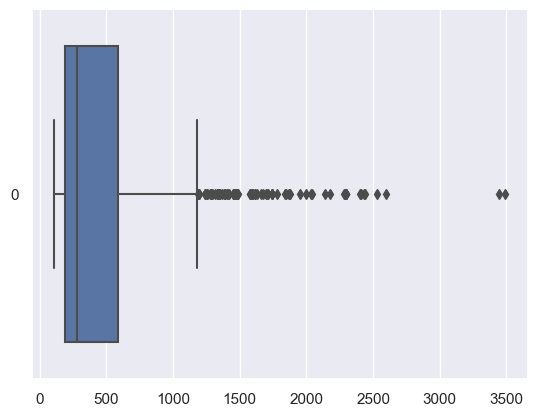

In [26]:
# Visualisation de la longueur des descriptions :
tmp = df.description.str.len()
sns.boxplot(tmp, orient='h')

In [27]:
# Création d'une colonne qui contient la longueur des descriptions (le '_' est pour nous rappelé que c'est une colonne que nous avons créée.)
df['_len_description'] = tmp
df.head()

,uniq_id,product_name,product_category_tree,image,description,name_desc_product,product_category,_len_description
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing,1420
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel. Specifications of ...,Baby Care,444
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set. Key Featu...,Baby Care,1258
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,Home Furnishing,858
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,Home Furnishing,1197


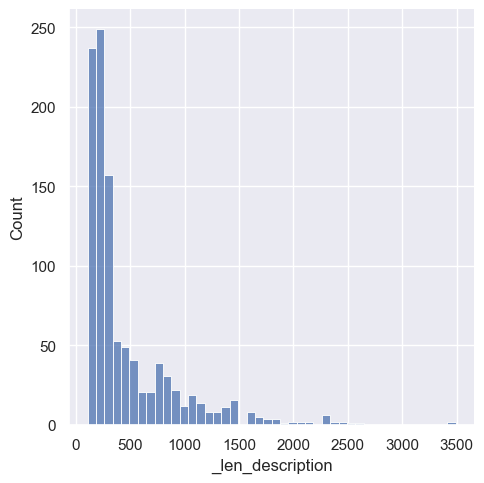

In [16]:
sns.displot(df['_len_description'])

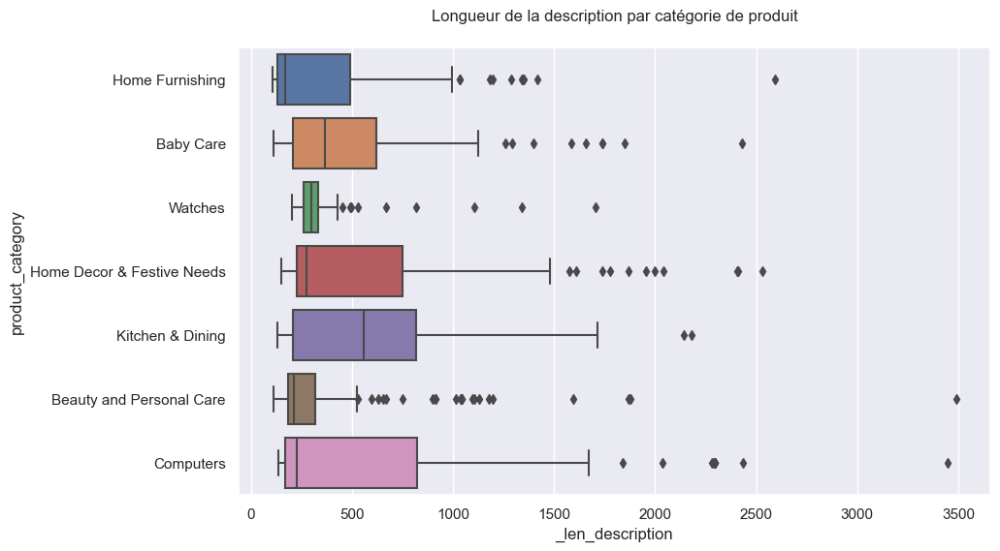

In [17]:
plt.figure(figsize=(10,6))
sns.boxplot(data = df, x= "_len_description", y = "product_category")
plt.title("Longueur de la description par catégorie de produit", pad = 20)
plt.show()

## 2. Text processing

### 2.1 Définition de fonctions :

In [7]:
# On crée une première fonction qui applique un premier "nettoyage" du texte :

def first_cleaning_text(text):
    """On retire simplement certains éléments tels que les urls ou les chiffres ou caractères spéciaux"""
    # Supprimer les URLs
    text = re.sub(r'http\S+', '', text)
    # Supprimer les nombres
    text = re.sub(r'\b\d+(?:,\d+)?(?:\.\d+)?\b', '', text)
    # Supprimer les symboles non alphabétiques
    text = re.sub(r'[^\w\s]', '', text)
    # Supprimer les tokens entre parenthèses
    text = re.sub(r'\([^()]*\)', '', text)
    return text

In [8]:
# Je crée des fonctions de preprocessing qui utilise spaCy, une pour les approches BoW et l'autre pour les approches DL
# La différence se situe dans la conservation ou non des stopwords

def spacy_preprocess_text_bow(text, 
                          rejoin=False, 
                          extra_words=None,
                          list_rare_words = None,
                          min_len_word = 0):
    """Fonction qui renvoie des tokens lemmatizés sans stop_words, ponctuation, et éventuellement d'autres paramètres, en utilisant spaCy"""

    # On commence par appliquer notre première fonction de nettoyage
    text = first_cleaning_text(text)

    # list unique words
    if not list_rare_words:
        list_rare_words = []
    
    # Puis on utilise les différentes méthodes de spaCy :
    doc = nlp(text.lower())
    tokens_list = [token.lemma_ for token in doc if not token.is_stop and not token.is_punct and not token.is_digit
                        and token.text.strip() and not token.text.isdigit() and not all(char in string.punctuation for char in token.text)]
    
    # rare words:
    non_rare_tokens = [w for w in tokens_list if w not in list_rare_words]

    # min len word:
    more_than_N = [w for w in non_rare_tokens if len(w) >= min_len_word]

    # extra words
    if extra_words:
        processed_tokens = [token for token in more_than_N if token not in extra_words]
    else:
        processed_tokens = more_than_N

    if rejoin:
        return " ".join(processed_tokens)
    else: 
        return processed_tokens
    

# Et la fonction pour le DL (word embedding) :

def spacy_preprocess_text_we(text, 
                          rejoin=False, 
                          extra_words=None,
                          list_rare_words = None,
                          min_len_word = 0):
    """Fonction qui renvoie des tokens lemmatizés éventuellement en ayant retiré certains mots, en utilisant spaCy"""

    # On commence par appliquer notre première fonction de nettoyage
    text = first_cleaning_text(text)

    # list unique words
    if not list_rare_words:
        list_rare_words = []
    
    # Puis on utilise les différentes méthodes de spaCy :
    doc = nlp(text.lower())
    tokens_list = [token.lemma_ for token in doc if not token.is_digit
                        and token.text.strip() and not token.text.isdigit() and not all(char in string.punctuation for char in token.text)]
    
    # rare words:
    non_rare_tokens = [w for w in tokens_list if w not in list_rare_words]

    # min len word:
    more_than_N = [w for w in non_rare_tokens if len(w) >= min_len_word]

    # extra words
    if extra_words:
        processed_tokens = [token for token in more_than_N if token not in extra_words]
    else:
        processed_tokens = more_than_N

    if rejoin:
        return " ".join(processed_tokens)
    else: 
        return processed_tokens

In [9]:
eng_words = [i.lower() for i in words.words()]

In [10]:
# Je crée une fonction de preprocessing qui utilise nltk :

def nltk_preprocess_text(text,
                   rejoin = False,
                   lemm_or_stemm = "stem",
                   list_rare_words = None,
                   min_len_word = 0,
                   force_is_alpha = True,
                   eng_words = None,
                   extra_words = None):
    """Fonction qui renvoie des tokens lemmatizés sans stop_words, ponctuation, et éventuellement d'autres paramètres, en utilisant nltk

    positionnal arguments:
    ------------------------
    text : str: the document (aka a text in str format) to process
    
    opt args :
    ------------------------
    rejoin : bool : if True return a string else retun the list of tokens
    lemm_or_stemm : str : if lem do lemmentize else stemmentize
    list_rare_words : list : a list of rare words to exclude
    min_len_word : int : the minimum length of words to not exclude
    force_is_alpha : int : if True, exclude all tokens with a numeric character
    eng_words : list : list of english words
    extra_words : list : list of most common words in both category

    return :
    ------------------------
    a string (if rejoin is True) or a list of tokens
    """

    # list unique words
    if not list_rare_words:
        list_rare_words = []
    
    # lower 
    text = text.lower().strip()

    # tokenize
    tokenizer = RegexpTokenizer(r"\w+")
    raw_tokens_list = tokenizer.tokenize(text)

    # stop_words
    cleaned_tokens_list = [w for w in raw_tokens_list if w not in stop_words]

    # no rare tokens
    non_rare_tokens = [w for w in cleaned_tokens_list if w not in list_rare_words]

    # no more len words
    more_than_N = [w for w in non_rare_tokens if len(w) >= min_len_word]

    # only alpha chars
    if force_is_alpha :
        alpha_tokens = [w for w in more_than_N if w.isalpha()]
    else :
        alpha_tokens = more_than_N
        
    # stemm or lemm
    if lemm_or_stemm == "lem" :
        trans = WordNetLemmatizer()
        trans_text = [trans.lemmatize(i) for i in alpha_tokens]
    else :
        trans = PorterStemmer()
        trans_text = [trans.stem(i) for i in alpha_tokens]   
        
    if eng_words :
        engl_text = [i for i in trans_text if i in eng_words]
    else :
        engl_text = trans_text

    ###########################################################
    ###########################################################
    
    # drop extra_words tokens
    if extra_words:
        final = [w for w in engl_text if w not in extra_words]
    else :
        final = engl_text
    
    ###########################################################
    ########################################################### 
    
    # return a list or a string
    if rejoin :
        return " ".join(final)
    
    return final

In [11]:
# Je crée une fonction de visualisation en wordcloud :

def wourdcloud_viz(text):
    wordcloud = WordCloud(
        random_state = 8,
        normalize_plurals = True,
        collocations = False,
        width = 600, 
        height= 300,
        max_words = 100)

    # Et on l'applique à notre texte :
    if not isinstance(text, str):
        text_string = ' '.join(text)
        wordcloud.generate(text_string)
    else:
        wordcloud.generate(text)

    # on crée une figure
    fig, ax = plt.subplots(1,1, figsize = (9,6))
    # add interpolation = bilinear to smooth things out -> permet de rendre les bords des mots plus lisses et plus esthétiques
    plt.imshow(wordcloud, interpolation='bilinear')
    # and remove the axis
    plt.axis("off")
    plt.show()

In [12]:
# je crée une fonction qui donne des infos globales sur les tokens :
def display_tokens_info(tokens) :
    """display info about corpus"""

    print(f"nb tokens : {len(tokens)}, nb tokens uniques : {len(set(tokens))}")
    print(tokens[:30])

In [29]:
df.loc[df["_len_description"].argmin(), :]

uniq_id                                   c943647eee4de99fc1b4e233b9a7f47d
product_name                                         Nkp Cotton Bath Towel
product_category_tree          ["Home Furnishing >> Bath Linen >> Towels"]
image                                 c943647eee4de99fc1b4e233b9a7f47d.jpg
description              Buy Nkp Cotton Bath Towel at Rs. 549 at Flipka...
name_desc_product        Nkp Cotton Bath Towel. Buy Nkp Cotton Bath Tow...
product_category                                           Home Furnishing
_len_description                                                       109
Name: 877, dtype: object

In [34]:
# Test des fonctions :

text = df.loc[df.index[877], "description"]
spacy_text = spacy_preprocess_text_bow(text, rejoin=True)
nltk_text = nltk_preprocess_text(text, rejoin=True)
# Différents tests :

print("Texte original :", text)
print("Nombre de caractères - texte original :",len(text))
print("")
print("Texte preprocessing spaCy (lemmatisation) :", spacy_text)
print("Nombre de caractères - texte preprocessing spaCy :",len(spacy_text))
print("")
print("Texte preprocessing nltk (stemming) :", nltk_text)
print("Nombre de caractères - texte preprocessing spaCy :",len(nltk_text))

Texte original : Buy Nkp Cotton Bath Towel at Rs. 549 at Flipkart.com. Only Genuine Products. Free Shipping. Cash On Delivery!
Nombre de caractères - texte original : 109

Texte preprocessing spaCy (lemmatisation) : buy nkp cotton bath towel rs flipkartcom genuine product free shipping cash delivery
Nombre de caractères - texte preprocessing spaCy : 84

Texte preprocessing nltk (stemming) : buy nkp cotton bath towel rs flipkart com genuin product free ship cash deliveri
Nombre de caractères - texte preprocessing spaCy : 80


### 2.2 Création du corpus global

In [24]:
# Création du corpus : l'ensemble des descriptions de produits

raw_corpus = "".join(df.name_desc_product.values)
raw_corpus[:1_000]

'Elegance Polyester Multicolor Abstract Eyelet Door Curtain. Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegan

### 2.3 Preprocessing avec spaCy

#### 2.3.1 Tokenization

In [25]:
corpus = spacy_preprocess_text_bow(raw_corpus)

In [26]:
display_tokens_info(corpus)

nb tokens : 59059, nb tokens uniques : 5761
['elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'key', 'feature', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtainelegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'cm', 'height', 'pack', 'price', 'rs', 'curtain']


En n'étant pas très "sélectif" on a un total de 52528 tokens et 5410 tokens uniques.

In [27]:
# Visualisation des tokens les plus courant :

tmp = pd.Series(corpus).value_counts()
tmp.head(20)

product        862
rs             760
cm             634
free           615
buy            583
replacement    568
genuine        564
cash           564
shipping       564
price          556
day            550
mug            516
watch          503
flipkartcom    467
set            435
baby           408
feature        406
online         396
design         387
analog         382
Name: count, dtype: int64

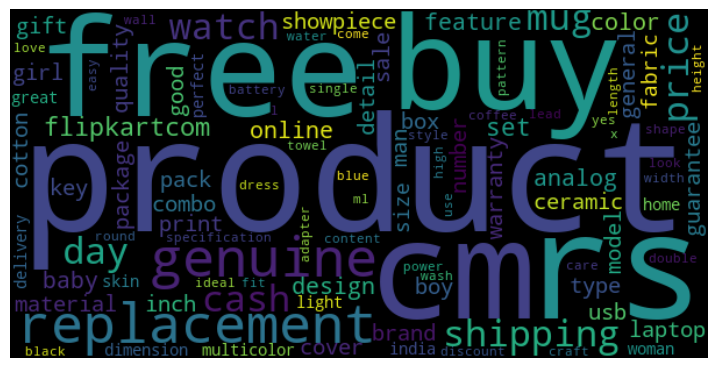

In [28]:
wourdcloud_viz(corpus)

Dans les tokens les plus courant on voit pas mal d'éléments qui ne décrivent pas vraiment les produits, et qu'il serait bon d'ajouter à une liste d'éléments à exclure.

In [29]:
# Visualisation de certains des mots les moins courants :

tmp.tail(20)

yrs                   1
yve                   1
deliverybabybucket    1
g00004gld_blk         1
inchesvrct            1
1palito               1
blackv9               1
v9                    1
indha                 1
guaranteeindha        1
blackdreamshome       1
guaranteeniksale      1
deliverymh            1
shrikant              1
sofab002              1
guaranteeshrikant     1
kgkandyfloss          1
flipkartcomornate     1
flipkartcomrtd        1
guaranteeuberlyfe     1
Name: count, dtype: int64

On a beaucoup de mots n'apparaissant qu'une fois, mais certains sont peut-être assez spécifiques à la catégorie du produit concerné, ça me paraît délicat de les retirer.

#### 2.3.2 Extra_words

In [30]:
# On crée une liste de mots à exclure spécifiques à notre jeu de données :

extra_words = ['shipping', 'buy', 'online', 'delivery', 'cash', 'guarantee', 'genuine', 'free', 'ship', 'product', 
               'price', 'discount', 'feature', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key']

Par ailleurs on note la présence de certains mots tels que 'cm', 'rs', nous indiquant qu'il peut être pertinent d'ajouter un filtre sur la longueur des mots.

In [31]:
# je relance ma fonction de preprocessing en ajoutant des paramètres :

corpus = spacy_preprocess_text_bow(raw_corpus, extra_words=extra_words, min_len_word=3)
display_tokens_info(corpus)

nb tokens : 49179, nb tokens uniques : 5639
['elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtainelegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'curtain', 'enhance', 'look', 'interiorsthis', 'curtain', 'high']


On a maintenant 49179 tokens au total et 5639 tokens uniques.

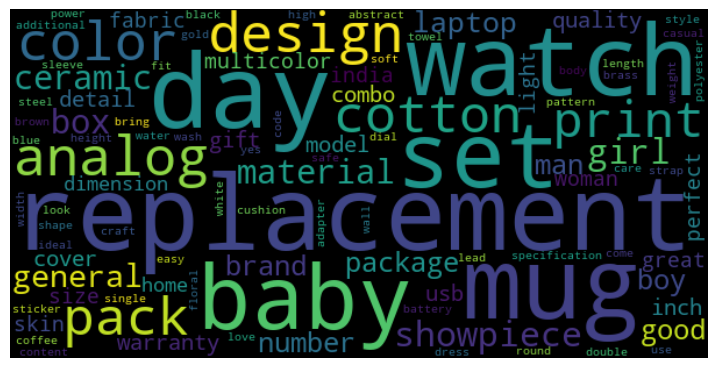

In [32]:
# Visualisation :
wourdcloud_viz(corpus)

#### 2.3.3. Analyse par catégories de produits

On peut regarder si certains tokens sont communs et très fréquents pour toutes les catégories de produits.

In [33]:
# On crée des dataframes pour chaque catégories de produits :

df_0 = df[df.product_category == "Home Furnishing"]
df_1 = df[df.product_category == "Baby Care"]
df_2 = df[df.product_category == "Watches"]
df_3 = df[df.product_category == "Home Decor & Festive Needs"]
df_4 = df[df.product_category == "Kitchen & Dining"]
df_5 = df[df.product_category == "Beauty and Personal Care"]
df_6 = df[df.product_category == "Computers"]

# un corpus par catégorie :

corpus_0 = " ".join(df_0.name_desc_product)
corpus_1 = " ".join(df_1.name_desc_product)
corpus_2 = " ".join(df_2.name_desc_product)
corpus_3 = " ".join(df_3.name_desc_product)
corpus_4 = " ".join(df_4.name_desc_product)
corpus_5 = " ".join(df_5.name_desc_product)
corpus_6 = " ".join(df_6.name_desc_product)

In [34]:
corpus_0

'Elegance Polyester Multicolor Abstract Eyelet Door Curtain. Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegan

In [35]:
# Process des 7 corpus, le tout a pris 1m46s

corpus_0 = spacy_preprocess_text_bow(corpus_0,
                          rejoin = False,
                          extra_words=extra_words,
                          min_len_word=3)

corpus_1 = spacy_preprocess_text_bow(corpus_1,
                          rejoin = False,
                          extra_words=extra_words,
                          min_len_word=3)

corpus_2 = spacy_preprocess_text_bow(corpus_2,
                          rejoin = False,
                          extra_words=extra_words,
                          min_len_word=3)

corpus_3 = spacy_preprocess_text_bow(corpus_3,
                          rejoin = False,
                          extra_words=extra_words,
                          min_len_word=3)

corpus_4 = spacy_preprocess_text_bow(corpus_4,
                          rejoin = False,
                          extra_words=extra_words,
                          min_len_word=3)

corpus_5 = spacy_preprocess_text_bow(corpus_5,
                          rejoin = False,
                          extra_words=extra_words,
                          min_len_word=3)

corpus_6 = spacy_preprocess_text_bow(corpus_6,
                          rejoin = False,
                          extra_words=extra_words,
                          min_len_word=3)

Home Furnishing


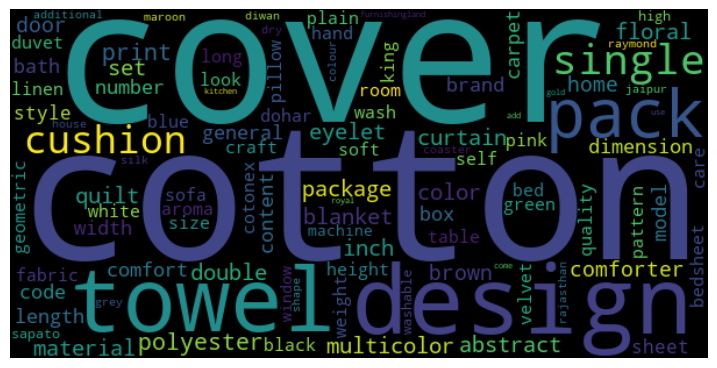

Baby Care


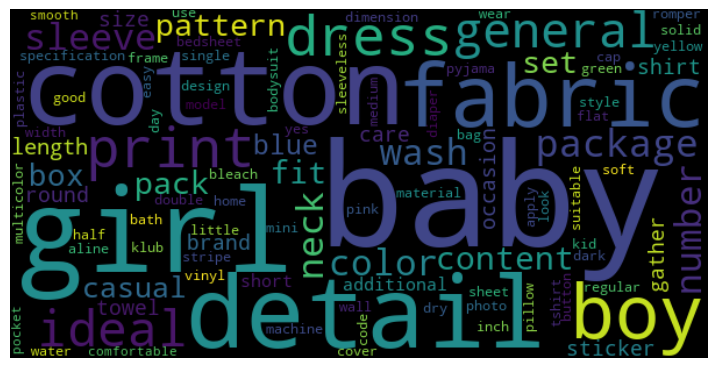

Watches


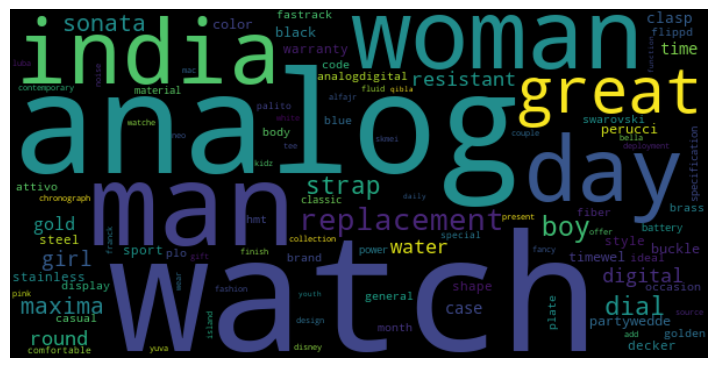

Home Decor & Festive Needs


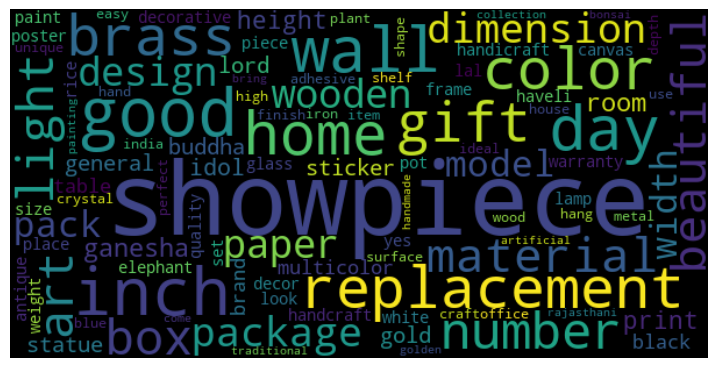

Kitchen & Dining


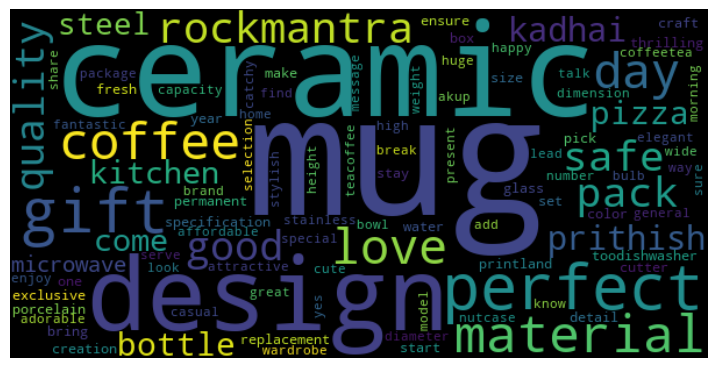

Beauty and Personal Care


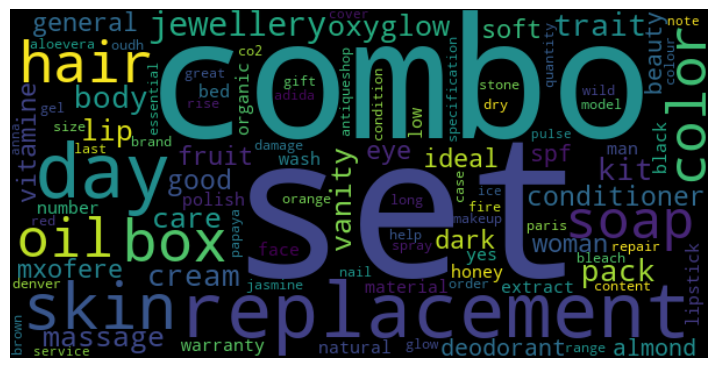

Computers


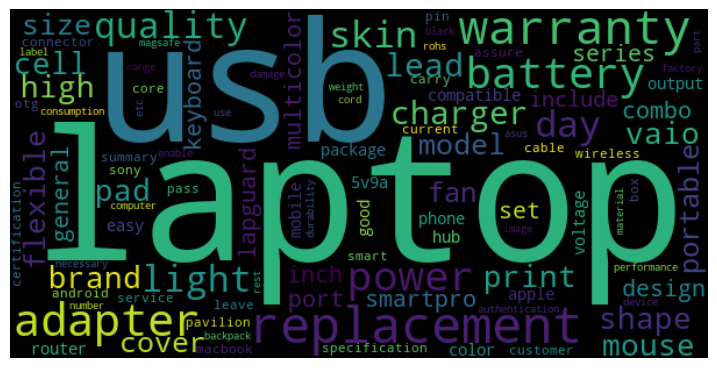

In [36]:
# Visualisation

liste_corpus = [corpus_0, corpus_1, corpus_2, corpus_3, corpus_4, corpus_5, corpus_6]

for cat, corp in zip(df.product_category.unique().tolist(), liste_corpus):
    print(cat)
    wourdcloud_viz(corp)

In [37]:
# On regarde les doublons, les mots présents à la fois dans tous les corpus :
n = 100
doublons = [i for i in pd.Series(corpus_0).value_counts().head(n).index
            if i in pd.Series(corpus_1).value_counts().head(n).index
            if i in pd.Series(corpus_2).value_counts().head(n).index
            if i in pd.Series(corpus_3).value_counts().head(n).index
            if i in pd.Series(corpus_4).value_counts().head(n).index
            if i in pd.Series(corpus_5).value_counts().head(n).index
            if i in pd.Series(corpus_6).value_counts().head(n).index]
doublons

['color', 'material', 'brand', 'general']

#### 2.3.4. MAJ extra_words

In [38]:
# On crée une nouvelle liste d'extra_words :
new_extra_words = extra_words + ['color', 'material', 'brand', 'box', 'general', 'day']

nb tokens : 47118, nb tokens uniques : 5633
['elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtainelegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'curtain', 'enhance', 'look', 'interiorsthis', 'curtain', 'high']


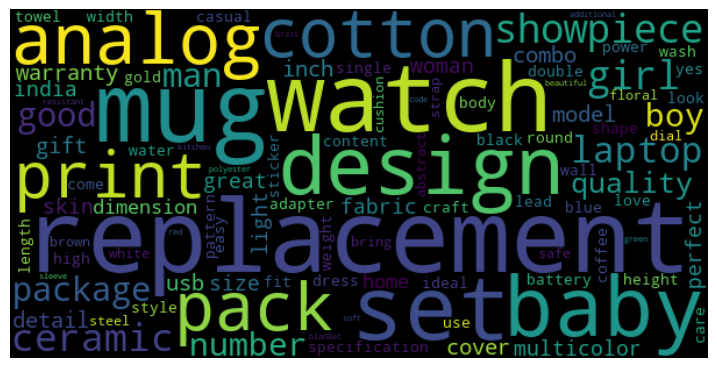

In [39]:
# Retour sur le corpus global :
corpus = spacy_preprocess_text_bow(raw_corpus,
                               rejoin = False,
                               extra_words=new_extra_words,
                               min_len_word=3)
display_tokens_info(corpus)
wourdcloud_viz(corpus)

#### 2.3.5. Final cleaning

In [40]:
# On ajoute la description preprocessée avec spaCy à notre dataframe :

def spacy_final_clean_bow(text) :
    """perform our final cleaning"""

    new_doc = spacy_preprocess_text_bow(text,
                             rejoin = True,
                             extra_words=new_extra_words,
                             min_len_word=3)
    return new_doc

df['spacy_description_bow'] = df.name_desc_product.apply(spacy_final_clean_bow)
df.head()

,uniq_id,product_name,product_category_tree,image,description,name_desc_product,product_category,_len_description,spacy_description_bow
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing,1420,elegance polyester multicolor abstract eyelet ...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel. Specifications of ...,Baby Care,444,sathiyas cotton bath towel specification sathi...
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set. Key Featu...,Baby Care,1258,eurospa cotton terry face towel set eurospa co...
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,Home Furnishing,858,santosh royal fashion cotton print king size d...
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,Home Furnishing,1197,jaipur print cotton floral king size double be...


In [41]:
# On ajoute la description preprocessée, pour l'approche DL, avec spaCy à notre dataframe :

def spacy_final_clean_we(text) :
    """perform our final cleaning"""

    new_doc = spacy_preprocess_text_we(text,
                             rejoin = True,
                             extra_words=new_extra_words,
                             min_len_word=3)
    return new_doc

df['spacy_description_we'] = df.name_desc_product.apply(spacy_final_clean_we)
df.head()

,uniq_id,product_name,product_category_tree,image,description,name_desc_product,product_category,_len_description,spacy_description_bow,spacy_description_we
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing,1420,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel. Specifications of ...,Baby Care,444,sathiyas cotton bath towel specification sathi...,sathiyas cotton bath towel specification sathi...
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set. Key Featu...,Baby Care,1258,eurospa cotton terry face towel set eurospa co...,eurospa cotton terry face towel set eurospa co...
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,Home Furnishing,858,santosh royal fashion cotton print king size d...,santosh royal fashion cotton print king size d...
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,Home Furnishing,1197,jaipur print cotton floral king size double be...,jaipur print cotton floral king size double be...


<Axes: >

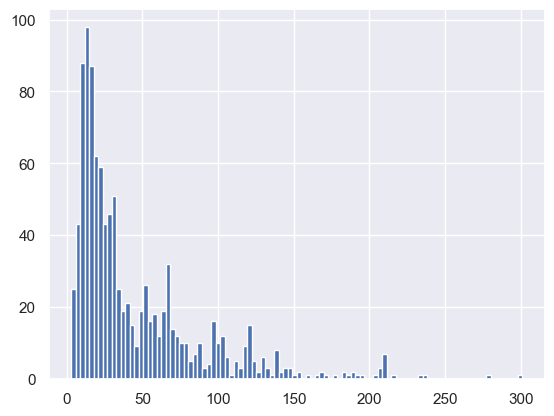

In [42]:
# On regarde la distribution du nombre de tokens sur la description "modifiée" :
df.spacy_description_bow.apply(lambda txt : len(txt.split())).hist(bins = 100)

<Axes: >

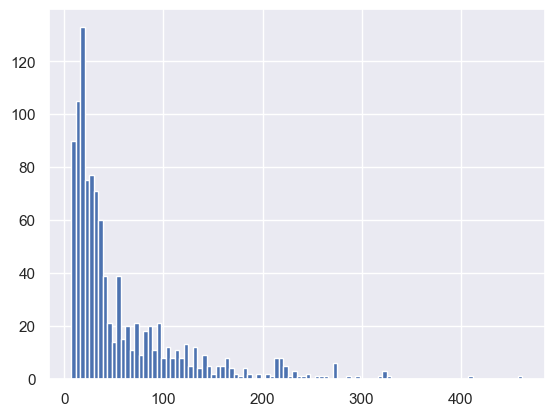

In [43]:
# On regarde la distribution du nombre de tokens sur la description "modifiée" :
df.spacy_description_we.apply(lambda txt : len(txt.split())).hist(bins = 100)

In [44]:
df.isna().sum()

uniq_id                  0
product_name             0
product_category_tree    0
image                    0
description              0
name_desc_product        0
product_category         0
_len_description         0
spacy_description_bow    0
spacy_description_we     0
dtype: int64

### 3. Preprocessing avec nltk :

In [15]:
# Stop words :
stop_words = set(stopwords.words('english'))

In [46]:
# eng_words :
eng_words = [i.lower() for i in words.words()]

In [47]:
# Transformation par Stemmer :
ps = PorterStemmer()
eng_words_stem = [ps.stem(i) for i in eng_words]

# Transformation par Lemmatizer :
lm = WordNetLemmatizer()
eng_words_lem = [lm.lemmatize(i) for i in eng_words]

#### 3.1 Création du corpus global

In [48]:
# Création du corpus : l'ensemble des descriptions de produits

raw_corpus = "".join(df.name_desc_product.values)
raw_corpus[:1_000]

'Elegance Polyester Multicolor Abstract Eyelet Door Curtain. Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegan

#### 3.2 Preprocessing avec nltk -> stemming

##### 3.2.1 Tokenization

In [49]:
corpus = nltk_preprocess_text(raw_corpus,
                              rejoin = False,
                              lemm_or_stemm="stem",
                              min_len_word=0,
                              eng_words=eng_words_stem)
display_tokens_info(corpus)

nb tokens : 52692, nb tokens uniques : 2929
['eleg', 'polyest', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'key', 'featur', 'eleg', 'polyest', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'eleg', 'polyest', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'price', 'curtain', 'enhanc']


En n'étant pas très "sélectif" on a un total de 52692 tokens et 2929 tokens uniques. C'est nettement moins qu'avec le lemmatizer de spaCy.

In [50]:
# Visualisation des tokens les plus courant :

tmp = pd.Series(corpus).value_counts()
tmp.head(20)

product     871
free        622
buy         582
replac      579
ship        570
deliveri    567
genuin      564
cash        564
price       561
day         556
mug         524
watch       510
guarante    473
set         454
design      430
babi        413
featur      408
analog      393
color       392
specif      380
Name: count, dtype: int64

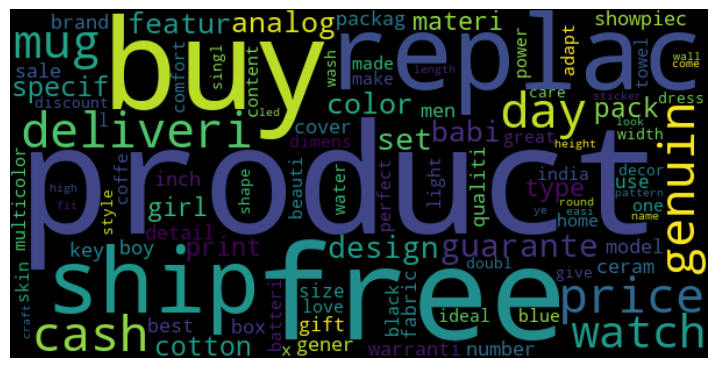

In [51]:
wourdcloud_viz(corpus)

Dans les tokens les plus courant on voit pas mal d'éléments qui ne décrivent pas vraiment les produits, et qu'il serait bon d'ajouter à une liste d'éléments à exclure.

In [52]:
# Visualisation de certains des mots les moins courants :

tmp.tail(20)

joint         1
lay           1
salt          1
foundat       1
caress        1
produc        1
comb          1
potenti       1
hurt          1
mathemat      1
drape         1
troublesom    1
signatur      1
rosemari      1
navi          1
challeng      1
angelica      1
futur         1
particular    1
caught        1
Name: count, dtype: int64

##### 3.2.2. Extra_words

In [53]:
tmp.head(20)

product     871
free        622
buy         582
replac      579
ship        570
deliveri    567
genuin      564
cash        564
price       561
day         556
mug         524
watch       510
guarante    473
set         454
design      430
babi        413
featur      408
analog      393
color       392
specif      380
Name: count, dtype: int64

In [54]:
extra_words_stem = ['replac', 'buy', 'deliveri', 'cash', 'guarante', 'genuin', 'free', 'ship', 'product', 
               'price', 'discount', 'featur', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key']

In [55]:
# je relance ma fonction de preprocessing en ajoutant des paramètres :

corpus = nltk_preprocess_text(raw_corpus,
                              rejoin = False,
                              lemm_or_stemm="stem",
                              min_len_word=0,
                              eng_words=eng_words_stem,
                              extra_words=extra_words_stem)
display_tokens_info(corpus)

nb tokens : 45384, nb tokens uniques : 2914
['eleg', 'polyest', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'eleg', 'polyest', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'eleg', 'polyest', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'curtain', 'enhanc', 'look', 'interior', 'curtain']


On a maintenant un total de 45384 tokens et 2914 tokens uniques.

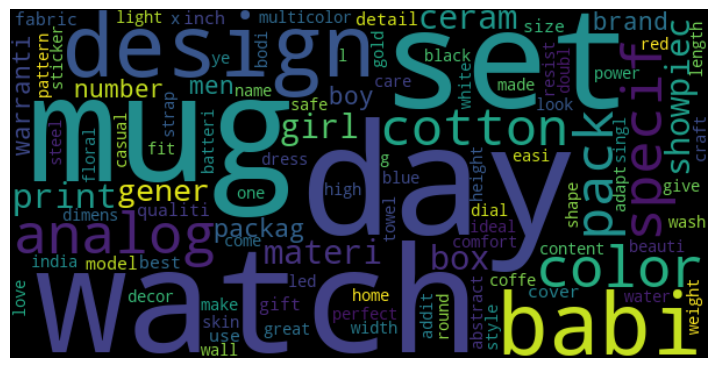

In [56]:
# Visualisation :
wourdcloud_viz(corpus)

##### 3.2.3. Analyse par catégories de produits

In [57]:
# On crée des dataframes pour chaque catégories de produits :

df_0 = df[df.product_category == "Home Furnishing"]
df_1 = df[df.product_category == "Baby Care"]
df_2 = df[df.product_category == "Watches"]
df_3 = df[df.product_category == "Home Decor & Festive Needs"]
df_4 = df[df.product_category == "Kitchen & Dining"]
df_5 = df[df.product_category == "Beauty and Personal Care"]
df_6 = df[df.product_category == "Computers"]

# un corpus par catégorie :

corpus_0 = " ".join(df_0.name_desc_product)
corpus_1 = " ".join(df_1.name_desc_product)
corpus_2 = " ".join(df_2.name_desc_product)
corpus_3 = " ".join(df_3.name_desc_product)
corpus_4 = " ".join(df_4.name_desc_product)
corpus_5 = " ".join(df_5.name_desc_product)
corpus_6 = " ".join(df_6.name_desc_product)

In [58]:
# Process des 7 corpus, le tout a pris 1m46s

corpus_0 = nltk_preprocess_text(corpus_0,
                          rejoin = False,
                          lemm_or_stemm="stem",
                          min_len_word=0,
                          eng_words=eng_words_stem,
                          extra_words=extra_words_stem)

corpus_1 = nltk_preprocess_text(corpus_1,
                          rejoin = False,
                              lemm_or_stemm="stem",
                              min_len_word=0,
                              eng_words=eng_words_stem,
                              extra_words=extra_words_stem)

corpus_2 = nltk_preprocess_text(corpus_2,
                          rejoin = False,
                              lemm_or_stemm="stem",
                              min_len_word=0,
                              eng_words=eng_words_stem,
                              extra_words=extra_words_stem)

corpus_3 = nltk_preprocess_text(corpus_3,
                          rejoin = False,
                              lemm_or_stemm="stem",
                              min_len_word=0,
                              eng_words=eng_words_stem,
                              extra_words=extra_words_stem)

corpus_4 = nltk_preprocess_text(corpus_4,
                          rejoin = False,
                              lemm_or_stemm="stem",
                              min_len_word=0,
                              eng_words=eng_words_stem,
                              extra_words=extra_words_stem)

corpus_5 = nltk_preprocess_text(corpus_5,
                          rejoin = False,
                              lemm_or_stemm="stem",
                              min_len_word=0,
                              eng_words=eng_words_stem,
                              extra_words=extra_words_stem)

corpus_6 = nltk_preprocess_text(corpus_6,
                          rejoin = False,
                              lemm_or_stemm="stem",
                              min_len_word=0,
                              eng_words=eng_words_stem,
                              extra_words=extra_words_stem)

Home Furnishing


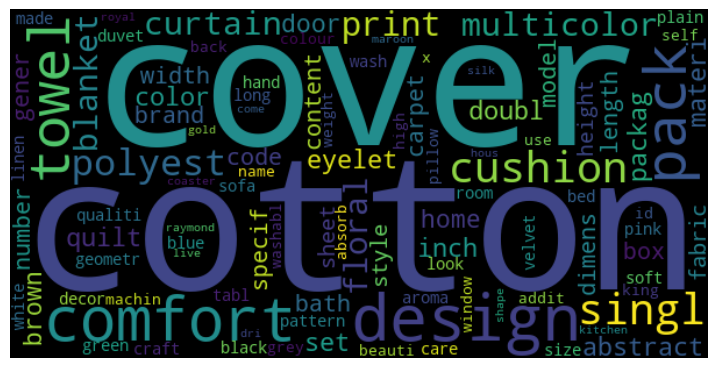

Baby Care


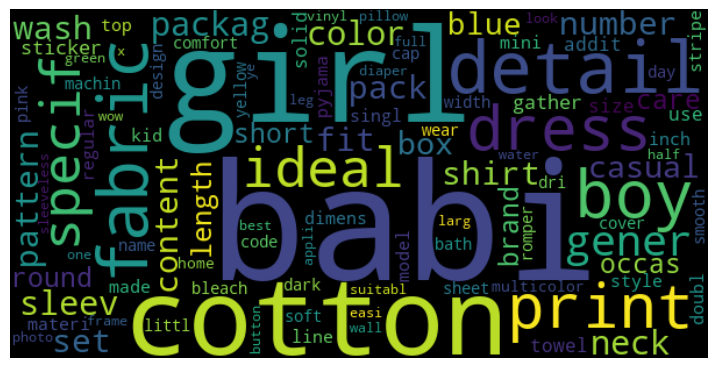

Watches


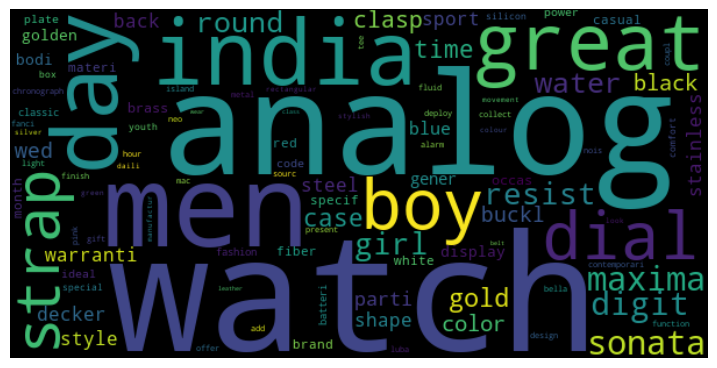

Home Decor & Festive Needs


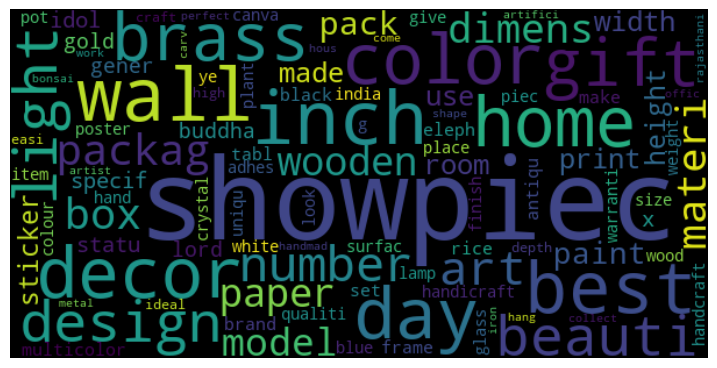

Kitchen & Dining


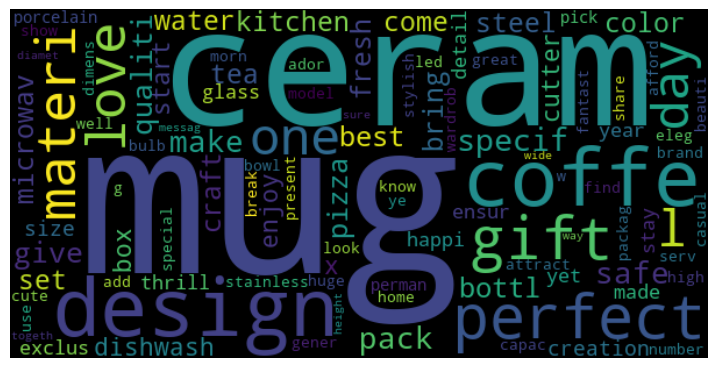

Beauty and Personal Care


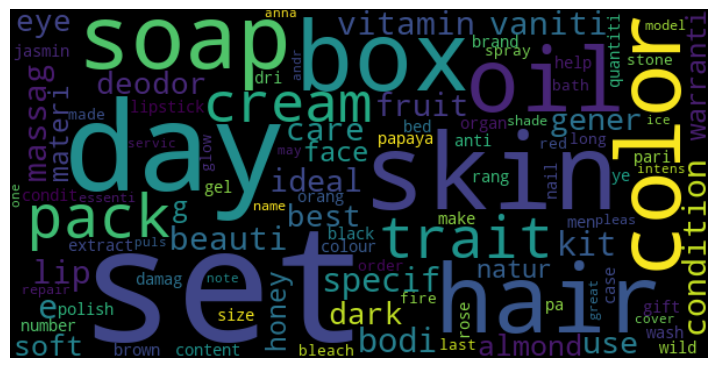

Computers


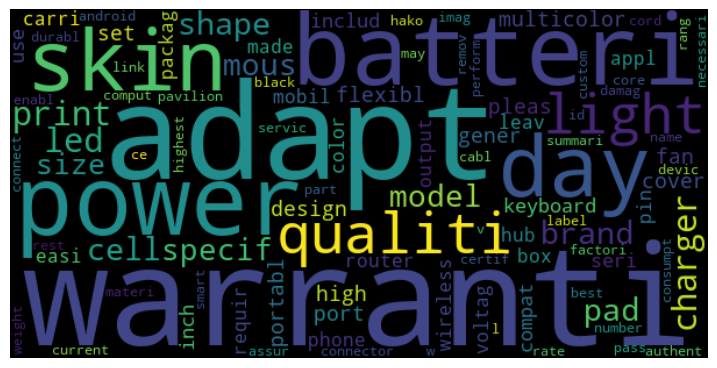

In [59]:
# Visualisation

liste_corpus = [corpus_0, corpus_1, corpus_2, corpus_3, corpus_4, corpus_5, corpus_6]

for cat, corp in zip(df.product_category.unique().tolist(), liste_corpus):
    print(cat)
    wourdcloud_viz(corp)

In [60]:
# On regarde les doublons, les mots présents à la fois dans tous les corpus :
n = 100
doublons = [i for i in pd.Series(corpus_0).value_counts().head(n).index
            if i in pd.Series(corpus_1).value_counts().head(n).index
            if i in pd.Series(corpus_2).value_counts().head(n).index
            if i in pd.Series(corpus_3).value_counts().head(n).index
            if i in pd.Series(corpus_4).value_counts().head(n).index
            if i in pd.Series(corpus_5).value_counts().head(n).index
            if i in pd.Series(corpus_6).value_counts().head(n).index]
doublons

['color', 'materi', 'brand', 'specif', 'box', 'gener']

##### 3.2.4. MAJ extra_words_stem

In [61]:
new_extra_words_stem = extra_words_stem + ['color', 'materi', 'brand', 'specif', 'box', 'gener', 'day']

nb tokens : 42065, nb tokens uniques : 2869
['eleg', 'polyest', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'eleg', 'polyest', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'eleg', 'polyest', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'curtain', 'enhanc', 'look', 'interior', 'curtain']


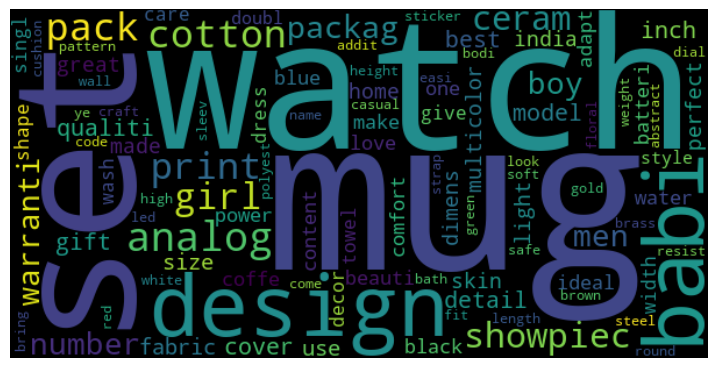

In [62]:
# Retour sur le corpus global :
corpus = nltk_preprocess_text(raw_corpus,
                              rejoin = False,
                              lemm_or_stemm="stem",
                              min_len_word=3,
                              eng_words=eng_words_stem,
                              extra_words=new_extra_words_stem)
display_tokens_info(corpus)
wourdcloud_viz(corpus)

##### 3.2.5. Final cleaning nltk stem

In [63]:
from pandarallel import pandarallel
# pandarallel 
pandarallel.initialize(progress_bar=True,
                       nb_workers = 6,
                       # verbose = 1
                       )

def final_clean_nltk_stem(text):
    import nltk
    from nltk import WordNetLemmatizer, PorterStemmer
    from nltk.tokenize import word_tokenize, wordpunct_tokenize
    from nltk.corpus import words
    from nltk.corpus import stopwords
    from nltk.tokenize import RegexpTokenizer
    # Stop words :
    stop_words = set(stopwords.words('english'))
    # Je crée une fonction de preprocessing qui utilise nltk :

    def nltk_preprocess_text(text,
                   rejoin = False,
                   lemm_or_stemm = "stem",
                   list_rare_words = None,
                   min_len_word = 0,
                   force_is_alpha = True,
                   eng_words = None,
                   extra_words = None):
        """Fonction qui renvoie des tokens lemmatizés sans stop_words, ponctuation, et éventuellement d'autres paramètres, en utilisant nltk

        positionnal arguments:
        ------------------------
        text : str: the document (aka a text in str format) to process
    
        opt args :
        ------------------------
        rejoin : bool : if True return a string else retun the list of tokens
        lemm_or_stemm : str : if lem do lemmentize else stemmentize
        list_rare_words : list : a list of rare words to exclude
        min_len_word : int : the minimum length of words to not exclude
        force_is_alpha : int : if 1, exclude all tokens with a numeric character
        eng_words : list : list of english words
        extra_words : list : list of most common words in both category

        return :
        ------------------------
        a string (if rejoin is True) or a list of tokens
        """

        # list unique words
        if not list_rare_words:
            list_rare_words = []
    
        # lower 
        text = text.lower().strip()

        # tokenize
        tokenizer = RegexpTokenizer(r"\w+")
        raw_tokens_list = tokenizer.tokenize(text)

        # stop_words
        cleaned_tokens_list = [w for w in raw_tokens_list if w not in stop_words]

        # no rare tokens
        non_rare_tokens = [w for w in cleaned_tokens_list if w not in list_rare_words]

        # no more len words
        more_than_N = [w for w in non_rare_tokens if len(w) >= min_len_word]

        # only alpha chars
        if force_is_alpha :
            alpha_tokens = [w for w in more_than_N if w.isalpha()]
        else :
            alpha_tokens = more_than_N
        
        # stemm or lemm
        if lemm_or_stemm == "lem" :
            trans = WordNetLemmatizer()
            trans_text = [trans.lemmatize(i) for i in alpha_tokens]
        else :
            trans = PorterStemmer()
            trans_text = [trans.stem(i) for i in alpha_tokens]   
        
        eng_words = [i.lower() for i in words.words()]
        # Transformation par Stemmer :
        ps = PorterStemmer()
        eng_words_stem = [ps.stem(i) for i in eng_words]
        
        if eng_words :
            engl_text = [i for i in trans_text if i in eng_words]
        else :
            engl_text = trans_text

        ###########################################################
        ###########################################################
    
        # drop extra_words tokens
        new_extra_words_stem = ['replac', 'buy', 'deliveri', 'cash', 'guarante', 'genuin', 'free', 'ship', 'product', 
               'price', 'discount', 'featur', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key'] + ['color', 'materi', 'brand', 'specif', 'box', 'gener', 'day']
        if extra_words:
            final = [w for w in engl_text if w not in extra_words]
        else :
            final = engl_text
    
        ###########################################################
        ########################################################### 
    
        # return a list or a string
        if rejoin :
            return " ".join(final)
    
        return final
    

    eng_words = [i.lower() for i in words.words()]
    # Transformation par Stemmer :
    ps = PorterStemmer()
    eng_words_stem = [ps.stem(i) for i in eng_words]
    new_extra_words_stem = ['replac', 'buy', 'deliveri', 'cash', 'guarante', 'genuin', 'free', 'ship', 'product', 
               'price', 'discount', 'featur', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key'] + ['color', 'materi', 'brand', 'specif', 'box', 'gener', 'day']
    new_doc = nltk_preprocess_text(text,
                             rejoin = True,
                             lemm_or_stemm="stem",
                             extra_words=new_extra_words_stem,
                             min_len_word=3,
                             eng_words=eng_words_stem
                             )
    return new_doc

df['nltk_stem_description'] = df.name_desc_product.parallel_apply(final_clean_nltk_stem)
df.head()

INFO: Pandarallel will run on 6 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


,uniq_id,product_name,product_category_tree,image,description,name_desc_product,product_category,_len_description,spacy_description_bow,spacy_description_we,nltk_stem_description
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing,1420,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...,multicolor abstract eyelet door curtain multic...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel. Specifications of ...,Baby Care,444,sathiyas cotton bath towel specification sathi...,sathiyas cotton bath towel specification sathi...,cotton bath towel cotton bath towel bath towel...
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set. Key Featu...,Baby Care,1258,eurospa cotton terry face towel set eurospa co...,eurospa cotton terry face towel set eurospa co...,cotton terri face towel set cotton terri face ...
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,Home Furnishing,858,santosh royal fashion cotton print king size d...,santosh royal fashion cotton print king size d...,royal fashion cotton print king size royal fas...
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,Home Furnishing,1197,jaipur print cotton floral king size double be...,jaipur print cotton floral king size double be...,print cotton floral king size print cotton flo...


In [64]:
# Même chose mais sans la liste eng_words :

from pandarallel import pandarallel
# pandarallel 
pandarallel.initialize(progress_bar=True,
                       nb_workers = 6,
                       # verbose = 1
                       )

def final_clean_nltk_stem(text):
    import nltk
    from nltk import WordNetLemmatizer, PorterStemmer
    from nltk.tokenize import word_tokenize, wordpunct_tokenize
    from nltk.corpus import words
    from nltk.corpus import stopwords
    from nltk.tokenize import RegexpTokenizer
    # Stop words :
    stop_words = set(stopwords.words('english'))
    # Je crée une fonction de preprocessing qui utilise nltk :

    def nltk_preprocess_text(text,
                   rejoin = False,
                   lemm_or_stemm = "stem",
                   list_rare_words = None,
                   min_len_word = 0,
                   force_is_alpha = True,
                   eng_words = None,
                   extra_words = None):
        """Fonction qui renvoie des tokens lemmatizés sans stop_words, ponctuation, et éventuellement d'autres paramètres, en utilisant nltk

        positionnal arguments:
        ------------------------
        text : str: the document (aka a text in str format) to process
    
        opt args :
        ------------------------
        rejoin : bool : if True return a string else retun the list of tokens
        lemm_or_stemm : str : if lem do lemmentize else stemmentize
        list_rare_words : list : a list of rare words to exclude
        min_len_word : int : the minimum length of words to not exclude
        force_is_alpha : int : if 1, exclude all tokens with a numeric character
        eng_words : list : list of english words
        extra_words : list : list of most common words in both category

        return :
        ------------------------
        a string (if rejoin is True) or a list of tokens
        """

        # list unique words
        if not list_rare_words:
            list_rare_words = []
    
        # lower 
        text = text.lower().strip()

        # tokenize
        tokenizer = RegexpTokenizer(r"\w+")
        raw_tokens_list = tokenizer.tokenize(text)

        # stop_words
        cleaned_tokens_list = [w for w in raw_tokens_list if w not in stop_words]

        # no rare tokens
        non_rare_tokens = [w for w in cleaned_tokens_list if w not in list_rare_words]

        # no more len words
        more_than_N = [w for w in non_rare_tokens if len(w) >= min_len_word]

        # only alpha chars
        if force_is_alpha :
            alpha_tokens = [w for w in more_than_N if w.isalpha()]
        else :
            alpha_tokens = more_than_N
        
        # stemm or lemm
        if lemm_or_stemm == "lem" :
            trans = WordNetLemmatizer()
            trans_text = [trans.lemmatize(i) for i in alpha_tokens]
        else :
            trans = PorterStemmer()
            trans_text = [trans.stem(i) for i in alpha_tokens]   
        
        eng_words = [i.lower() for i in words.words()]
        # Transformation par Stemmer :
        ps = PorterStemmer()
        eng_words_stem = [ps.stem(i) for i in eng_words]
        
        if eng_words :
            engl_text = [i for i in trans_text if i in eng_words]
        else :
            engl_text = trans_text

        ###########################################################
        ###########################################################
    
        # drop extra_words tokens
        extra_words_stem = ['buy', 'deliveri', 'cash', 'guarante', 'genuin', 'free', 'ship', 'product', 
               'price', 'discount', 'featur', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key']
        new_extra_words_stem = ['replac', 'buy', 'deliveri', 'cash', 'guarante', 'genuin', 'free', 'ship', 'product', 
               'price', 'discount', 'featur', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key'] + ['color', 'materi', 'brand', 'specif', 'box', 'gener', 'day']
        if extra_words:
            final = [w for w in engl_text if w not in extra_words]
        else :
            final = engl_text
    
        ###########################################################
        ########################################################### 
    
        # return a list or a string
        if rejoin :
            return " ".join(final)
    
        return final
    
    
    eng_words = [i.lower() for i in words.words()]
    # Transformation par Stemmer :
    ps = PorterStemmer()
    eng_words_stem = [ps.stem(i) for i in eng_words]
    
    extra_words_stem = ['buy', 'deliveri', 'cash', 'guarante', 'genuin', 'free', 'ship', 'product', 
               'price', 'discount', 'featur', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key']
    new_extra_words_stem = ['replac', 'buy', 'deliveri', 'cash', 'guarante', 'genuin', 'free', 'ship', 'product', 
               'price', 'discount', 'featur', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key'] + ['color', 'materi', 'brand', 'specif', 'box', 'gener', 'day']
    new_doc = nltk_preprocess_text(text,
                             rejoin = True,
                             lemm_or_stemm="stem",
                             extra_words=extra_words_stem,
                             min_len_word=3,
                             eng_words=None
                             )
    return new_doc

df['nltk_stem_description_less_strict'] = df.name_desc_product.parallel_apply(final_clean_nltk_stem)
df.head()

INFO: Pandarallel will run on 6 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


,uniq_id,product_name,product_category_tree,image,description,name_desc_product,product_category,_len_description,spacy_description_bow,spacy_description_we,nltk_stem_description,nltk_stem_description_less_strict
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing,1420,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...,multicolor abstract eyelet door curtain multic...,multicolor abstract eyelet door curtain multic...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel. Specifications of ...,Baby Care,444,sathiyas cotton bath towel specification sathi...,sathiyas cotton bath towel specification sathi...,cotton bath towel cotton bath towel bath towel...,cotton bath towel cotton bath towel bath towel...
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set. Key Featu...,Baby Care,1258,eurospa cotton terry face towel set eurospa co...,eurospa cotton terry face towel set eurospa co...,cotton terri face towel set cotton terri face ...,cotton terri face towel set cotton terri face ...
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,Home Furnishing,858,santosh royal fashion cotton print king size d...,santosh royal fashion cotton print king size d...,royal fashion cotton print king size royal fas...,royal fashion cotton print king size royal fas...
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,Home Furnishing,1197,jaipur print cotton floral king size double be...,jaipur print cotton floral king size double be...,print cotton floral king size print cotton flo...,print cotton floral king size print cotton flo...


<Axes: >

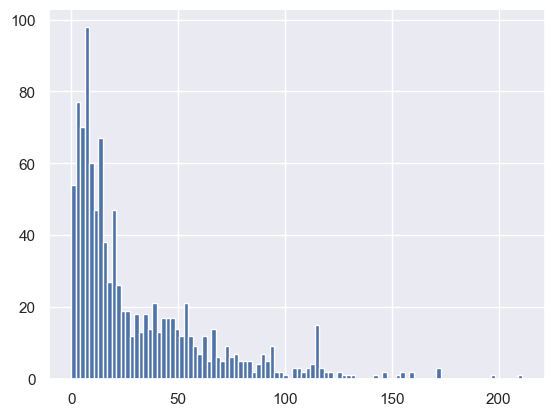

In [65]:
# On regarde la distribution du nombre de tokens sur la description "modifiée" :
df.nltk_stem_description.apply(lambda txt : len(txt.split())).hist(bins = 100)

In [66]:
df.isna().sum()

uniq_id                              0
product_name                         0
product_category_tree                0
image                                0
description                          0
name_desc_product                    0
product_category                     0
_len_description                     0
spacy_description_bow                0
spacy_description_we                 0
nltk_stem_description                0
nltk_stem_description_less_strict    0
dtype: int64

#### 3.3 Preprocessing avec nltk -> lemmatization

In [67]:
# Stop words :
stop_words = set(stopwords.words('english'))

In [68]:
# eng_words :
eng_words = [i.lower() for i in words.words()]

In [69]:
# Transformation par Stemmer :
ps = PorterStemmer()
eng_words_stem = [ps.stem(i) for i in eng_words]

# Transformation par Lemmatizer :
lm = WordNetLemmatizer()
eng_words_lem = [lm.lemmatize(i) for i in eng_words]

##### 3.3.1 Tokenization

In [70]:
corpus = nltk_preprocess_text(raw_corpus,
                              rejoin = False,
                              lemm_or_stemm="lem",
                              min_len_word=0,
                              eng_words=eng_words_lem)
display_tokens_info(corpus)

nb tokens : 52037, nb tokens uniques : 3197
['elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'key', 'feature', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'price', 'r', 'curtain']


En n'étant pas très "sélectif" on a un total de 52037 tokens et 3197 tokens uniques. C'est moins qu'avec le lemmatizer de spaCy.

In [71]:
# Visualisation des tokens les plus courant :

tmp = pd.Series(corpus).value_counts()
tmp.head(20)

r                930
product          865
free             622
buy              582
replacement      568
delivery         567
cash             564
genuine          564
shipping         564
price            561
day              556
mug              524
watch            505
guarantee        471
set              442
baby             413
feature          404
specification    379
color            379
cotton           353
Name: count, dtype: int64

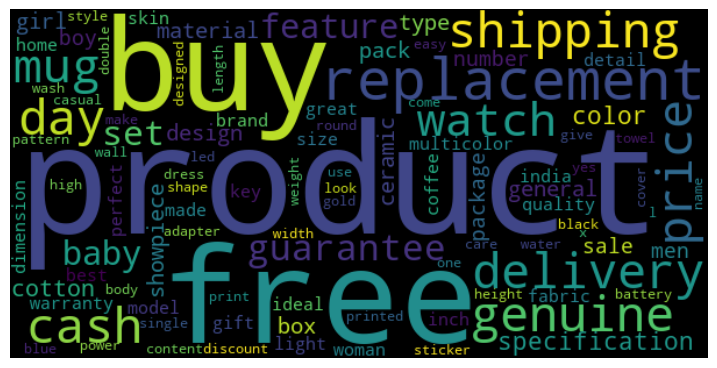

In [72]:
wourdcloud_viz(corpus)

Dans les tokens les plus courant on voit pas mal d'éléments qui ne décrivent pas vraiment les produits, et qu'il serait bon d'ajouter à une liste d'éléments à exclure.

In [73]:
# Visualisation de certains des mots les moins courants :

tmp.tail(20)

jute             1
challenge        1
circumference    1
foam             1
eva              1
knot             1
toddler          1
riva             1
drama            1
repeater         1
outfit           1
insulated        1
bob              1
boreal           1
curling          1
snag             1
operational      1
fingertip        1
allover          1
vibrancy         1
Name: count, dtype: int64

##### 3.3.2. Extra_words

In [74]:
tmp.head(20)

r                930
product          865
free             622
buy              582
replacement      568
delivery         567
cash             564
genuine          564
shipping         564
price            561
day              556
mug              524
watch            505
guarantee        471
set              442
baby             413
feature          404
specification    379
color            379
cotton           353
Name: count, dtype: int64

In [75]:
extra_words_lem = ['shipping', 'buy', 'online', 'delivery', 'cash', 'guarantee', 'genuine', 'free', 'ship', 'product', 
               'price', 'discount', 'feature', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key', 'replacement']

In [76]:
# je relance ma fonction de preprocessing en ajoutant des paramètres :

corpus = nltk_preprocess_text(raw_corpus,
                              rejoin = False,
                              lemm_or_stemm="lem",
                              min_len_word=0,
                              eng_words=eng_words_lem,
                              extra_words=extra_words_lem)
display_tokens_info(corpus)

nb tokens : 44752, nb tokens uniques : 3181
['elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'r', 'curtain', 'look', 'interior', 'curtain']


On a maintenant un total de 44752 tokens et 3181 tokens uniques.

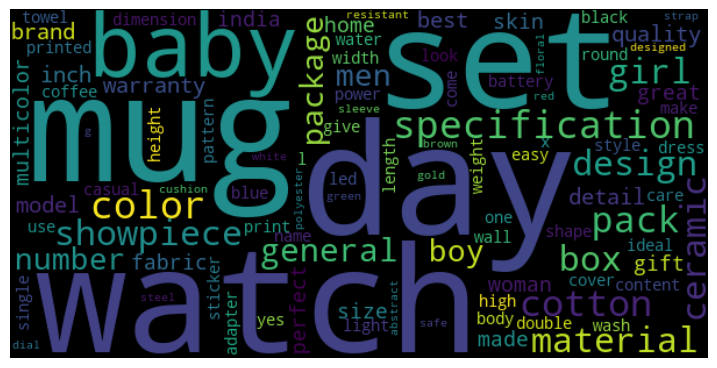

In [77]:
# Visualisation :
wourdcloud_viz(corpus)

##### 3.3.3. Analyse par catégories de produits

In [78]:
# On crée des dataframes pour chaque catégories de produits :

df_0 = df[df.product_category == "Home Furnishing"]
df_1 = df[df.product_category == "Baby Care"]
df_2 = df[df.product_category == "Watches"]
df_3 = df[df.product_category == "Home Decor & Festive Needs"]
df_4 = df[df.product_category == "Kitchen & Dining"]
df_5 = df[df.product_category == "Beauty and Personal Care"]
df_6 = df[df.product_category == "Computers"]

# un corpus par catégorie :

corpus_0 = " ".join(df_0.name_desc_product)
corpus_1 = " ".join(df_1.name_desc_product)
corpus_2 = " ".join(df_2.name_desc_product)
corpus_3 = " ".join(df_3.name_desc_product)
corpus_4 = " ".join(df_4.name_desc_product)
corpus_5 = " ".join(df_5.name_desc_product)
corpus_6 = " ".join(df_6.name_desc_product)

In [79]:
# Process des 7 corpus, le tout a pris 1m46s

corpus_0 = nltk_preprocess_text(corpus_0,
                          rejoin = False,
                          lemm_or_stemm="lem",
                          min_len_word=0,
                          eng_words=eng_words_lem,
                          extra_words=extra_words_lem)

corpus_1 = nltk_preprocess_text(corpus_1,
                          rejoin = False,
                              lemm_or_stemm="lem",
                              min_len_word=0,
                              eng_words=eng_words_lem,
                              extra_words=extra_words_lem)

corpus_2 = nltk_preprocess_text(corpus_2,
                          rejoin = False,
                              lemm_or_stemm="lem",
                              min_len_word=0,
                              eng_words=eng_words_lem,
                              extra_words=extra_words_lem)

corpus_3 = nltk_preprocess_text(corpus_3,
                          rejoin = False,
                              lemm_or_stemm="lem",
                              min_len_word=0,
                              eng_words=eng_words_lem,
                              extra_words=extra_words_lem)

corpus_4 = nltk_preprocess_text(corpus_4,
                          rejoin = False,
                              lemm_or_stemm="lem",
                              min_len_word=0,
                              eng_words=eng_words_lem,
                              extra_words=extra_words_lem)

corpus_5 = nltk_preprocess_text(corpus_5,
                          rejoin = False,
                              lemm_or_stemm="lem",
                              min_len_word=0,
                              eng_words=eng_words_lem,
                              extra_words=extra_words_lem)

corpus_6 = nltk_preprocess_text(corpus_6,
                          rejoin = False,
                              lemm_or_stemm="lem",
                              min_len_word=0,
                              eng_words=eng_words_lem,
                              extra_words=extra_words_lem)

Home Furnishing


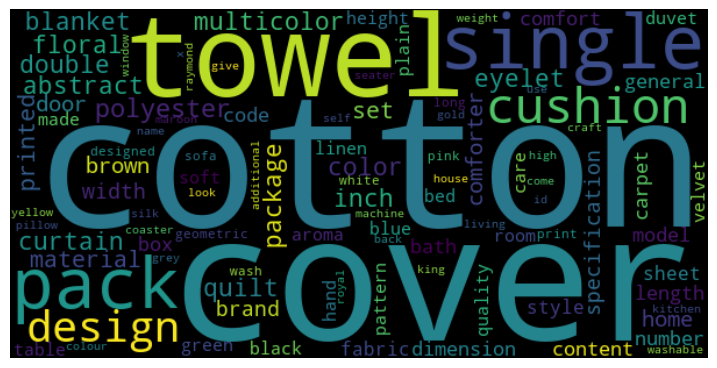

Baby Care


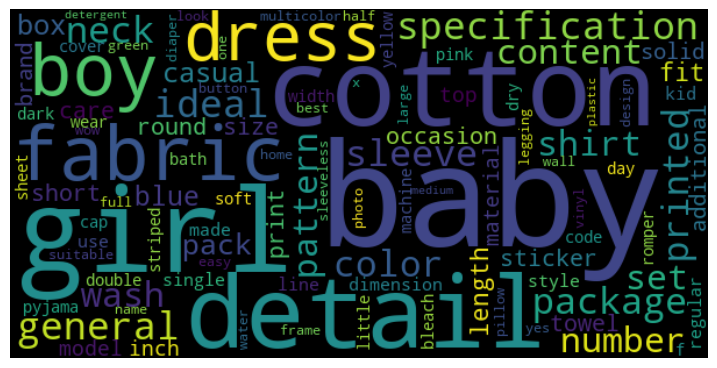

Watches


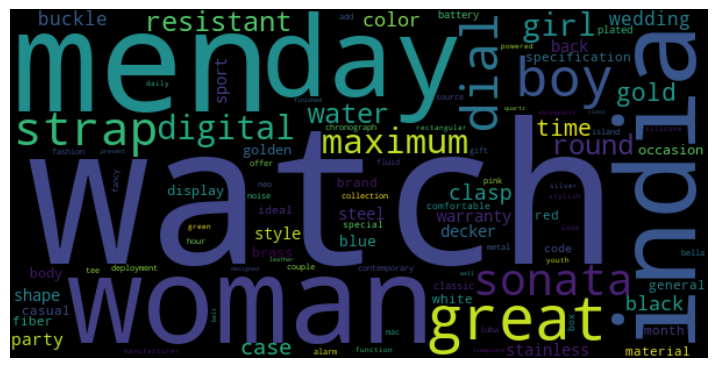

Home Decor & Festive Needs


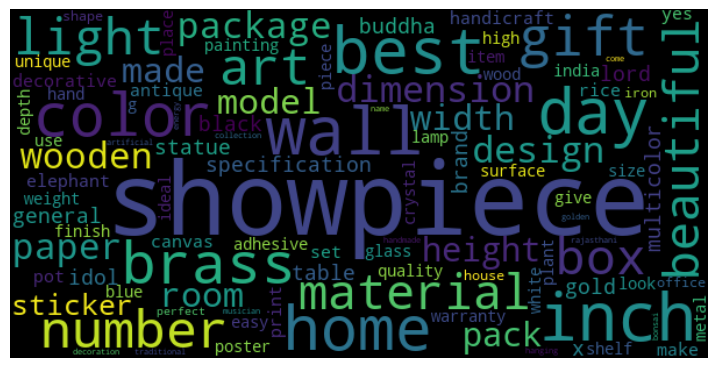

Kitchen & Dining


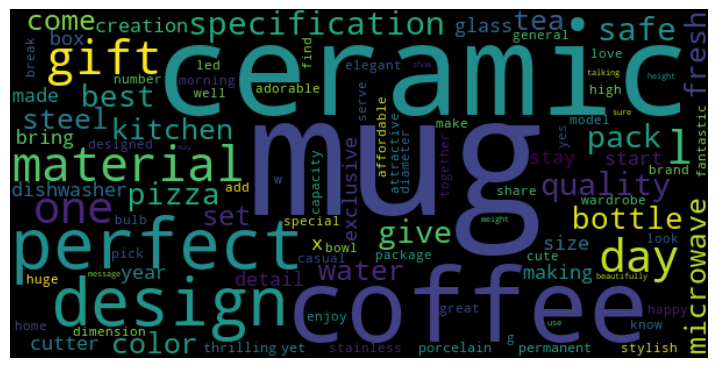

Beauty and Personal Care


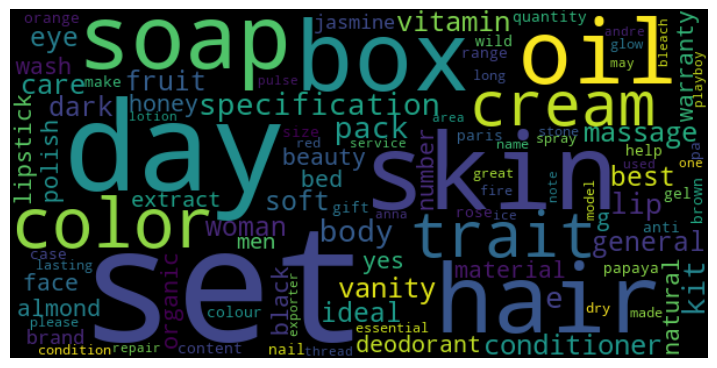

Computers


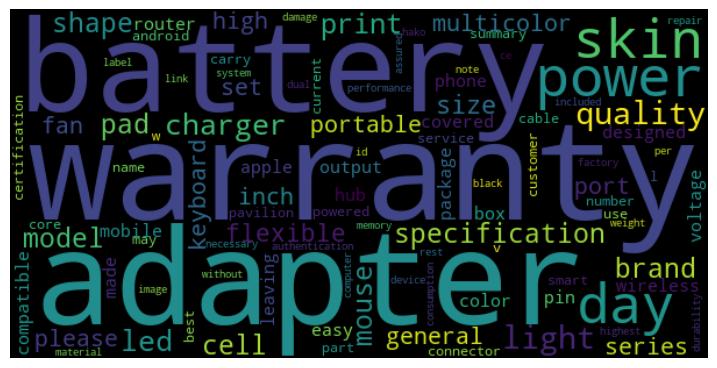

In [80]:
# Visualisation

liste_corpus = [corpus_0, corpus_1, corpus_2, corpus_3, corpus_4, corpus_5, corpus_6]

for cat, corp in zip(df.product_category.unique().tolist(), liste_corpus):
    print(cat)
    wourdcloud_viz(corp)

In [81]:
# On regarde les doublons, les mots présents à la fois dans tous les corpus :
n = 100
doublons = [i for i in pd.Series(corpus_0).value_counts().head(n).index
            if i in pd.Series(corpus_1).value_counts().head(n).index
            if i in pd.Series(corpus_2).value_counts().head(n).index
            if i in pd.Series(corpus_3).value_counts().head(n).index
            if i in pd.Series(corpus_4).value_counts().head(n).index
            if i in pd.Series(corpus_5).value_counts().head(n).index
            if i in pd.Series(corpus_6).value_counts().head(n).index]
doublons

['r', 'color', 'material', 'specification', 'brand', 'box', 'general']

##### 3.3.4. MAJ extra_words_lem

In [82]:
new_extra_words_lem = extra_words_lem + ['color', 'material', 'brand', 'specification', 'box', 'general', 'day']

nb tokens : 40531, nb tokens uniques : 3134
['elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'curtain', 'look', 'interior', 'curtain', 'made']


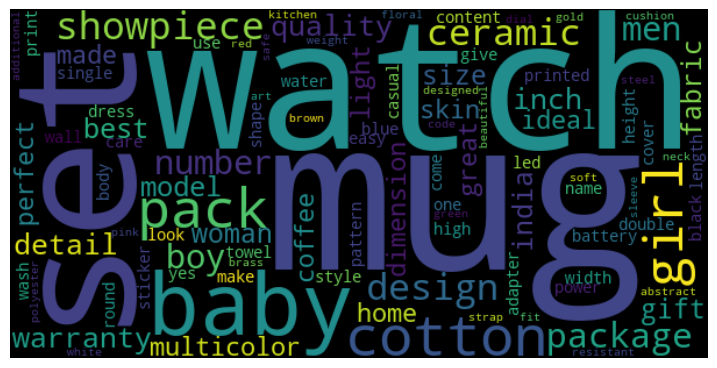

In [83]:
# Retour sur le corpus global :
corpus = nltk_preprocess_text(raw_corpus,
                              rejoin = False,
                              lemm_or_stemm="lem",
                              min_len_word=3,
                              eng_words=eng_words_lem,
                              extra_words=new_extra_words_lem)
display_tokens_info(corpus)
wourdcloud_viz(corpus)

##### 3.3.5. Final cleaning nltk lem

In [84]:
from pandarallel import pandarallel
# pandarallel 
pandarallel.initialize(progress_bar=True,
                       nb_workers = 6,
                       # verbose = 1
                       )

def final_clean_nltk_lem(text):
    import nltk
    from nltk import WordNetLemmatizer, PorterStemmer
    from nltk.tokenize import word_tokenize, wordpunct_tokenize
    from nltk.corpus import words
    from nltk.corpus import stopwords
    from nltk.tokenize import RegexpTokenizer
    # Stop words :
    stop_words = set(stopwords.words('english'))
    # Je crée une fonction de preprocessing qui utilise nltk :

    def nltk_preprocess_text(text,
                   rejoin = False,
                   lemm_or_stemm = "stem",
                   list_rare_words = None,
                   min_len_word = 0,
                   force_is_alpha = True,
                   eng_words = None,
                   extra_words = None):
        """Fonction qui renvoie des tokens lemmatizés sans stop_words, ponctuation, et éventuellement d'autres paramètres, en utilisant nltk

        positionnal arguments:
        ------------------------
        text : str: the document (aka a text in str format) to process
    
        opt args :
        ------------------------
        rejoin : bool : if True return a string else retun the list of tokens
        lemm_or_stemm : str : if lem do lemmentize else stemmentize
        list_rare_words : list : a list of rare words to exclude
        min_len_word : int : the minimum length of words to not exclude
        force_is_alpha : int : if 1, exclude all tokens with a numeric character
        eng_words : list : list of english words
        extra_words : list : list of most common words in both category

        return :
        ------------------------
        a string (if rejoin is True) or a list of tokens
        """

        # list unique words
        if not list_rare_words:
            list_rare_words = []
    
        # lower 
        text = text.lower().strip()

        # tokenize
        tokenizer = RegexpTokenizer(r"\w+")
        raw_tokens_list = tokenizer.tokenize(text)

        # stop_words
        cleaned_tokens_list = [w for w in raw_tokens_list if w not in stop_words]

        # no rare tokens
        non_rare_tokens = [w for w in cleaned_tokens_list if w not in list_rare_words]

        # no more len words
        more_than_N = [w for w in non_rare_tokens if len(w) >= min_len_word]

        # only alpha chars
        if force_is_alpha :
            alpha_tokens = [w for w in more_than_N if w.isalpha()]
        else :
            alpha_tokens = more_than_N
        
        # stemm or lemm
        if lemm_or_stemm == "lem" :
            trans = WordNetLemmatizer()
            trans_text = [trans.lemmatize(i) for i in alpha_tokens]
        else :
            trans = PorterStemmer()
            trans_text = [trans.stem(i) for i in alpha_tokens]   
        
        eng_words = [i.lower() for i in words.words()]
        # Transformation par Lemmatizer :
        lm = WordNetLemmatizer()
        eng_words_lem = [lm.lemmatize(i) for i in eng_words]
        
        if eng_words :
            engl_text = [i for i in trans_text if i in eng_words]
        else :
            engl_text = trans_text

        ###########################################################
        ###########################################################
    
        # drop extra_words tokens
        new_extra_words_lem = ['shipping', 'buy', 'online', 'delivery', 'cash', 'guarantee', 'genuine', 'free', 'ship', 'product', 
               'price', 'discount', 'feature', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key', 'replacement'] + ['color', 'material', 'brand', 'specification', 'box', 'general', 'day']
        if extra_words:
            final = [w for w in engl_text if w not in extra_words]
        else :
            final = engl_text
    
        ###########################################################
        ########################################################### 
    
        # return a list or a string
        if rejoin :
            return " ".join(final)
    
        return final
    

    eng_words = [i.lower() for i in words.words()]
    # Transformation par Lemmatizer :
    lm = WordNetLemmatizer()
    eng_words_lem = [lm.lemmatize(i) for i in eng_words]
    new_extra_words_lem = ['shipping', 'buy', 'online', 'delivery', 'cash', 'guarantee', 'genuine', 'free', 'ship', 'product', 
               'price', 'discount', 'feature', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key', 'replacement'] + ['color', 'material', 'brand', 'specification', 'box', 'general', 'day']
    new_doc = nltk_preprocess_text(text,
                             rejoin = True,
                             lemm_or_stemm="lem",
                             extra_words=new_extra_words_lem,
                             min_len_word=3,
                             eng_words=eng_words_lem
                             )
    return new_doc

df['nltk_lem_description'] = df.name_desc_product.parallel_apply(final_clean_nltk_lem)
df.head()

INFO: Pandarallel will run on 6 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


,uniq_id,product_name,product_category_tree,image,description,name_desc_product,product_category,_len_description,spacy_description_bow,spacy_description_we,nltk_stem_description,nltk_stem_description_less_strict,nltk_lem_description
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing,1420,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...,multicolor abstract eyelet door curtain multic...,multicolor abstract eyelet door curtain multic...,elegance polyester multicolor abstract eyelet ...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel. Specifications of ...,Baby Care,444,sathiyas cotton bath towel specification sathi...,sathiyas cotton bath towel specification sathi...,cotton bath towel cotton bath towel bath towel...,cotton bath towel cotton bath towel bath towel...,cotton bath towel cotton bath towel bath towel...
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set. Key Featu...,Baby Care,1258,eurospa cotton terry face towel set eurospa co...,eurospa cotton terry face towel set eurospa co...,cotton terri face towel set cotton terri face ...,cotton terri face towel set cotton terri face ...,cotton terry face towel set cotton terry face ...
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,Home Furnishing,858,santosh royal fashion cotton print king size d...,santosh royal fashion cotton print king size d...,royal fashion cotton print king size royal fas...,royal fashion cotton print king size royal fas...,royal fashion cotton printed king sized double...
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,Home Furnishing,1197,jaipur print cotton floral king size double be...,jaipur print cotton floral king size double be...,print cotton floral king size print cotton flo...,print cotton floral king size print cotton flo...,print cotton floral king sized double print co...


In [85]:
# Même chose sans eng_words :

from pandarallel import pandarallel
# pandarallel 
pandarallel.initialize(progress_bar=True,
                       nb_workers = 6,
                       # verbose = 1
                       )

def final_clean_nltk_lem(text):
    import nltk
    from nltk import WordNetLemmatizer, PorterStemmer
    from nltk.tokenize import word_tokenize, wordpunct_tokenize
    from nltk.corpus import words
    from nltk.corpus import stopwords
    from nltk.tokenize import RegexpTokenizer
    # Stop words :
    stop_words = set(stopwords.words('english'))
    # Je crée une fonction de preprocessing qui utilise nltk :

    def nltk_preprocess_text(text,
                   rejoin = False,
                   lemm_or_stemm = "stem",
                   list_rare_words = None,
                   min_len_word = 0,
                   force_is_alpha = True,
                   eng_words = None,
                   extra_words = None):
        """Fonction qui renvoie des tokens lemmatizés sans stop_words, ponctuation, et éventuellement d'autres paramètres, en utilisant nltk

        positionnal arguments:
        ------------------------
        text : str: the document (aka a text in str format) to process
    
        opt args :
        ------------------------
        rejoin : bool : if True return a string else retun the list of tokens
        lemm_or_stemm : str : if lem do lemmentize else stemmentize
        list_rare_words : list : a list of rare words to exclude
        min_len_word : int : the minimum length of words to not exclude
        force_is_alpha : int : if 1, exclude all tokens with a numeric character
        eng_words : list : list of english words
        extra_words : list : list of most common words in both category

        return :
        ------------------------
        a string (if rejoin is True) or a list of tokens
        """

        # list unique words
        if not list_rare_words:
            list_rare_words = []
    
        # lower 
        text = text.lower().strip()

        # tokenize
        tokenizer = RegexpTokenizer(r"\w+")
        raw_tokens_list = tokenizer.tokenize(text)

        # stop_words
        cleaned_tokens_list = [w for w in raw_tokens_list if w not in stop_words]

        # no rare tokens
        non_rare_tokens = [w for w in cleaned_tokens_list if w not in list_rare_words]

        # no more len words
        more_than_N = [w for w in non_rare_tokens if len(w) >= min_len_word]

        # only alpha chars
        if force_is_alpha :
            alpha_tokens = [w for w in more_than_N if w.isalpha()]
        else :
            alpha_tokens = more_than_N
        
        # stemm or lemm
        if lemm_or_stemm == "lem" :
            trans = WordNetLemmatizer()
            trans_text = [trans.lemmatize(i) for i in alpha_tokens]
        else :
            trans = PorterStemmer()
            trans_text = [trans.stem(i) for i in alpha_tokens]   
        
        eng_words = [i.lower() for i in words.words()]
        # Transformation par Lemmatizer :
        lm = WordNetLemmatizer()
        eng_words_lem = [lm.lemmatize(i) for i in eng_words]
        
        if eng_words :
            engl_text = [i for i in trans_text if i in eng_words]
        else :
            engl_text = trans_text

        ###########################################################
        ###########################################################
    
        # drop extra_words tokens
        extra_words_lem = ['shipping', 'buy', 'online', 'delivery', 'cash', 'guarantee', 'genuine', 'free', 'ship', 'product', 
               'price', 'discount', 'feature', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key']
        new_extra_words_lem = ['shipping', 'buy', 'online', 'delivery', 'cash', 'guarantee', 'genuine', 'free', 'ship', 'product', 
               'price', 'discount', 'feature', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key', 'replacement'] + ['color', 'material', 'brand', 'specification', 'box', 'general', 'day']
        if extra_words:
            final = [w for w in engl_text if w not in extra_words]
        else :
            final = engl_text
    
        ###########################################################
        ########################################################### 
    
        # return a list or a string
        if rejoin :
            return " ".join(final)
    
        return final
    

    eng_words = [i.lower() for i in words.words()]
    # Transformation par Lemmatizer :
    lm = WordNetLemmatizer()
    eng_words_lem = [lm.lemmatize(i) for i in eng_words]
    extra_words_lem = ['shipping', 'buy', 'online', 'delivery', 'cash', 'guarantee', 'genuine', 'free', 'ship', 'product', 
               'price', 'discount', 'feature', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key']
    new_extra_words_lem = ['shipping', 'buy', 'online', 'delivery', 'cash', 'guarantee', 'genuine', 'free', 'ship', 'product', 
               'price', 'discount', 'feature', 'type', 'rs', 'sale', 'flipkartcom', 'flipkart', 'deliverybuy', 'guaranteebuy',
               'cm', 'key', 'replacement'] + ['color', 'material', 'brand', 'specification', 'box', 'general', 'day']
    new_doc = nltk_preprocess_text(text,
                             rejoin = True,
                             lemm_or_stemm="lem",
                             extra_words=extra_words_lem,
                             min_len_word=3,
                             eng_words=None
                             )
    return new_doc

df['nltk_lem_description_less_strict'] = df.name_desc_product.parallel_apply(final_clean_nltk_lem)
df.head()

INFO: Pandarallel will run on 6 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


,uniq_id,product_name,product_category_tree,image,description,name_desc_product,product_category,_len_description,spacy_description_bow,spacy_description_we,nltk_stem_description,nltk_stem_description_less_strict,nltk_lem_description,nltk_lem_description_less_strict
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing,1420,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...,multicolor abstract eyelet door curtain multic...,multicolor abstract eyelet door curtain multic...,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel. Specifications of ...,Baby Care,444,sathiyas cotton bath towel specification sathi...,sathiyas cotton bath towel specification sathi...,cotton bath towel cotton bath towel bath towel...,cotton bath towel cotton bath towel bath towel...,cotton bath towel cotton bath towel bath towel...,cotton bath towel specification cotton bath to...
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set. Key Featu...,Baby Care,1258,eurospa cotton terry face towel set eurospa co...,eurospa cotton terry face towel set eurospa co...,cotton terri face towel set cotton terri face ...,cotton terri face towel set cotton terri face ...,cotton terry face towel set cotton terry face ...,cotton terry face towel set cotton terry face ...
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,Home Furnishing,858,santosh royal fashion cotton print king size d...,santosh royal fashion cotton print king size d...,royal fashion cotton print king size royal fas...,royal fashion cotton print king size royal fas...,royal fashion cotton printed king sized double...,royal fashion cotton printed king sized double...
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,Home Furnishing,1197,jaipur print cotton floral king size double be...,jaipur print cotton floral king size double be...,print cotton floral king size print cotton flo...,print cotton floral king size print cotton flo...,print cotton floral king sized double print co...,print cotton floral king sized double print co...


In [86]:
df.to_csv(("F:/Utilisateur/Documents/Openclassrooms/Data Scientist/Formation/"
             "Projet 6 - Classifiez automatiquement des biens de consommation/"
             "Données projet/jeu_donnees_modelisation.csv"), index = False)

<Axes: >

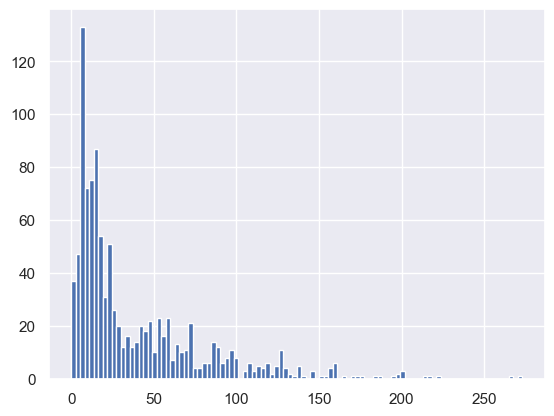

In [87]:
# On regarde la distribution du nombre de tokens sur la description "modifiée" :
df.nltk_lem_description.apply(lambda txt : len(txt.split())).hist(bins = 100)

In [88]:
df.isna().sum()

uniq_id                              0
product_name                         0
product_category_tree                0
image                                0
description                          0
name_desc_product                    0
product_category                     0
_len_description                     0
spacy_description_bow                0
spacy_description_we                 0
nltk_stem_description                0
nltk_stem_description_less_strict    0
nltk_lem_description                 0
nltk_lem_description_less_strict     0
dtype: int64

Exemple de descriptions "brutes" et des différents traitement appliqués :

In [28]:
from IPython.display import display, Markdown

description = df.loc[df.index[36], "name_desc_product"]
print("Description brute :\n")
display(Markdown(description))
print("\nNombre de caractères :", len(description))

Description brute :



Myesquire Ceramic Burner Pot Lemongrass Liquid Air Freshener. Myesquire Ceramic Burner Pot Lemongrass Liquid Air Freshener (30 ml)
                         Price: Rs. 245
				
			Illuminate Every Corner Of Your Living Room In Style With This Home Fragrance Electric Burner Combo With Fragrance That Is Brought To You By Myesquire. This Is A Very Unique, Useful And Value for Money Product For Home Decoration And Fragrance. This Unique Combo Contains Aroma Burner With All Accessories and is ready to use . Put A Small Amount 1-2 Tea Spoon Of Aroma Oil On The Bowl Surface And Light The Tea Light and After Few Minutes As The Oil Heats Up, The Fragrance Will Spread In The Room. And You Will Be All Set To Enjoy The Captivating Aroma. Keep It Away From Children As Surface Becomes Hot.
Illuminate Every Corner Of Your Living Room In Style With This Home Fragrance Electric Burner Combo With Fragrance That Is Brought To You By Myesquire. This Is A Very Unique, Useful And Value for Money Product For Home Decoration And Fragrance. This Unique Combo Contains Aroma Burner With All Accessories and is ready to use . Put A Small Amount 1-2 Tea Spoon Of Aroma Oil On The Bowl Surface And Light The Tea Light and After Few Minutes As The Oil Heats Up, The Fragrance Will Spread In The Room. And You Will Be All Set To Enjoy The Captivating Aroma. Keep It Away From Children As Surface Becomes Hot.


Nombre de caractères : 1396


In [23]:
# description preprocessing spacy bow :
description = df.loc[df.index[36], "spacy_description_bow"]
print("Description preprocessing spacy bow :\n")
display(Markdown(description))
print("\nNombre de caractères :", len(description))

Description preprocessing spacy bow :



myesquire ceramic burner pot lemongrass liquid air freshener myesquire ceramic burner pot lemongrass liquid air freshener illuminate corner living room style home fragrance electric burner combo fragrance bring myesquire unique useful value money home decoration fragrance unique combo contain aroma burner accessory ready use small tea spoon aroma oil bowl surface light tea light minute oil heat fragrance spread room set enjoy captivate aroma away child surface hot illuminate corner living room style home fragrance electric burner combo fragrance bring myesquire unique useful value money home decoration fragrance unique combo contain aroma burner accessory ready use small tea spoon aroma oil bowl surface light tea light minute oil heat fragrance spread room set enjoy captivate aroma away child surface hot


Nombre de caractères : 815


In [24]:
# description preprocessing spacy we:
description = df.loc[df.index[36], "spacy_description_we"]
print("Description preprocessing spacy we :\n")
display(Markdown(description))
print("\nNombre de caractères :", len(description))

Description preprocessing spacy we :



myesquire ceramic burner pot lemongrass liquid air freshener myesquire ceramic burner pot lemongrass liquid air freshener illuminate every corner your living room style with this home fragrance electric burner combo with fragrance that bring you myesquire this very unique useful and value for money for home decoration and fragrance this unique combo contain aroma burner with all accessory and ready use put small amount tea spoon aroma oil the bowl surface and light the tea light and after few minute the oil heat the fragrance will spread the room and you will all set enjoy the captivate aroma keep away from child surface become hot illuminate every corner your living room style with this home fragrance electric burner combo with fragrance that bring you myesquire this very unique useful and value for money for home decoration and fragrance this unique combo contain aroma burner with all accessory and ready use put small amount tea spoon aroma oil the bowl surface and light the tea light and after few minute the oil heat the fragrance will spread the room and you will all set enjoy the captivate aroma keep away from child surface become hot


Nombre de caractères : 1157


In [25]:
# description preprocessing nltk stem:
description = df.loc[df.index[36], "nltk_stem_description_less_strict"]
print("Description preprocessing nltk stem :\n")
display(Markdown(description))
print("\nNombre de caractères :", len(description))

Description preprocessing nltk stem :



burner pot liquid air freshen burner pot liquid air freshen corner live room style home burner brought use money home contain aroma burner use put small amount tea spoon aroma oil bowl light tea light oil heat spread room set enjoy aroma keep away hot corner live room style home burner brought use money home contain aroma burner use put small amount tea spoon aroma oil bowl light tea light oil heat spread room set enjoy aroma keep away hot


Nombre de caractères : 443


In [26]:
# description preprocessing nltk lem:
description = df.loc[df.index[36], "nltk_lem_description_less_strict"]
print("Description preprocessing nltk lem :\n")
display(Markdown(description))
print("\nNombre de caractères :", len(description))

Description preprocessing nltk lem :



ceramic burner pot liquid air freshener ceramic burner pot liquid air freshener illuminate every corner living room style home fragrance electric burner fragrance brought unique useful value money home decoration fragrance unique aroma burner accessory ready use put small amount tea spoon aroma oil bowl surface light tea light minute oil heat fragrance spread room set enjoy captivating aroma keep away child surface becomes hot illuminate every corner living room style home fragrance electric burner fragrance brought unique useful value money home decoration fragrance unique aroma burner accessory ready use put small amount tea spoon aroma oil bowl surface light tea light minute oil heat fragrance spread room set enjoy captivating aroma keep away child surface becomes hot


Nombre de caractères : 781


## 4. Modélisation à partir des descriptions prétraitées

In [2]:
df = pd.read_csv(("F:/Utilisateur/Documents/Openclassrooms/Data Scientist/Formation/"
             "Projet 6 - Classifiez automatiquement des biens de consommation/"
             "Données projet/jeu_donnees_modelisation.csv"))
df.head()

,uniq_id,product_name,product_category_tree,image,description,name_desc_product,product_category,_len_description,spacy_description_bow,spacy_description_we,nltk_stem_description,nltk_stem_description_less_strict,nltk_lem_description,nltk_lem_description_less_strict
0,55b85ea15a1536d46b7190ad6fff8ce7,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing,1420,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...,multicolor abstract eyelet door curtain multic...,multicolor abstract eyelet door curtain multic...,elegance polyester multicolor abstract eyelet ...,elegance polyester multicolor abstract eyelet ...
1,7b72c92c2f6c40268628ec5f14c6d590,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel. Specifications of ...,Baby Care,444,sathiyas cotton bath towel specification sathi...,sathiyas cotton bath towel specification sathi...,cotton bath towel cotton bath towel bath towel...,cotton bath towel cotton bath towel bath towel...,cotton bath towel cotton bath towel bath towel...,cotton bath towel specification cotton bath to...
2,64d5d4a258243731dc7bbb1eef49ad74,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set. Key Featu...,Baby Care,1258,eurospa cotton terry face towel set eurospa co...,eurospa cotton terry face towel set eurospa co...,cotton terri face towel set cotton terri face ...,cotton terri face towel set cotton terri face ...,cotton terry face towel set cotton terry face ...,cotton terry face towel set cotton terry face ...
3,d4684dcdc759dd9cdf41504698d737d8,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,SANTOSH ROYAL FASHION Cotton Printed King size...,Home Furnishing,858,santosh royal fashion cotton print king size d...,santosh royal fashion cotton print king size d...,royal fashion cotton print king size royal fas...,royal fashion cotton print king size royal fas...,royal fashion cotton printed king sized double...,royal fashion cotton printed king sized double...
4,6325b6870c54cd47be6ebfbffa620ec7,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Jaipur Print Cotton Floral King sized Double B...,Home Furnishing,1197,jaipur print cotton floral king size double be...,jaipur print cotton floral king size double be...,print cotton floral king size print cotton flo...,print cotton floral king size print cotton flo...,print cotton floral king sized double print co...,print cotton floral king sized double print co...


In [90]:
df.isna().sum()

uniq_id                               0
product_name                          0
product_category_tree                 0
image                                 0
description                           0
name_desc_product                     0
product_category                      0
_len_description                      0
spacy_description_bow                 0
spacy_description_we                  0
nltk_stem_description                20
nltk_stem_description_less_strict     0
nltk_lem_description                 20
nltk_lem_description_less_strict      0
dtype: int64

On voit que certains preprocessing nltk ont conduit à des valeurs manquantes dans les descriptions, le traitement était sans doute trop strict. Nous conserverons les versions complètes pour la modélisation à venir.

In [91]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, adjusted_rand_score
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

On crée des fonctions qui permettront de réduire la dimension de nos données (TSNE, PCA), puis d'entrainer un modèle de clustering, de type KMeans à 7 clusters, de visualiser les résultats dans un graphique à 2 dimensions et enfin de calculer l'ARI afin d'analyser la similarité entre les clusters et les catégories réelles.

In [92]:
import time

# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_tsne_fct(df, y_cat_num, features) :

    time1 = time.time()
    num_labels=len(l_cat)
    tsne = TSNE(n_components=2, perplexity=30, n_iter=2000, 
                                 init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(adjusted_rand_score(y, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI_TSNE : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_


# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI) :
    fig = plt.figure(figsize=(8,10))
    
    ax = fig.add_subplot(211)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=y, cmap='Set1')
    ax.grid(False)
    ax.legend(handles=scatter.legend_elements()[0], labels=l_cat, bbox_to_anchor=(1.05, 1), loc='upper left', title="Categories")
    plt.title('Représentation des descriptions de produits par catégories réelles')
    
    ax = fig.add_subplot(212)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels, cmap='Set1')
    ax.grid(False)
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), bbox_to_anchor=(1.05, 1), loc='upper left', title="Clusters")
    plt.title('Représentation des descriptions de produits par clusters')
    
    plt.show()
    print("ARI_TSNE : ", ARI)


# Calcul PCA, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_pca_fct(df, y_cat_num, features) :
    # établissement/transfo des catégories
    time1 = time.time()
    num_labels=len(l_cat)
    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(features.toarray())
    
    # Détermination des clusters à partir des données après Tsne 
    cls = KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_pca)
    ARI = np.round(adjusted_rand_score(y, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI_PCA : ", ARI, "time : ", time2)
    
    return ARI, X_pca, cls.labels_


# visualisation de la PCA selon les vraies catégories et selon les clusters
def PCA_visu_fct(X_pca, y_cat_num, labels, ARI) :
    fig = plt.figure(figsize=(8,10))
    
    ax = fig.add_subplot(211)
    scatter = ax.scatter(X_pca[:,0],X_pca[:,1], c=y, cmap='Set1')
    ax.grid(False)
    ax.legend(handles=scatter.legend_elements()[0], labels=l_cat, bbox_to_anchor=(1.05, 1), loc='upper left', title="Categories")
    plt.title('Représentation des descriptions de produits par catégories réelles')
    
    ax = fig.add_subplot(212)
    scatter = ax.scatter(X_pca[:,0],X_pca[:,1], c=labels, cmap='Set1')
    ax.grid(False)
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), bbox_to_anchor=(1.05, 1), loc='upper left', title="Clusters")
    plt.title('Représentation des descriptions de produits par clusters')
    
    plt.show()
    print("ARI_PCA : ", ARI)

In [93]:
def eff_cluster(DF, label_name):
  """Décompte et visualisation des effectifs par cluster"""
  # Affichage écrit des effectifs/cluster :
  display(DF.groupby(label_name).size())

  plt.figure()
  ax = sns.countplot(data=DF, y=label_name, palette = "magma")

  # Ajout des pourcentages de répartition à l'intérieur des barres
  total = len(DF[label_name])
  for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_width() / total)
    x = p.get_x() + p.get_width() / 2
    y = p.get_y() + p.get_height() / 2
    ax.annotate(percentage, (x, y), ha='center', va='center', color='white')
  plt.title("Effectif des clusters", fontsize=18)
  plt.tight_layout()
  plt.show()

L'idée serait ici de tester plusieurs méthodes de vectorisation du texte et de comparer leurs pertinence et résultat via un algorithme de clustering. On comparera les labels prédits par ces modèles avec les catégories de produit réelles.

**Principe de la vectorisation :** il s'agit de transformer une collection de documents, un corpus, en variables numériques qui puissent être interprétées par des algorithmes de machine learning en vue d'une modélisation.

### 4.1. Approche Bag of Words

L'approche bag of words consiste à transformer le texte en vecteurs représentants les occurences de chaque mot au sein des documents. On peut soit compter le nombre de fois où un mot apparaît dans chaque document (CountVectorizer), soit analyser sa fréquence d'apparition en lien avec le corpus (TF-IDF).

C'est une approche efficace mais qui ne tient pas compte de la position des mots au sein des textes et donc du contexte et du sens.

#### 4.1.1 Preprocessing spaCy

In [94]:
# Création d'un dataframe spécifique :
df_spacy_bow = df[["spacy_description_bow", 'product_category']]

In [95]:
# Etablissement/transformation des catégories:
l_cat = list(set(df_spacy_bow.product_category))

# On utilise un LabelEncoder pour transformer notre target, les catégorie de produits, en variables numériques :
encoder = LabelEncoder()
y = encoder.fit_transform(df_spacy_bow.product_category)

##### 4.1.1.1 CountVectorizer

In [96]:
# On instancie un modèle de vectorisation :
cv = CountVectorizer()

# On transorme nos descriptions préprocessées via spaCy :
X = cv.fit_transform(df_spacy_bow.spacy_description_bow)

In [97]:
print("CountVectorizer - TNSE- spaCy: ")
print("-----------------")
ARI_TSNE, X_tsne, labels = ARI_tsne_fct(df_spacy_bow, y, X)

CountVectorizer - TNSE- spaCy: 
-----------------
ARI_TSNE :  0.4824 time :  16.0


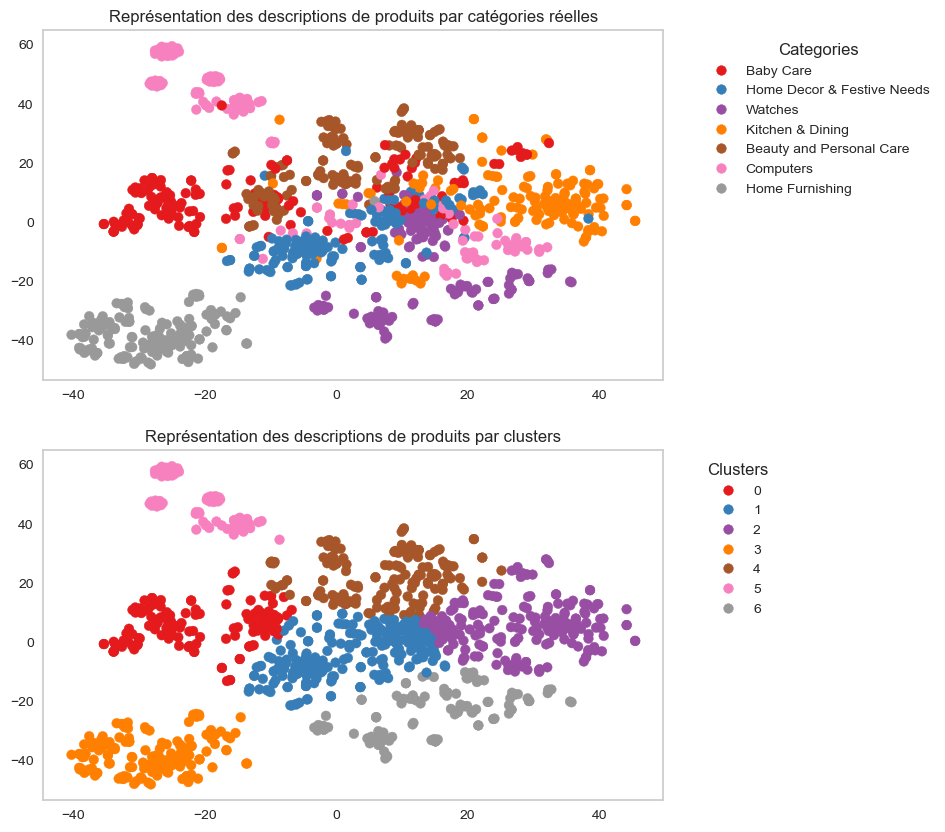

ARI_TSNE :  0.4824


In [98]:
TSNE_visu_fct(X_tsne, y, labels, ARI_TSNE)

In [99]:
df_spacy_bow["CV_Kmeans_TNSE_labels"] = labels

CountVectorizer - TNSE- spaCy: 
-----------------


CV_Kmeans_TNSE_labels
0    136
1    224
2    188
3    149
4    163
5     76
6    114
dtype: int64

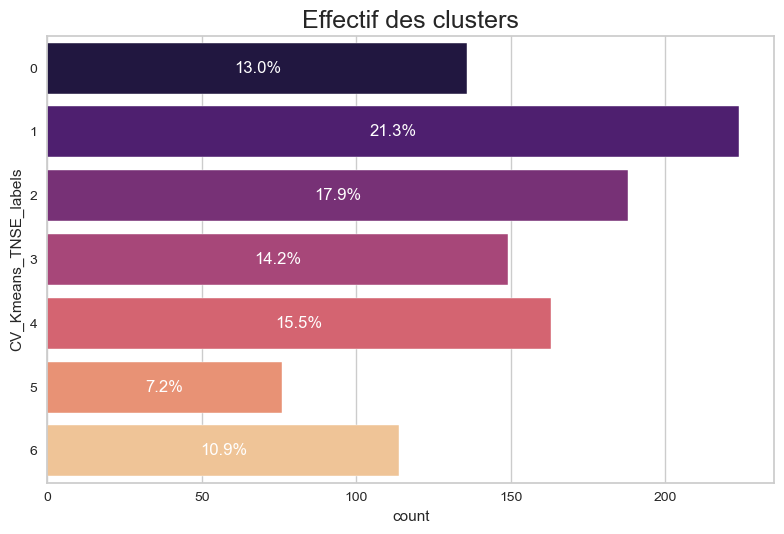

In [100]:
print("CountVectorizer - TNSE- spaCy: ")
print("-----------------")
eff_cluster(df_spacy_bow, "CV_Kmeans_TNSE_labels")

In [101]:
print("CountVectorizer - PCA - spaCy: ")
print("-----------------")
ARI_PCA, X_pca, labels = ARI_pca_fct(df_spacy_bow, y, X)

CountVectorizer - PCA - spaCy: 
-----------------
ARI_PCA :  0.0292 time :  10.0


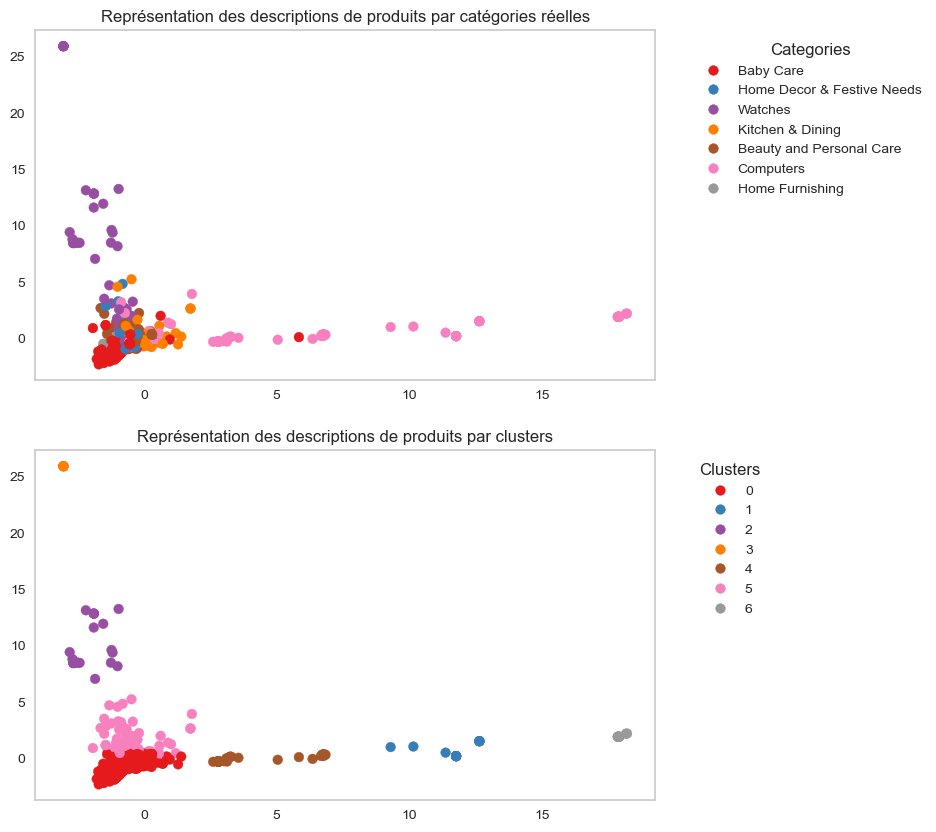

ARI_PCA :  0.0292


In [102]:
PCA_visu_fct(X_pca, y, labels, ARI_PCA)

La réduction de dimension par PCA donne de nettement moins bons résultats. On se concentrera sur la T-SNE par la suite.

##### 4.1.1.3. TF-IDF

In [103]:
# On instancie un modèle de vectorisation :
tf_idf = TfidfVectorizer()
X = tf_idf.fit_transform(df_spacy_bow.spacy_description_bow)

In [104]:
print("TFIDF - TNSE- spaCy: ")
print("-----------------")
ARI_TSNE, X_tsne, labels = ARI_tsne_fct(df_spacy_bow, y, X)

TFIDF - TNSE- spaCy: 
-----------------
ARI_TSNE :  0.5143 time :  15.0


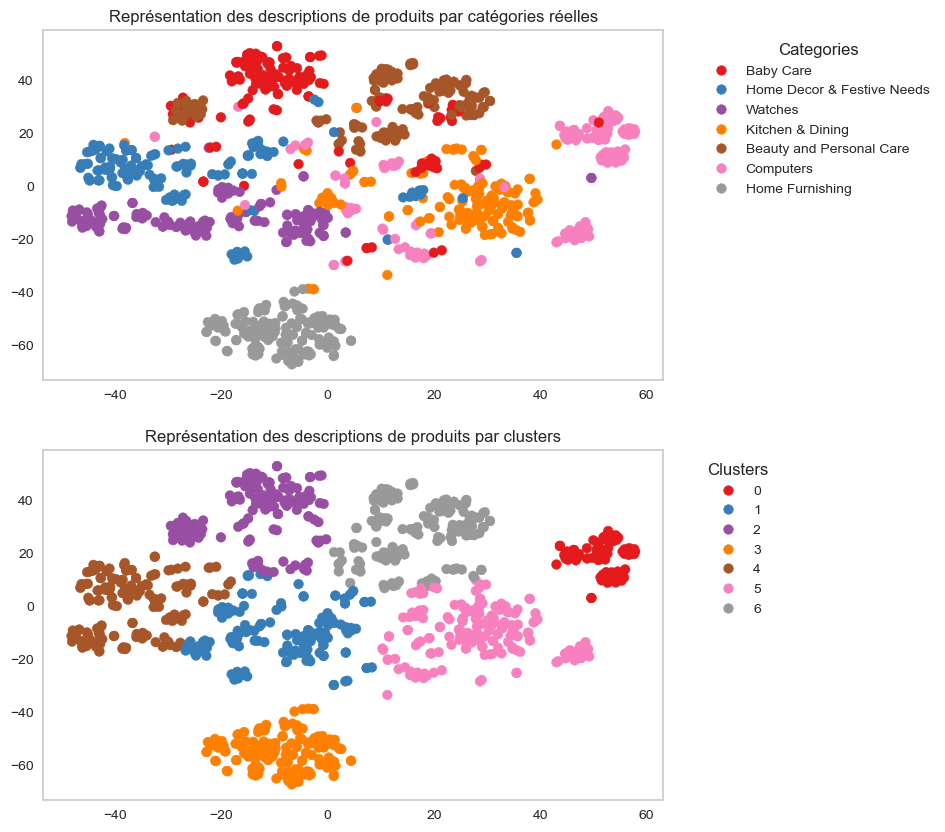

ARI_TSNE :  0.5143


In [105]:
TSNE_visu_fct(X_tsne, y, labels, ARI_TSNE)

In [106]:
df_spacy_bow["TFIDF_Kmeans_TNSE_labels"] = labels

TFIDF - TNSE- spaCy: 
-----------------


TFIDF_Kmeans_TNSE_labels
0     78
1    160
2    152
3    153
4    159
5    181
6    167
dtype: int64

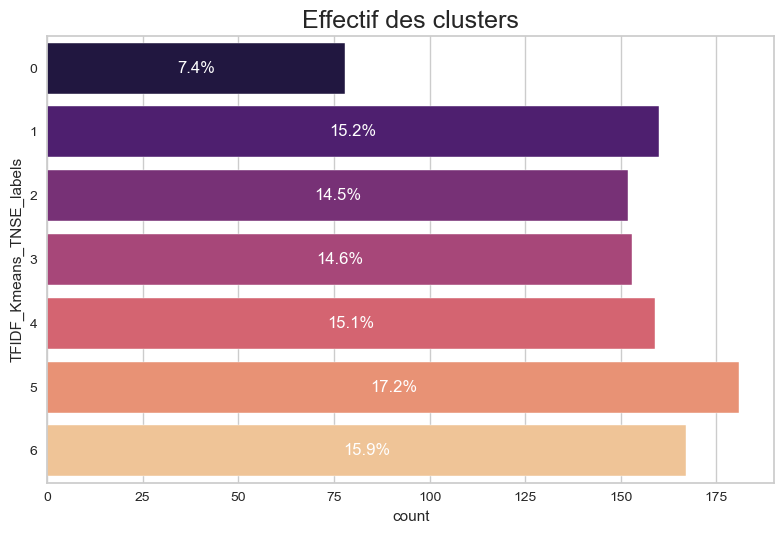

In [107]:
print("TFIDF - TNSE- spaCy: ")
print("-----------------")
eff_cluster(df_spacy_bow, "TFIDF_Kmeans_TNSE_labels")

#### 4.1.1 Preprocessing NLTK-Stem

In [108]:
# Création d'un dataframe spécifique :
df_nltk_stem = df[["nltk_stem_description_less_strict", 'product_category']]

In [109]:
# Etablissement/transformation des catégories:
l_cat = list(set(df_nltk_stem.product_category))

# On utilise un LabelEncoder pour transformer notre target, les catégorie de produits, en variables numériques :
encoder = LabelEncoder()
y = encoder.fit_transform(df_nltk_stem.product_category)

##### 4.1.1.1 CountVectorizer

In [110]:
# On instancie un modèle de vectorisation :
cv = CountVectorizer()

# On transorme nos descriptions préprocessées via spaCy :
X = cv.fit_transform(df_nltk_stem.nltk_stem_description_less_strict)

In [111]:
print("CountVectorizer - TNSE- NLTK_Stem: ")
print("-----------------")
ARI_TSNE, X_tsne, labels = ARI_tsne_fct(df_nltk_stem, y, X)

CountVectorizer - TNSE- NLTK_Stem: 
-----------------
ARI_TSNE :  0.3886 time :  16.0


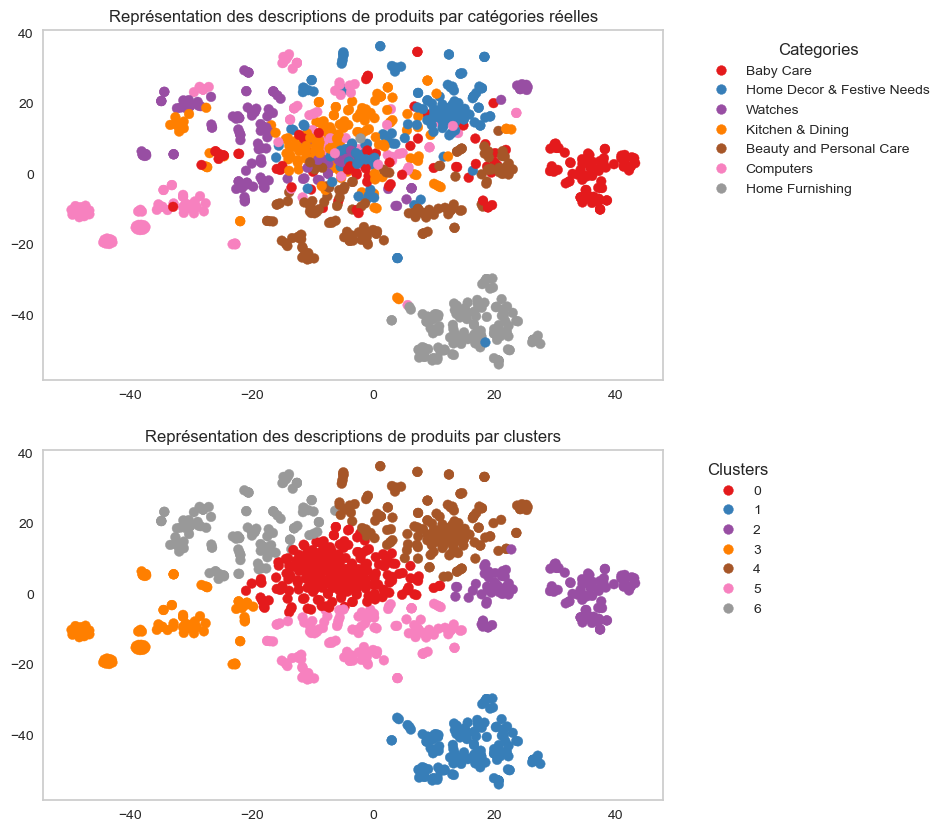

ARI_TSNE :  0.3886


In [112]:
TSNE_visu_fct(X_tsne, y, labels, ARI_TSNE)

In [113]:
df_nltk_stem["CV_Kmeans_TNSE_labels"] = labels

CountVectorizer - TNSE- NLTK_Stem: 
-----------------


CV_Kmeans_TNSE_labels
0    230
1    153
2    127
3    111
4    169
5    137
6    123
dtype: int64

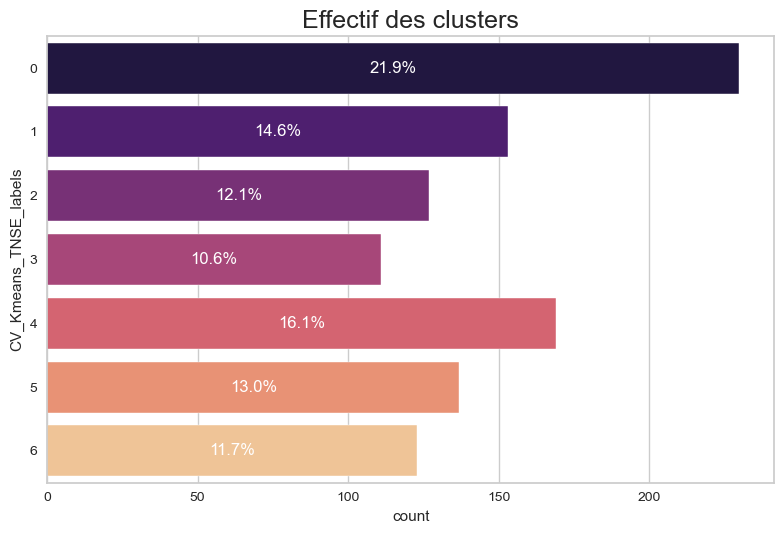

In [114]:
print("CountVectorizer - TNSE- NLTK_Stem: ")
print("-----------------")
eff_cluster(df_nltk_stem, "CV_Kmeans_TNSE_labels")

In [115]:
print("CountVectorizer - PCA - NLTK_Stem: ")
print("-----------------")
ARI_PCA, X_pca, labels = ARI_pca_fct(df_nltk_stem, y, X)

CountVectorizer - PCA - NLTK_Stem: 
-----------------
ARI_PCA :  0.0574 time :  10.0


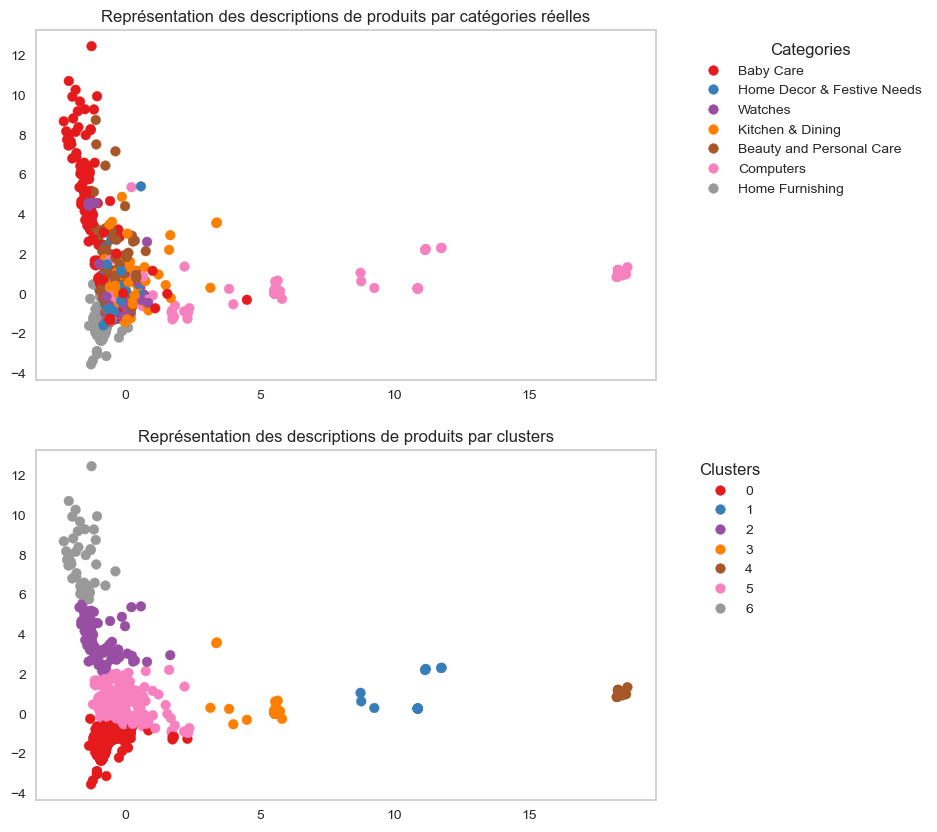

ARI_PCA :  0.0574


In [116]:
PCA_visu_fct(X_pca, y, labels, ARI_PCA)

La réduction de dimension par PCA donne de nettement moins bons résultats. On se concentrera sur la T-SNE par la suite.

##### 4.1.1.3. TF-IDF

In [117]:
# On instancie un modèle de vectorisation :
tf_idf = TfidfVectorizer()
X = tf_idf.fit_transform(df_nltk_stem.nltk_stem_description_less_strict)

In [118]:
print("TFIDF - TNSE- NLTK_Stem: ")
print("-----------------")
ARI_TSNE, X_tsne, labels = ARI_tsne_fct(df_nltk_stem, y, X)

TFIDF - TNSE- NLTK_Stem: 
-----------------
ARI_TSNE :  0.4207 time :  15.0


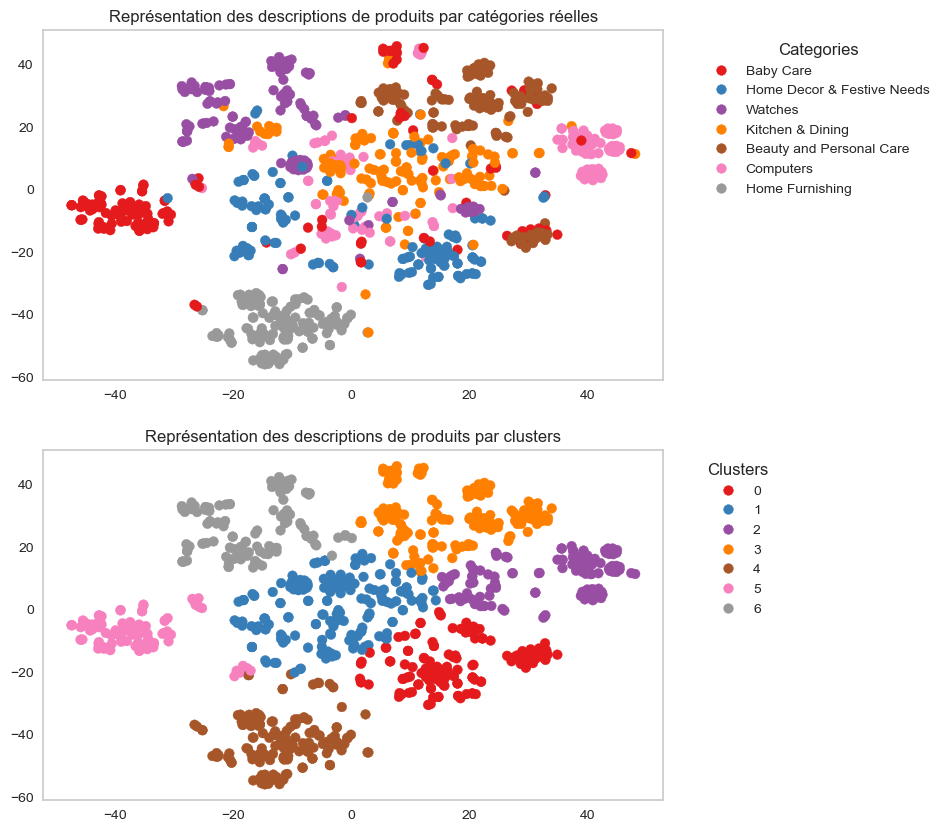

ARI_TSNE :  0.4207


In [119]:
TSNE_visu_fct(X_tsne, y, labels, ARI_TSNE)

In [120]:
df_nltk_stem["TFIDF_Kmeans_TNSE_labels"] = labels

TFIDF - TNSE- NLTK_Stem: 
-----------------


TFIDF_Kmeans_TNSE_labels
0    145
1    202
2    133
3    172
4    165
5    101
6    132
dtype: int64

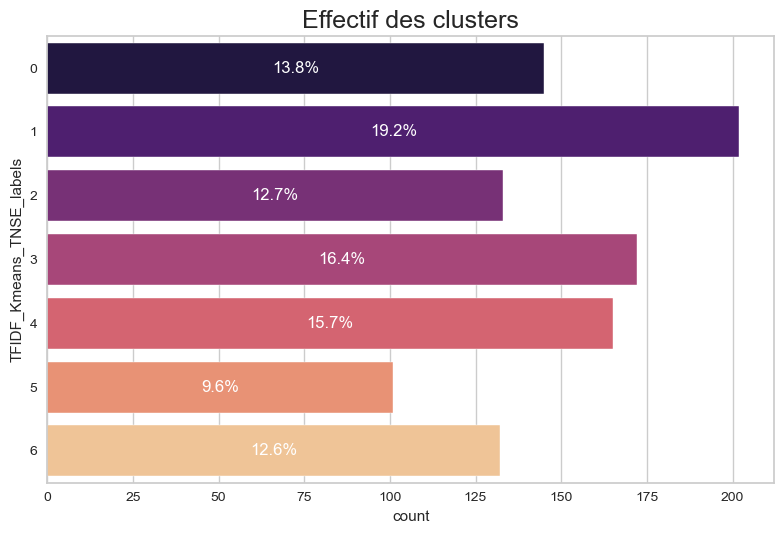

In [121]:
print("TFIDF - TNSE- NLTK_Stem: ")
print("-----------------")
eff_cluster(df_nltk_stem, "TFIDF_Kmeans_TNSE_labels")

#### 4.1.1 Preprocessing NLTK-Lem

In [122]:
# Création d'un dataframe spécifique :
df_nltk_lem = df[["nltk_lem_description_less_strict", 'product_category']]

In [123]:
# Etablissement/transformation des catégories:
l_cat = list(set(df_nltk_lem.product_category))

# On utilise un LabelEncoder pour transformer notre target, les catégorie de produits, en variables numériques :
encoder = LabelEncoder()
y = encoder.fit_transform(df_nltk_lem.product_category)

##### 4.1.1.1 CountVectorizer

In [124]:
# On instancie un modèle de vectorisation :
cv = CountVectorizer()

# On transorme nos descriptions préprocessées via spaCy :
X = cv.fit_transform(df_nltk_lem.nltk_lem_description_less_strict)

In [125]:
print("CountVectorizer - TNSE- NLTK_Lem: ")
print("-----------------")
ARI_TSNE, X_tsne, labels = ARI_tsne_fct(df_nltk_lem, y, X)

CountVectorizer - TNSE- NLTK_Lem: 
-----------------
ARI_TSNE :  0.4977 time :  16.0


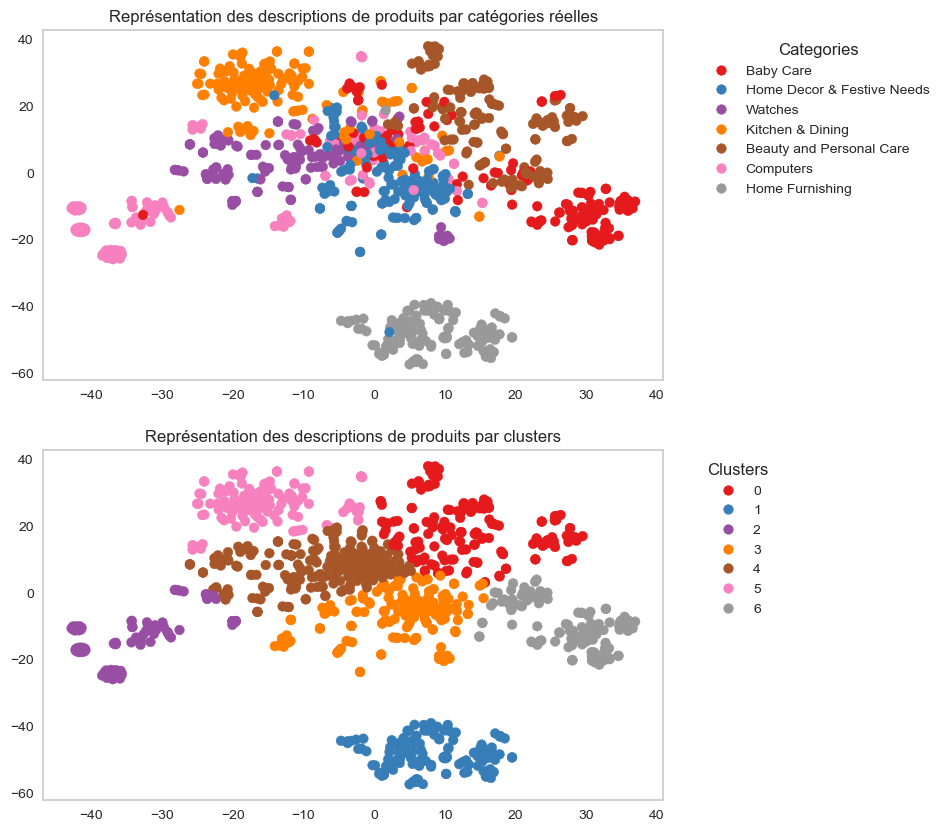

ARI_TSNE :  0.4977


In [126]:
TSNE_visu_fct(X_tsne, y, labels, ARI_TSNE)

In [127]:
df_nltk_lem["CV_Kmeans_TNSE_labels"] = labels

CountVectorizer - TNSE- NLTK_Lem: 
-----------------


CV_Kmeans_TNSE_labels
0    169
1    150
2     97
3    162
4    222
5    128
6    122
dtype: int64

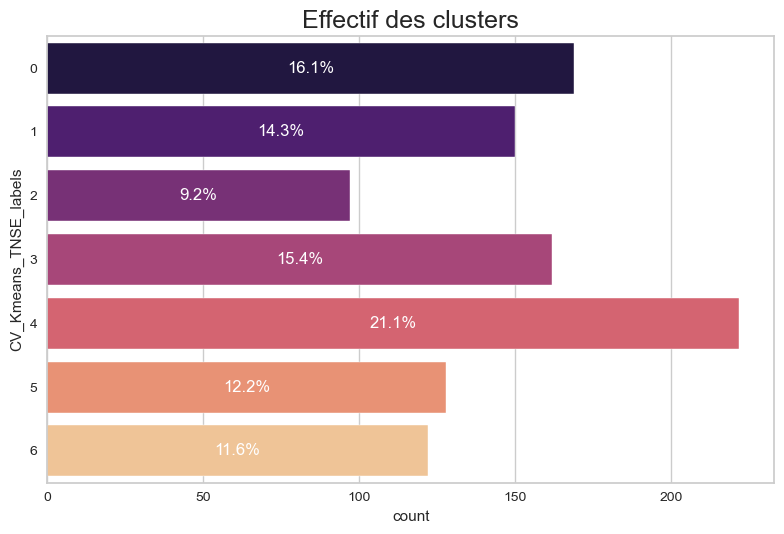

In [128]:
print("CountVectorizer - TNSE- NLTK_Lem: ")
print("-----------------")
eff_cluster(df_nltk_lem, "CV_Kmeans_TNSE_labels")

In [129]:
print("CountVectorizer - PCA - NLTK_Lem: ")
print("-----------------")
ARI_PCA, X_pca, labels = ARI_pca_fct(df_nltk_lem, y, X)

CountVectorizer - PCA - NLTK_Lem: 
-----------------
ARI_PCA :  0.0582 time :  10.0


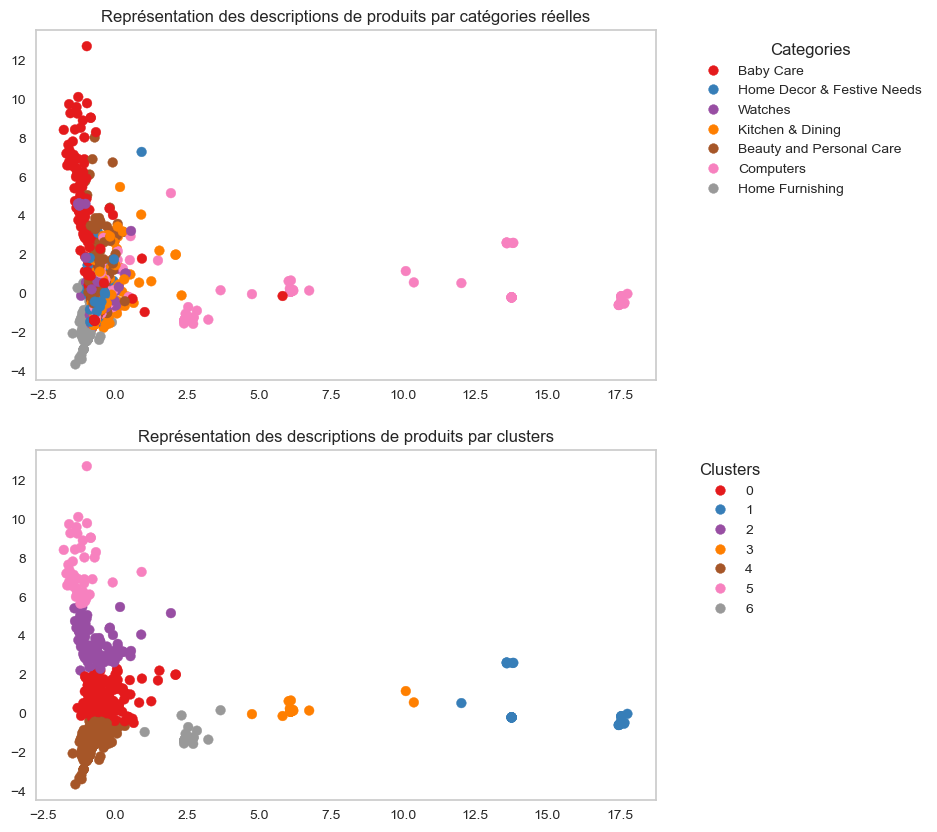

ARI_PCA :  0.0582


In [130]:
PCA_visu_fct(X_pca, y, labels, ARI_PCA)

La visualisation par PCA est nettement moins bonne.

##### 4.1.1.3. TF-IDF

In [131]:
# On instancie un modèle de vectorisation :
tf_idf = TfidfVectorizer()
X = tf_idf.fit_transform(df_nltk_lem.nltk_lem_description_less_strict)

In [132]:
print("TFIDF - TNSE- NLTK_Lem: ")
print("-----------------")
ARI_TSNE, X_tsne, labels = ARI_tsne_fct(df_nltk_lem, y, X)

TFIDF - TNSE- NLTK_Lem: 
-----------------
ARI_TSNE :  0.4804 time :  15.0


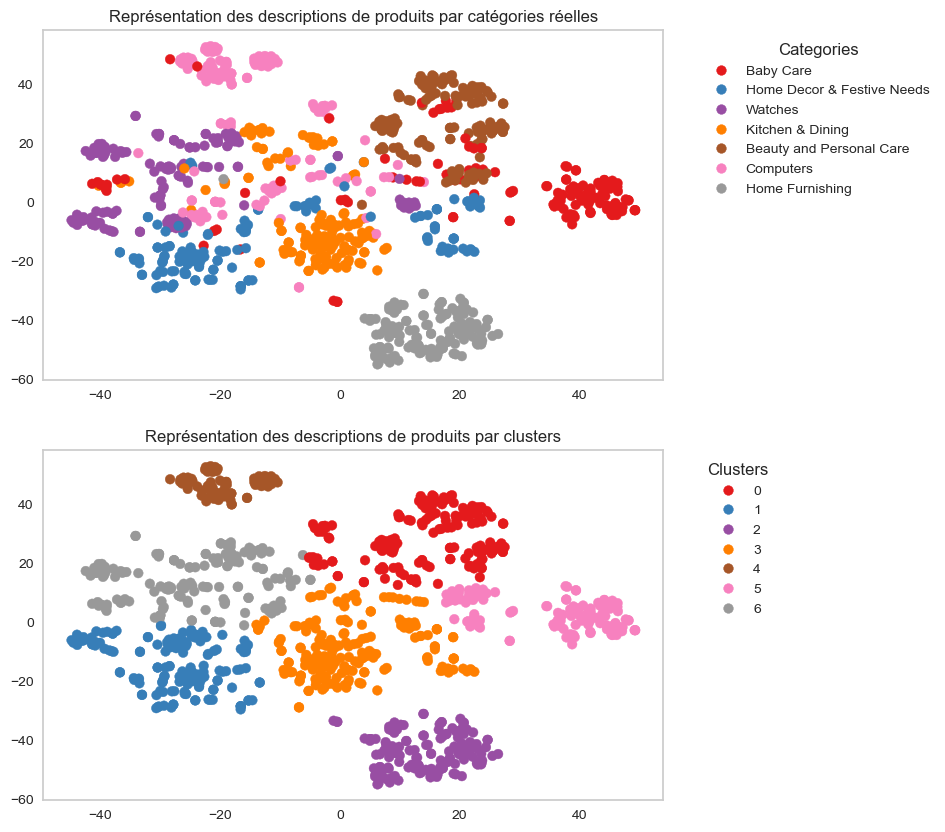

ARI_TSNE :  0.4804


In [133]:
TSNE_visu_fct(X_tsne, y, labels, ARI_TSNE)

In [134]:
df_nltk_lem["TFIDF_Kmeans_TNSE_labels"] = labels

TFIDF - TNSE- NLTK_Lem: 
-----------------


TFIDF_Kmeans_TNSE_labels
0    172
1    160
2    152
3    194
4     76
5    132
6    164
dtype: int64

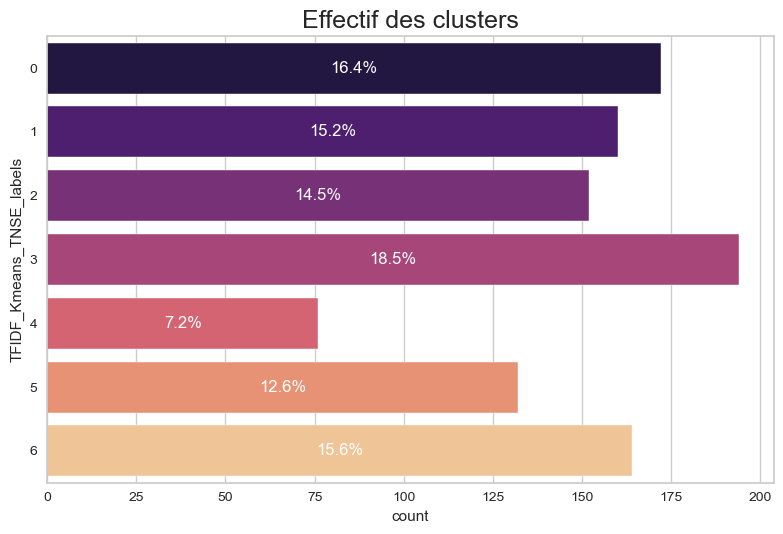

In [135]:
print("TFIDF - TNSE- NLTK_Lem: ")
print("-----------------")
eff_cluster(df_nltk_lem, "TFIDF_Kmeans_TNSE_labels")

### 4.2. Approche Word Embedding

#### 4.2.1 Word2Vec

En me basant sur le notebook modèle mis en ressource du projet.

In [136]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim

On commence avec les tokens créés via SpaCy, il nous faut transformer les descriptions en listes :

In [137]:
df_spacy_bow.columns

Index(['spacy_description_bow', 'product_category', 'CV_Kmeans_TNSE_labels',
       'TFIDF_Kmeans_TNSE_labels'],
      dtype='object')

In [138]:
sentences = df_spacy_bow.spacy_description_bow.to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]
sentences[0]

['elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'floral',
 'curtainelegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'height',
 'pack',
 'curtain',
 'enhance',
 'look',
 'interiorsthis',
 'curtain',
 'high',
 'quality',
 'polyester',
 'fabricit',
 'eyelet',
 'style',
 'stitch',
 'metal',
 'ringit',
 'make',
 'room',
 'environment',
 'romantic',
 'lovingthis',
 'curtain',
 'ant',
 'wrinkle',
 'anti',
 'shrinkage',
 'elegant',
 'apparancegive',
 'home',
 'bright',
 'modernistic',
 'appeal',
 'design',
 'surreal',
 'attention',
 'sure',
 'steal',
 'heart',
 'contemporary',
 'eyelet',
 'valance',
 'curtain',
 'slide',
 'smoothly',
 'draw',
 'apart',
 'thing',
 'morning',
 'welcome',
 'bright',
 'sun',
 'ray',
 'want',
 'wish',
 'good',
 'morning',
 'world',
 'draw',
 'close',
 'evening',
 'create',
 'special',
 'moment',
 'joyous

In [139]:
# Calcul de la longueur de chaque phrase et stockage dans une liste
sentence_lengths = [len(sentence) for sentence in sentences]
# Calcul de la longueur moyenne des phrases
average_length = sum(sentence_lengths) / len(sentence_lengths)
print("Nombre moyen de mots ou tokens par phrase :", average_length)

Nombre moyen de mots ou tokens par phrase : 44.86


In [140]:
# On établit certains paramètres :

w2v_size=100
w2v_window=5
w2v_min_count=1
w2v_epochs=100 
w2v_workers=6
maxlen = 40

In [141]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=w2v_workers)
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 4540
Word2Vec trained


In [142]:
# A partir de là on peut regarder quelques similarités trouvées entre des mots du corpus :

model_vectors.most_similar(positive='girl', topn=10)

[('girls', 0.6397680640220642),
 ('boy', 0.562310516834259),
 ('packagecalculus', 0.5591674447059631),
 ('legge', 0.5368248224258423),
 ('sleepsuit', 0.536743700504303),
 ('dress', 0.5290777683258057),
 ('baby', 0.5193626880645752),
 ('casual', 0.507928192615509),
 ('track', 0.5029990077018738),
 ('inchesmkb', 0.4994896948337555)]

In [143]:
model_vectors.most_similar(positive='design', topn=10)

[('wd', 0.4192371070384979),
 ('skill', 0.4047331213951111),
 ('craft', 0.37771761417388916),
 ('wood', 0.364969938993454),
 ('frame', 0.3437320590019226),
 ('padding', 0.3422680199146271),
 ('ct', 0.3333519995212555),
 ('ms', 0.3213745951652527),
 ('sapatos', 0.31737780570983887),
 ('pvc', 0.3157275915145874)]

In [144]:
model_vectors.most_similar(positive='laptop', topn=10)

[('pad', 0.5453090071678162),
 ('mouse', 0.5446251034736633),
 ('sunlast', 0.49856799840927124),
 ('headphone', 0.48160460591316223),
 ('compatible', 0.47055765986442566),
 ('lapguard', 0.46976327896118164),
 ('zora', 0.4574194550514221),
 ('sg', 0.44514966011047363),
 ('satellite', 0.44340240955352783),
 ('respective', 0.44303539395332336)]

In [145]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                            maxlen = maxlen,
                            padding='post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4541


**Création de la matrice d'embedding**

In [146]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 100
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...


Word embedding rate :  1.0
Embedding matrix: (4541, 100)


**Création du modèle d'embedding**

In [147]:
# Création du modèle

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 40)]              0         
                                                                 
 embedding (Embedding)       (None, 40, 100)           454100    
                                                                 
 global_average_pooling1d (G  (None, 100)              0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 454,100
Trainable params: 454,100
Non-trainable params: 0
_________________________________________________________________


**Exécution du modèle**

In [148]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

33/33 [==============================] - 0s 709us/step


(1050, 100)

In [149]:
# Etablissement/transformation des catégories:
l_cat = list(set(df_spacy_bow.product_category))

# On utilise un LabelEncoder pour transformer notre target, les catégorie de produits, en variables numériques :
encoder = LabelEncoder()
y = encoder.fit_transform(df_spacy_bow.product_category)

In [150]:
ARI, X_tsne, labels = ARI_tsne_fct(df_spacy_bow, y, embeddings)

ARI_TSNE :  0.5248 time :  15.0


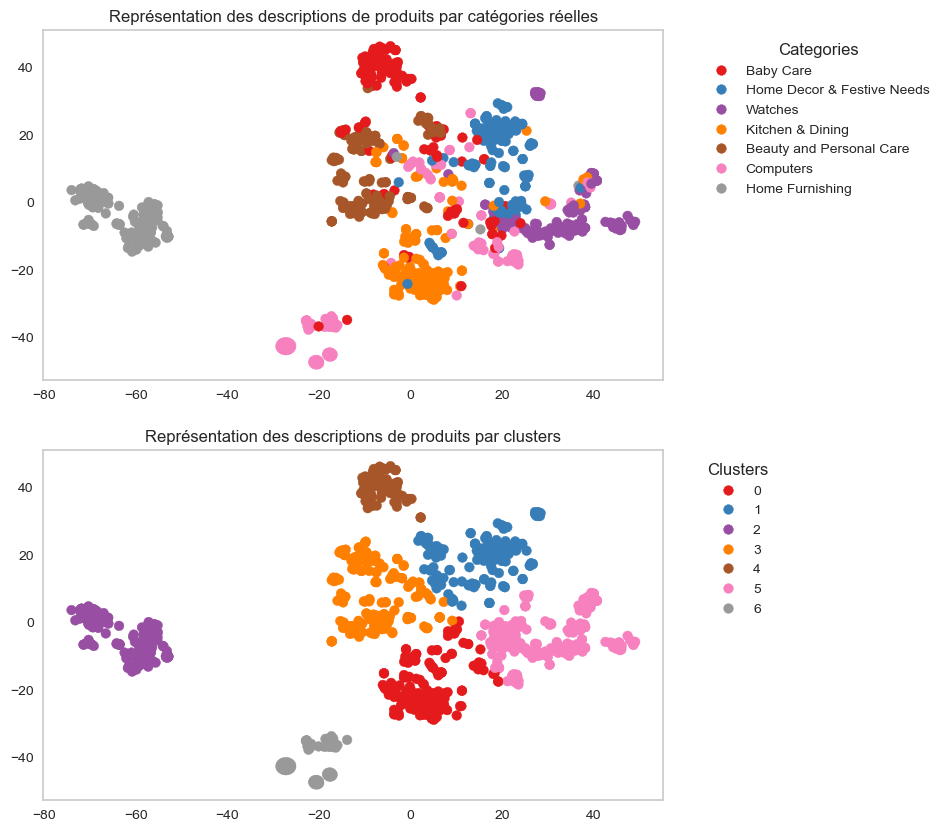

ARI_TSNE :  0.5248


In [151]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

#### 4.2.2. BERT

In [152]:
df_spacy_we = df[['spacy_description_we', 'product_category']]

In [153]:
# import des différents packages nécessaires
import tensorflow as tf
# import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

# Bert
import os
import transformers
from transformers import *

os.environ["TF_KERAS"]='1'

**Fonctions communes**

In [154]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot



**BERT HuggingFace**

'bert-base-uncased'

In [155]:
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)
sentences = df_spacy_we.spacy_description_we.to_list()

loading configuration file config.json from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.32.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading weights file model.safetensors from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734

In [156]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='HF')

loading configuration file config.json from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.32.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file vocab.txt from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\voc

1/1 [==============================] - 0s 416ms/step
temps traitement :  58.0


In [157]:
ARI, X_tsne, labels = ARI_tsne_fct(df_spacy_we, y, features_bert)

ARI_TSNE :  0.388 time :  16.0


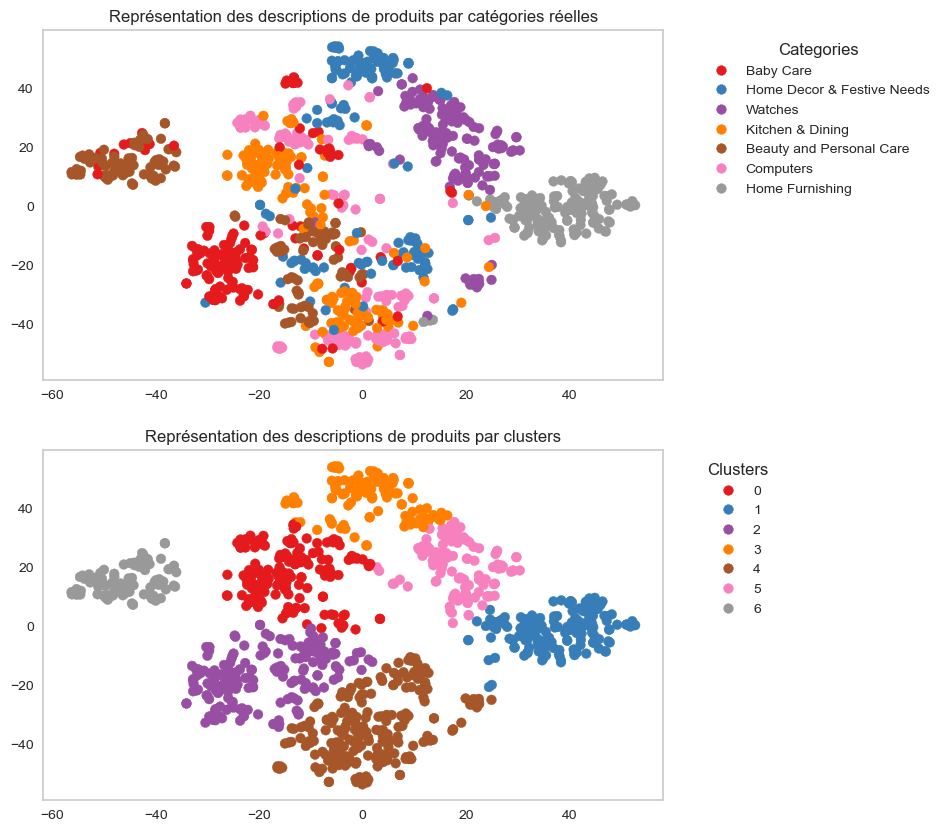

ARI_TSNE :  0.388


In [158]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

**BERT hub Tensorflow**

In [159]:
import tensorflow_hub as hub
import tensorflow_text 

# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_layer = hub.KerasLayer(model_url, trainable=True)

In [160]:
sentences = df_spacy_we.spacy_description_we.to_list()

In [161]:
max_length = 100
batch_size = 10
model_type = 'bert-base-uncased'
model = bert_layer

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='TFhub')

loading configuration file config.json from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.32.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file vocab.txt from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\voc

loading configuration file config.json from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.32.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}



temps traitement :  81.0


In [162]:
ARI, X_tsne, labels = ARI_tsne_fct(df_spacy_we, y, features_bert)

ARI_TSNE :  0.3712 time :  16.0


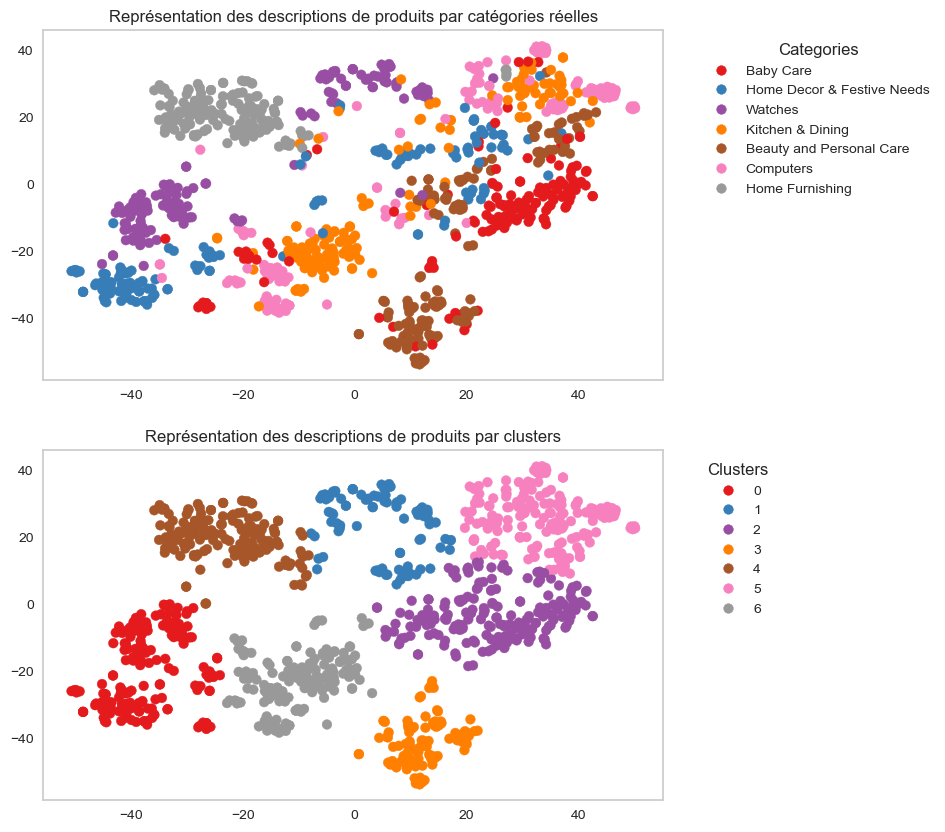

ARI_TSNE :  0.3712


In [163]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

#### 4.2.3 USE

In [164]:
# On charge le modèle :

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [165]:
def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [166]:
batch_size = 10
sentences = df_spacy_we['spacy_description_we'].to_list()

In [167]:
features_USE = feature_USE_fct(sentences, batch_size)

In [168]:
ARI, X_tsne, labels = ARI_tsne_fct(df_spacy_we, y, features_USE)

ARI_TSNE :  0.5199 time :  16.0


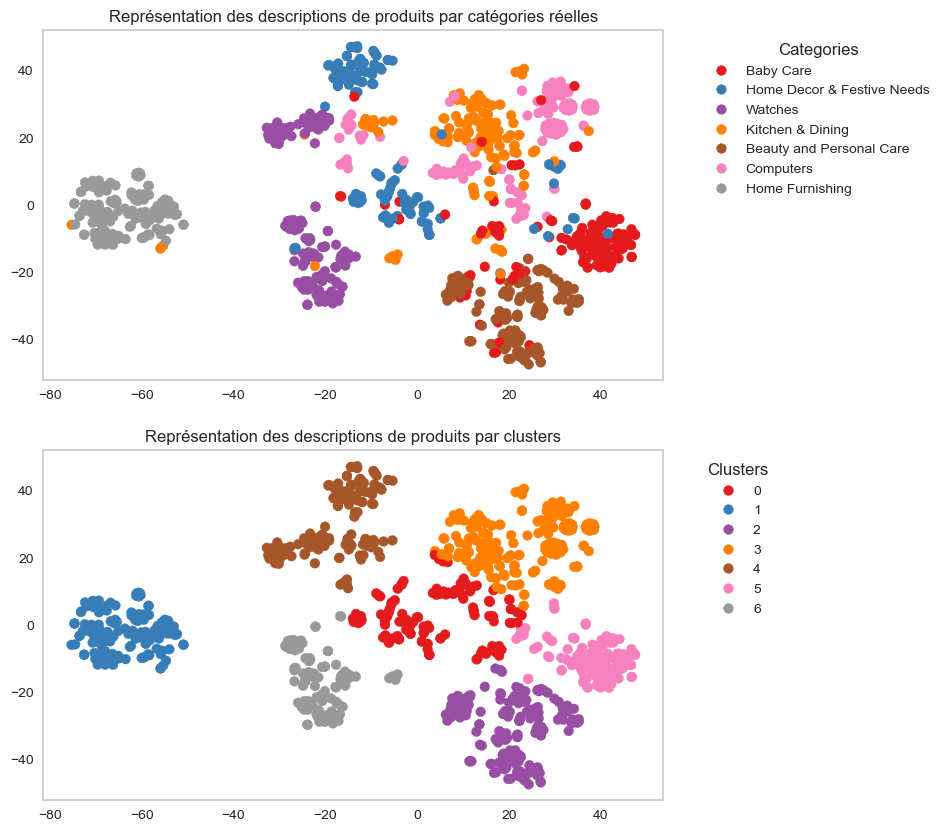

ARI_TSNE :  0.5199


In [169]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

#### 4.3. Tests changement du paramètre perplexity de la T-SNE :

**Je garde le prepro spaCy et modifie le paramètres 'perplexity' de la TSNE et compare les résultats**

-> TSNE à 20 (30 précédemment et par défaut)

In [170]:
# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_tsne_20_fct(df, y_cat_num, features) :

    time1 = time.time()
    num_labels=len(l_cat)
    tsne = TSNE(n_components=2, perplexity=20, n_iter=2000, 
                                 init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(adjusted_rand_score(y, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI_TSNE : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_

In [171]:
# Etablissement/transformation des catégories:
l_cat = list(set(df_spacy_bow.product_category))

# On utilise un LabelEncoder pour transformer notre target, les catégorie de produits, en variables numériques :
encoder = LabelEncoder()
y = encoder.fit_transform(df_spacy_bow.product_category)

**CountVectorizer**

In [172]:
# On instancie un modèle de vectorisation :
cv = CountVectorizer()

# On transorme nos descriptions préprocessées via spaCy :
X = cv.fit_transform(df_spacy_bow.spacy_description_bow)

In [173]:
print("CountVectorizer - TNSE- spaCy: ")
print("-----------------")
ARI_TSNE, X_tsne, labels = ARI_tsne_20_fct(df_spacy_bow, y, X)

CountVectorizer - TNSE- spaCy: 
-----------------
ARI_TSNE :  0.4319 time :  16.0


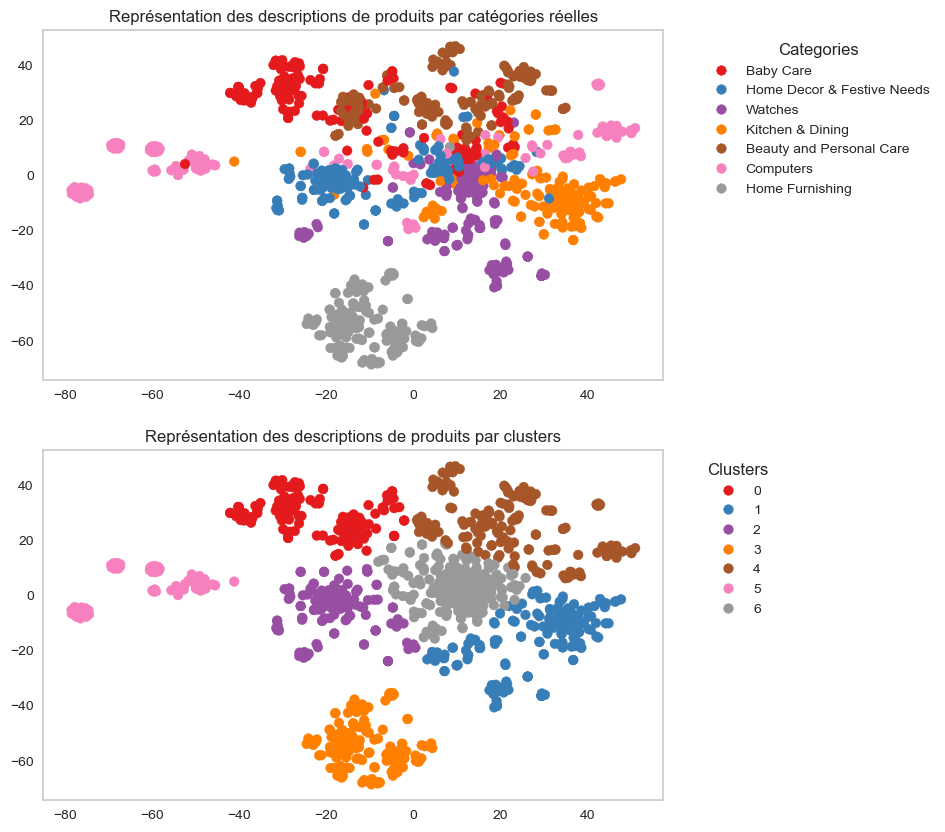

ARI_TSNE :  0.4319


In [174]:
TSNE_visu_fct(X_tsne, y, labels, ARI_TSNE)

La réduction de dimension par PCA donne de nettement moins bons résultats. On se concentrera sur la T-SNE par la suite.

**TF-IDF**

In [175]:
# On instancie un modèle de vectorisation :
tf_idf = TfidfVectorizer()
X = tf_idf.fit_transform(df_spacy_bow.spacy_description_bow)

In [176]:
print("TFIDF - TNSE- spaCy: ")
print("-----------------")
ARI_TSNE, X_tsne, labels = ARI_tsne_20_fct(df_spacy_bow, y, X)

TFIDF - TNSE- spaCy: 
-----------------
ARI_TSNE :  0.6434 time :  16.0


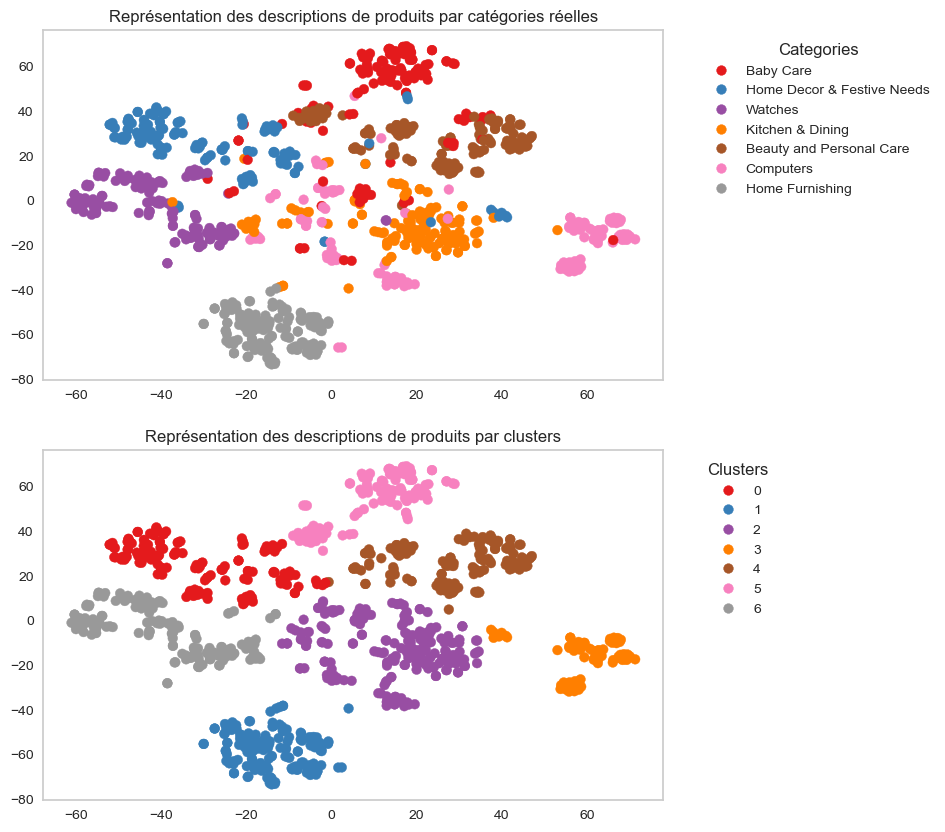

ARI_TSNE :  0.6434


In [177]:
TSNE_visu_fct(X_tsne, y, labels, ARI_TSNE)

**Word2Vec**

Pour W2v on reste sur jeu de données Bow (selon notebook modèle)

En me basant sur le notebook modèle mis en ressource du projet.

On commence avec les tokens créés via SpaCy, il nous faut transformer les descriptions en listes :

In [178]:
sentences = df_spacy_bow.spacy_description_bow.to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]
sentences[0]

['elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'floral',
 'curtainelegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'height',
 'pack',
 'curtain',
 'enhance',
 'look',
 'interiorsthis',
 'curtain',
 'high',
 'quality',
 'polyester',
 'fabricit',
 'eyelet',
 'style',
 'stitch',
 'metal',
 'ringit',
 'make',
 'room',
 'environment',
 'romantic',
 'lovingthis',
 'curtain',
 'ant',
 'wrinkle',
 'anti',
 'shrinkage',
 'elegant',
 'apparancegive',
 'home',
 'bright',
 'modernistic',
 'appeal',
 'design',
 'surreal',
 'attention',
 'sure',
 'steal',
 'heart',
 'contemporary',
 'eyelet',
 'valance',
 'curtain',
 'slide',
 'smoothly',
 'draw',
 'apart',
 'thing',
 'morning',
 'welcome',
 'bright',
 'sun',
 'ray',
 'want',
 'wish',
 'good',
 'morning',
 'world',
 'draw',
 'close',
 'evening',
 'create',
 'special',
 'moment',
 'joyous

In [179]:
# Calcul de la longueur de chaque phrase et stockage dans une liste
sentence_lengths = [len(sentence) for sentence in sentences]
# Calcul de la longueur moyenne des phrases
average_length = sum(sentence_lengths) / len(sentence_lengths)
print("Nombre moyen de mots ou tokens par phrase :", average_length)

Nombre moyen de mots ou tokens par phrase : 44.86


In [180]:
# On établit certains paramètres :

w2v_size=100
w2v_window=5
w2v_min_count=1
w2v_epochs=100 
w2v_workers=6
maxlen = 44

In [181]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=w2v_workers)
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 4540
Word2Vec trained


In [182]:
# A partir de là on peut regarder quelques similarités trouvées entre des mots du corpus :

model_vectors.most_similar(positive='girl', topn=10)

[('girls', 0.5846846699714661),
 ('boy', 0.5597578287124634),
 ('sleepsuit', 0.5383653044700623),
 ('baby', 0.5275997519493103),
 ('dress', 0.5242347121238708),
 ('track', 0.5149728059768677),
 ('legge', 0.5043495893478394),
 ('casual', 0.49782153964042664),
 ('bucket', 0.4863389730453491),
 ('inchesmkb', 0.48073193430900574)]

In [183]:
model_vectors.most_similar(positive='design', topn=10)

[('wd', 0.4467315673828125),
 ('skill', 0.4082799255847931),
 ('craft', 0.35381993651390076),
 ('frame', 0.353054404258728),
 ('padding', 0.34082210063934326),
 ('wood', 0.33459049463272095),
 ('column', 0.3297871947288513),
 ('creation', 0.3287464380264282),
 ('polyester', 0.3283100724220276),
 ('entrance', 0.32000160217285156)]

In [184]:
model_vectors.most_similar(positive='laptop', topn=10)

[('mouse', 0.5601441264152527),
 ('pad', 0.5523590445518494),
 ('sunlast', 0.4946328103542328),
 ('compatible', 0.48523011803627014),
 ('lapguard', 0.48251283168792725),
 ('equip', 0.47908815741539),
 ('backpack', 0.4712953567504883),
 ('respective', 0.4683266878128052),
 ('headphone', 0.4549771845340729),
 ('loading', 0.45088276267051697)]

In [185]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                            maxlen = maxlen,
                            padding='post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4541


**Création de la matrice d'embedding**

In [186]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 100
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (4541, 100)


**Création du modèle d'embedding**

In [187]:
# Création du modèle

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 44)]              0         
                                                                 
 embedding_1 (Embedding)     (None, 44, 100)           454100    
                                                                 
 global_average_pooling1d_1   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 454,100
Trainable params: 454,100
Non-trainable params: 0
_________________________________________________________________


**Exécution du modèle**

In [188]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

33/33 [==============================] - 0s 688us/step


(1050, 100)

In [189]:
# Etablissement/transformation des catégories:
l_cat = list(set(df_spacy_bow.product_category))

# On utilise un LabelEncoder pour transformer notre target, les catégorie de produits, en variables numériques :
encoder = LabelEncoder()
y = encoder.fit_transform(df_spacy_bow.product_category)

In [190]:
ARI, X_tsne, labels = ARI_tsne_20_fct(df_spacy_bow, y, embeddings)

ARI_TSNE :  0.5742 time :  15.0


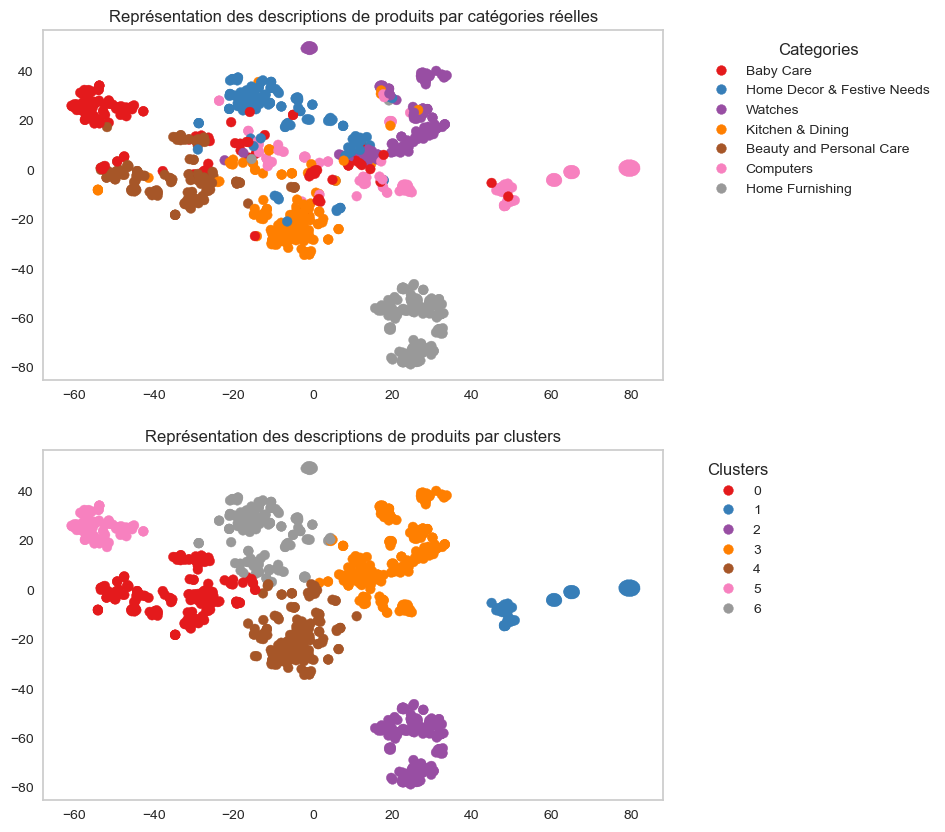

ARI_TSNE :  0.5742


In [191]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

**BERT**

On passe sur jeu de données WE

**Fonctions communes**

**BERT HuggingFace**

'bert-base-uncased'

In [192]:
max_length = 24
batch_size = 10
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)
sentences = df_spacy_we.spacy_description_we.to_list()

loading configuration file config.json from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.32.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading weights file model.safetensors from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734

In [193]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='HF')

loading configuration file config.json from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.32.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file vocab.txt from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\voc

1/1 [==============================] - 0s 222ms/step
temps traitement :  33.0


In [194]:
ARI, X_tsne, labels = ARI_tsne_20_fct(df_spacy_we, y, features_bert)

ARI_TSNE :  0.4826 time :  16.0


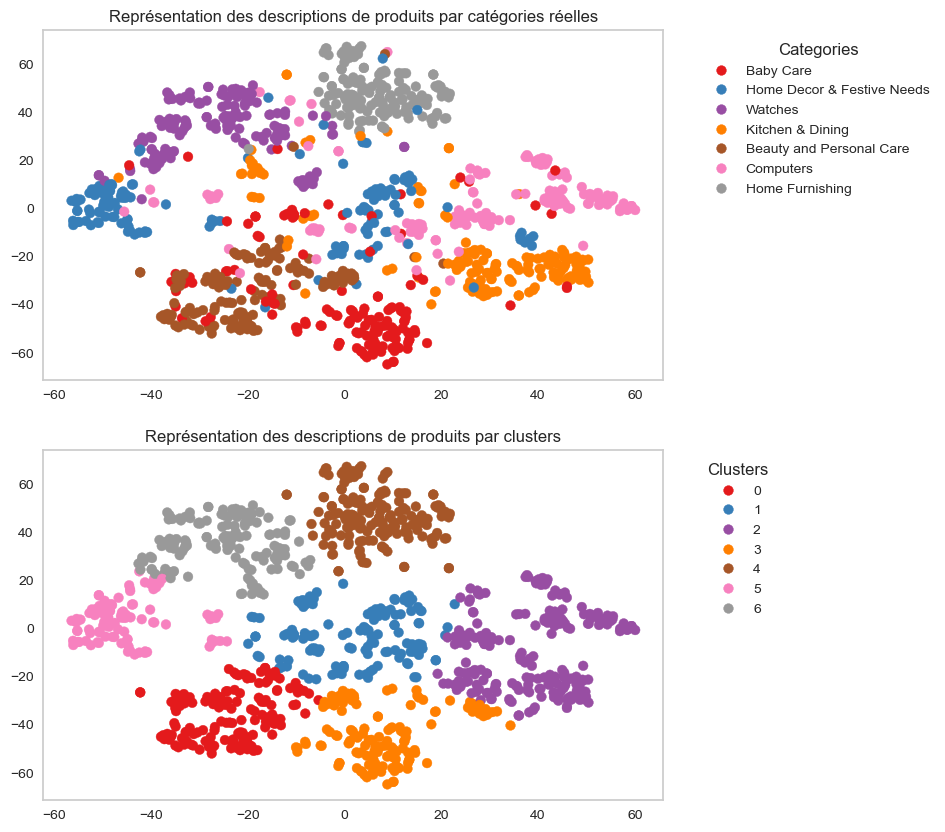

ARI_TSNE :  0.4826


In [195]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

**BERT hub Tensorflow**

In [196]:
# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_layer = hub.KerasLayer(model_url, trainable=True)

In [197]:
sentences = df_spacy_we.spacy_description_we.to_list()

In [198]:
max_length = 32
batch_size = 10
model_type = 'bert-base-uncased'
model = bert_layer

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='TFhub')

loading configuration file config.json from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.32.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file vocab.txt from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\voc

temps traitement :  31.0


In [199]:
ARI, X_tsne, labels = ARI_tsne_20_fct(df_spacy_we, y, features_bert)

ARI_TSNE :  0.5044 time :  16.0


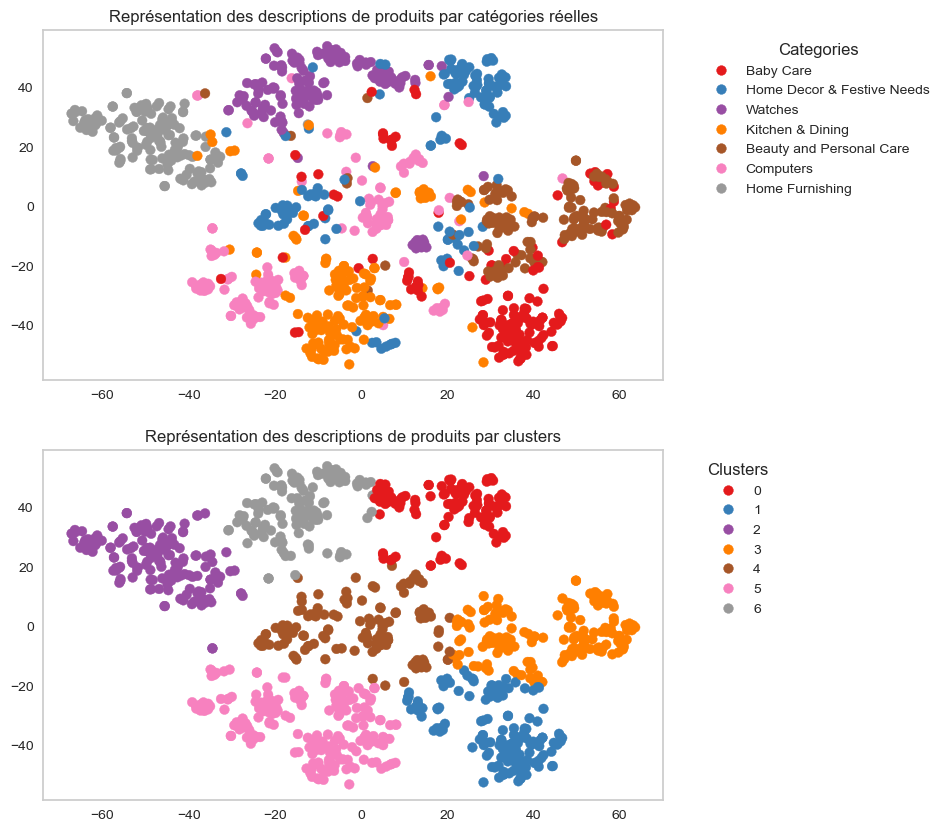

ARI_TSNE :  0.5044


In [200]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

**USE**

In [201]:
# On charge le modèle :

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [202]:
batch_size = 10
sentences = df_spacy_we['spacy_description_we'].to_list()

In [203]:
features_USE = feature_USE_fct(sentences, batch_size)

In [204]:
ARI, X_tsne, labels = ARI_tsne_20_fct(df_spacy_we, y, features_USE)

ARI_TSNE :  0.6473 time :  16.0


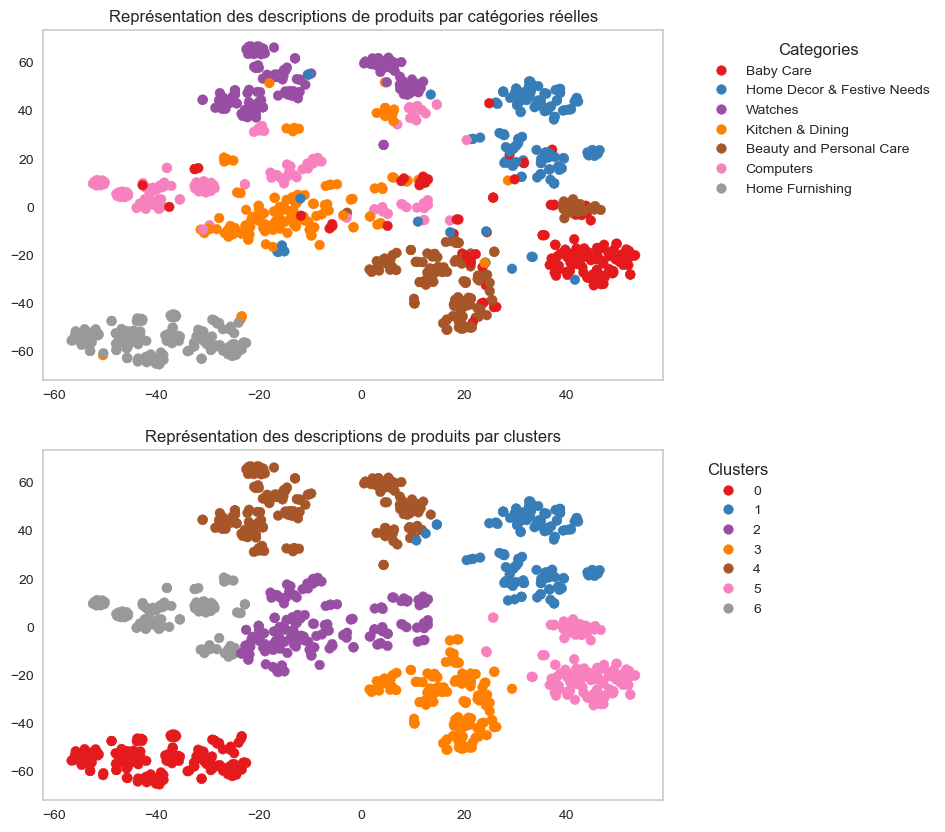

ARI_TSNE :  0.6473


In [205]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

**Je modifie le paramètres 'perplexity' de la TSNE et compare les résultats**

-> TSNE à 40 (30 précédemment et par défaut)

-> on a obtenu de moins bons résultats. Je tente à 25 car les résultats à 20 étaient meilleurs qu'à 30.

In [206]:
# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_tsne_20_fct(df, y_cat_num, features) :

    time1 = time.time()
    num_labels=len(l_cat)
    tsne = TSNE(n_components=2, perplexity=25, n_iter=2000, 
                                 init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(adjusted_rand_score(y, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI_TSNE : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_

In [207]:
# Etablissement/transformation des catégories:
l_cat = list(set(df_spacy_bow.product_category))

# On utilise un LabelEncoder pour transformer notre target, les catégorie de produits, en variables numériques :
encoder = LabelEncoder()
y = encoder.fit_transform(df_spacy_bow.product_category)

**CountVectorizer**

In [208]:
# On instancie un modèle de vectorisation :
cv = CountVectorizer()

# On transorme nos descriptions préprocessées via spaCy :
X = cv.fit_transform(df_spacy_bow.spacy_description_bow)

In [209]:
print("CountVectorizer - TNSE- spaCy: ")
print("-----------------")
ARI_TSNE, X_tsne, labels = ARI_tsne_20_fct(df_spacy_bow, y, X)

CountVectorizer - TNSE- spaCy: 
-----------------
ARI_TSNE :  0.4967 time :  17.0


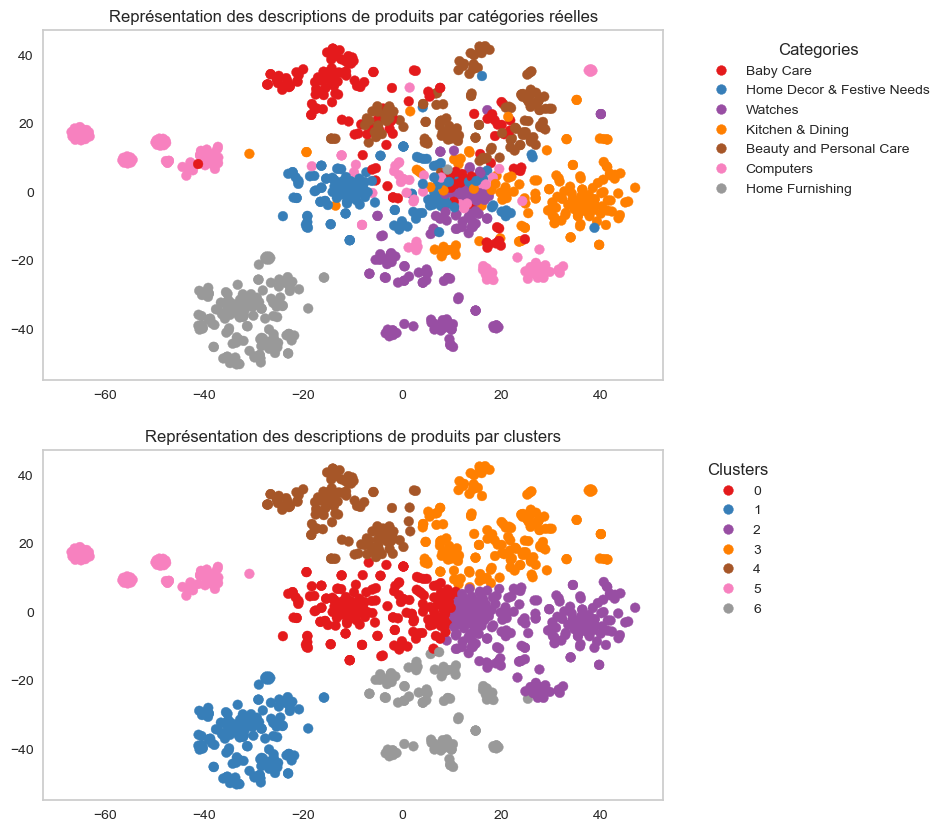

ARI_TSNE :  0.4967


In [210]:
TSNE_visu_fct(X_tsne, y, labels, ARI_TSNE)

La réduction de dimension par PCA donne de nettement moins bons résultats. On se concentrera sur la T-SNE par la suite.

**TF-IDF**

In [211]:
# On instancie un modèle de vectorisation :
tf_idf = TfidfVectorizer()
X = tf_idf.fit_transform(df_spacy_bow.spacy_description_bow)

In [212]:
print("TFIDF - TNSE- spaCy: ")
print("-----------------")
ARI_TSNE, X_tsne, labels = ARI_tsne_20_fct(df_spacy_bow, y, X)

TFIDF - TNSE- spaCy: 
-----------------
ARI_TSNE :  0.5649 time :  16.0


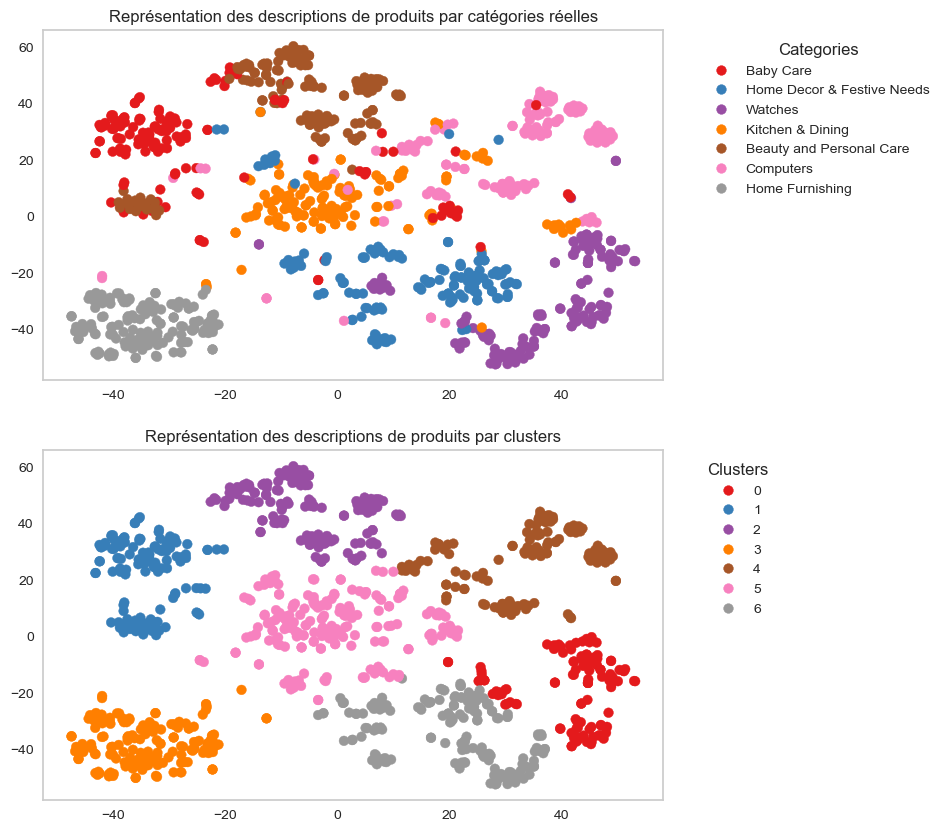

ARI_TSNE :  0.5649


In [213]:
TSNE_visu_fct(X_tsne, y, labels, ARI_TSNE)

**Word2Vec**

Pour W2v on reste sur jeu de données Bow (selon notebook modèle)

En me basant sur le notebook modèle mis en ressource du projet.

On commence avec les tokens créés via SpaCy, il nous faut transformer les descriptions en listes :

In [214]:
sentences = df_spacy_bow.spacy_description_bow.to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]
sentences[0]

['elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'floral',
 'curtainelegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'height',
 'pack',
 'curtain',
 'enhance',
 'look',
 'interiorsthis',
 'curtain',
 'high',
 'quality',
 'polyester',
 'fabricit',
 'eyelet',
 'style',
 'stitch',
 'metal',
 'ringit',
 'make',
 'room',
 'environment',
 'romantic',
 'lovingthis',
 'curtain',
 'ant',
 'wrinkle',
 'anti',
 'shrinkage',
 'elegant',
 'apparancegive',
 'home',
 'bright',
 'modernistic',
 'appeal',
 'design',
 'surreal',
 'attention',
 'sure',
 'steal',
 'heart',
 'contemporary',
 'eyelet',
 'valance',
 'curtain',
 'slide',
 'smoothly',
 'draw',
 'apart',
 'thing',
 'morning',
 'welcome',
 'bright',
 'sun',
 'ray',
 'want',
 'wish',
 'good',
 'morning',
 'world',
 'draw',
 'close',
 'evening',
 'create',
 'special',
 'moment',
 'joyous

In [215]:
# Calcul de la longueur de chaque phrase et stockage dans une liste
sentence_lengths = [len(sentence) for sentence in sentences]
# Calcul de la longueur moyenne des phrases
average_length = sum(sentence_lengths) / len(sentence_lengths)
print("Nombre moyen de mots ou tokens par phrase :", average_length)

Nombre moyen de mots ou tokens par phrase : 44.86


In [216]:
# On établit certains paramètres :

w2v_size=100
w2v_window=5
w2v_min_count=1
w2v_epochs=100 
w2v_workers=6
maxlen = 44

In [217]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=w2v_workers)
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 4540
Word2Vec trained


In [218]:
# A partir de là on peut regarder quelques similarités trouvées entre des mots du corpus :

model_vectors.most_similar(positive='girl', topn=10)

[('girls', 0.6248642802238464),
 ('boy', 0.5400339365005493),
 ('legge', 0.5370904207229614),
 ('packagecalculus', 0.5337470173835754),
 ('dress', 0.5289565324783325),
 ('baby', 0.5214173793792725),
 ('sleepsuit', 0.5152022838592529),
 ('track', 0.5052163004875183),
 ('gather', 0.48761171102523804),
 ('casual', 0.4857769012451172)]

In [219]:
model_vectors.most_similar(positive='design', topn=10)

[('wd', 0.42713338136672974),
 ('craft', 0.39698418974876404),
 ('skill', 0.3797920346260071),
 ('wood', 0.360040545463562),
 ('frame', 0.3544451594352722),
 ('padding', 0.34234991669654846),
 ('ct', 0.34058132767677307),
 ('decorationthese', 0.3278355598449707),
 ('sapatos', 0.32626405358314514),
 ('column', 0.3250771164894104)]

In [220]:
model_vectors.most_similar(positive='laptop', topn=10)

[('pad', 0.5639007091522217),
 ('mouse', 0.5529137849807739),
 ('headphone', 0.4953303635120392),
 ('sunlast', 0.48871928453445435),
 ('respective', 0.4715840220451355),
 ('satellite', 0.46764135360717773),
 ('lapguard', 0.46259260177612305),
 ('pro', 0.45901259779930115),
 ('power', 0.45467042922973633),
 ('equip', 0.45143452286720276)]

In [221]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                            maxlen = maxlen,
                            padding='post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4541


**Création de la matrice d'embedding**

In [222]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 100
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (4541, 100)


**Création du modèle d'embedding**

In [223]:
# Création du modèle

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 44)]              0         
                                                                 
 embedding_2 (Embedding)     (None, 44, 100)           454100    
                                                                 
 global_average_pooling1d_2   (None, 100)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
Total params: 454,100
Trainable params: 454,100
Non-trainable params: 0
_________________________________________________________________


**Exécution du modèle**

In [224]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

33/33 [==============================] - 0s 719us/step


(1050, 100)

In [226]:
# Etablissement/transformation des catégories:
l_cat = list(set(df_spacy_bow.product_category))

# On utilise un LabelEncoder pour transformer notre target, les catégorie de produits, en variables numériques :
encoder = LabelEncoder()
y = encoder.fit_transform(df_spacy_bow.product_category)

In [227]:
ARI, X_tsne, labels = ARI_tsne_20_fct(df_spacy_bow, y, embeddings)

ARI_TSNE :  0.5282 time :  15.0


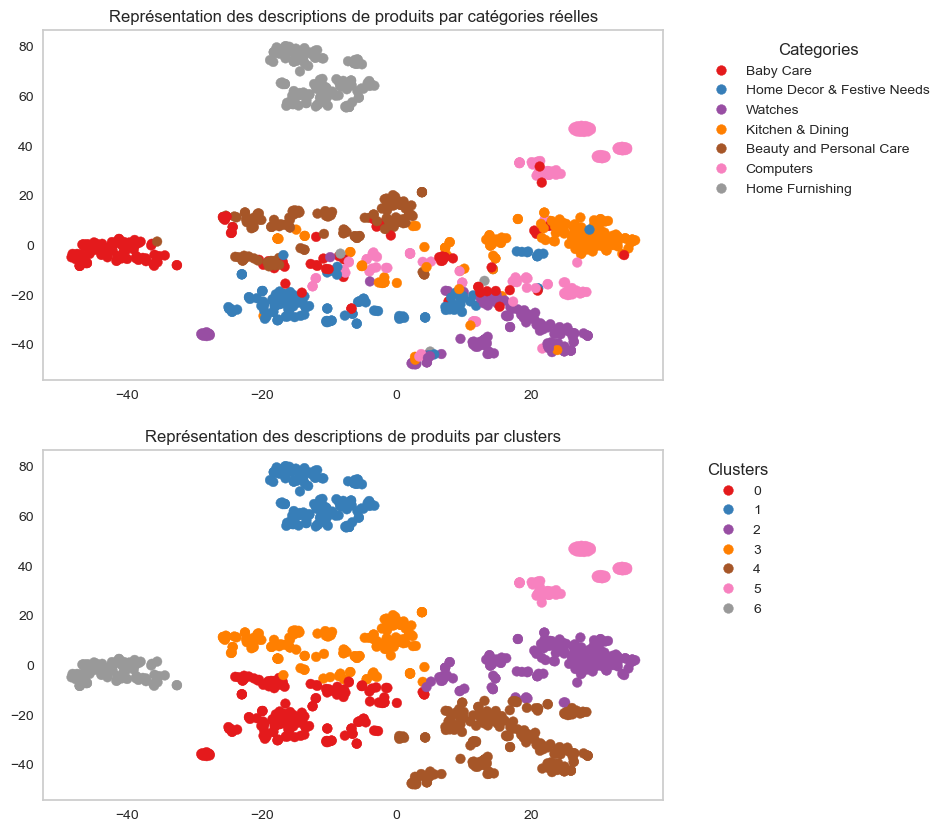

ARI_TSNE :  0.5282


In [228]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

**BERT**

On passe sur jeu de données WE

**Fonctions communes**

**BERT HuggingFace**

'bert-base-uncased'

In [229]:
max_length = 24
batch_size = 10
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)
sentences = df_spacy_we.spacy_description_we.to_list()

loading configuration file config.json from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.32.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading weights file model.safetensors from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734

In [230]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='HF')

loading configuration file config.json from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.32.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file vocab.txt from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\voc

1/1 [==============================] - 0s 220ms/step
temps traitement :  36.0


In [231]:
ARI, X_tsne, labels = ARI_tsne_20_fct(df_spacy_we, y, features_bert)

ARI_TSNE :  0.4622 time :  16.0


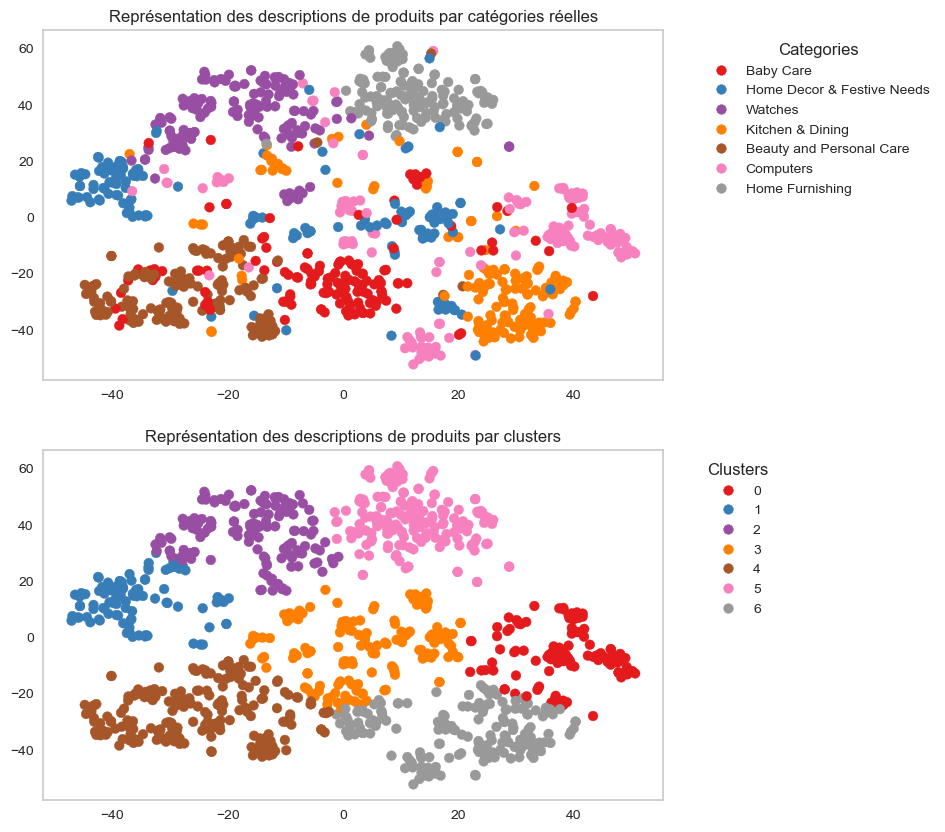

ARI_TSNE :  0.4622


In [232]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

**BERT hub Tensorflow**

In [233]:
# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_layer = hub.KerasLayer(model_url, trainable=True)

In [234]:
sentences = df_spacy_we.spacy_description_we.to_list()

In [235]:
max_length = 32
batch_size = 10
model_type = 'bert-base-uncased'
model = bert_layer

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='TFhub')

loading configuration file config.json from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.32.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file vocab.txt from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\voc

temps traitement :  34.0


In [236]:
ARI, X_tsne, labels = ARI_tsne_20_fct(df_spacy_we, y, features_bert)

ARI_TSNE :  0.4945 time :  16.0


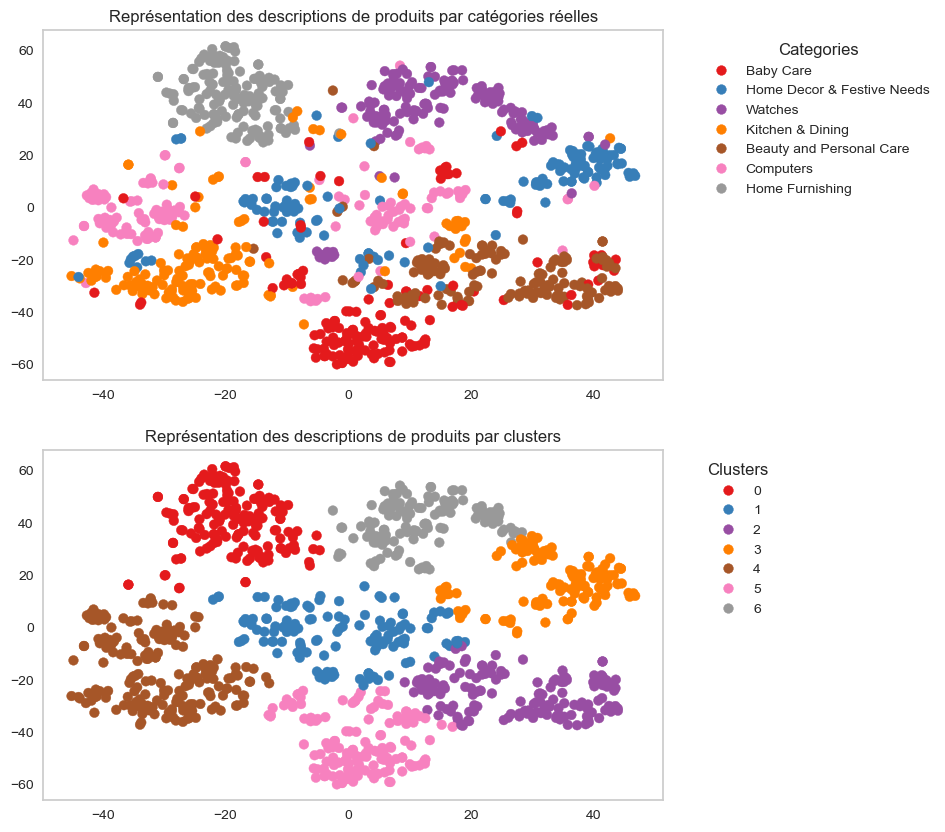

ARI_TSNE :  0.4945


In [237]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

**4.2.3 USE**

In [238]:
# On charge le modèle :

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [239]:
batch_size = 10
sentences = df_spacy_we['spacy_description_we'].to_list()

In [240]:
features_USE = feature_USE_fct(sentences, batch_size)

In [241]:
ARI, X_tsne, labels = ARI_tsne_20_fct(df_spacy_we, y, features_USE)

ARI_TSNE :  0.4933 time :  16.0


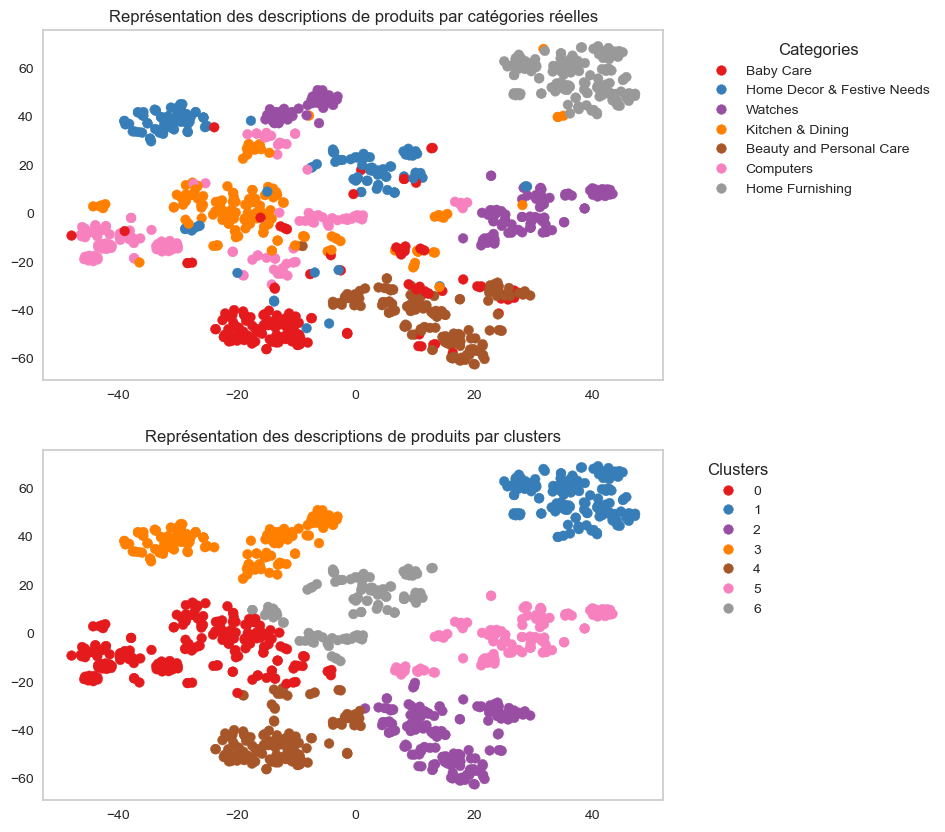

ARI_TSNE :  0.4933


In [242]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

Le meilleur résultat est obtenu avec le modèle USE pour une valeur de perplexity = 20.

In [243]:
# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_tsne_20_fct(df, y_cat_num, features) :

    time1 = time.time()
    num_labels=len(l_cat)
    tsne = TSNE(n_components=2, perplexity=20, n_iter=2000, 
                                 init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(adjusted_rand_score(y, cls.labels_),4)
    time2 = np.round(time.time() - time1,0)
    print("ARI_TSNE : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_

In [244]:
# Etablissement/transformation des catégories:
l_cat = list(set(df_spacy_we.product_category))

# On utilise un LabelEncoder pour transformer notre target, les catégorie de produits, en variables numériques :
encoder = LabelEncoder()
y = encoder.fit_transform(df_spacy_we.product_category)

**BERT HuggingFace**

'bert-base-uncased'

In [245]:
max_length = 24
batch_size = 10
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)
sentences = df_spacy_we.spacy_description_we.to_list()

loading configuration file config.json from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.32.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading weights file model.safetensors from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734

In [246]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='HF')

loading configuration file config.json from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.32.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file vocab.txt from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\voc

1/1 [==============================] - 0s 306ms/step
temps traitement :  42.0


Je tente en réduisant d'abord la dimension via une PCA avec n_components = 0.9 :

In [247]:
pca = PCA(n_components=0.9)
features_bert_pca = pca.fit_transform(features_bert)

In [248]:
ARI, X_tsne, labels = ARI_tsne_20_fct(df_spacy_we, y, features_bert_pca)

ARI_TSNE :  0.5233 time :  16.0


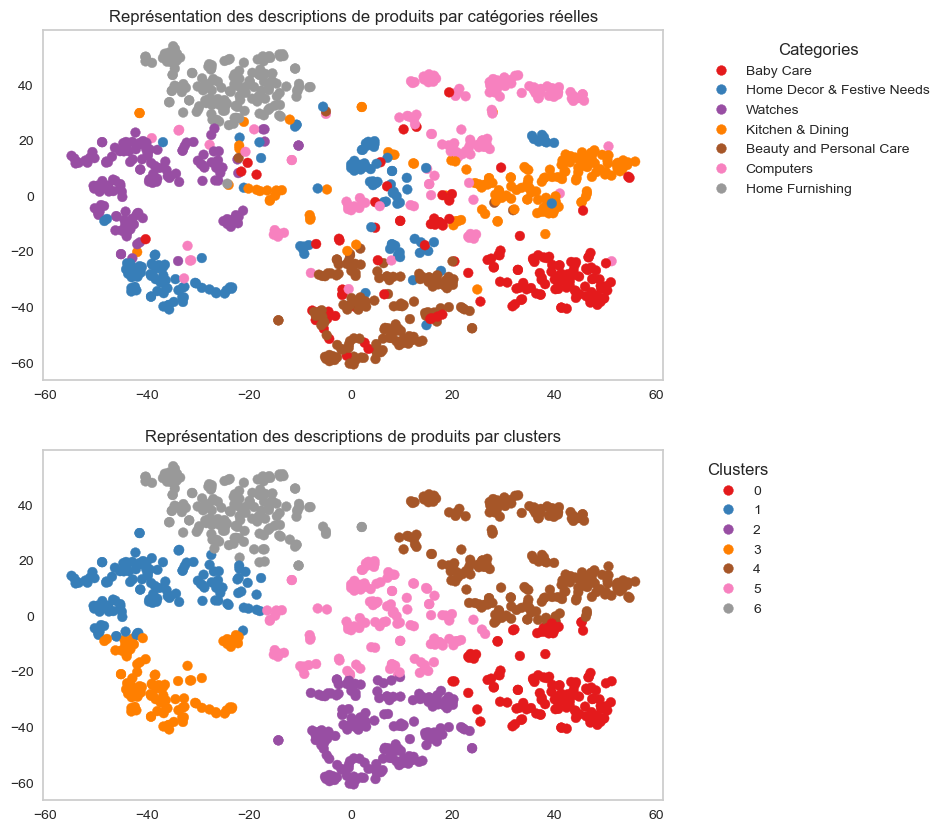

ARI_TSNE :  0.5233


In [249]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

**BERT hub Tensorflow**

In [250]:
# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_layer = hub.KerasLayer(model_url, trainable=True)

In [251]:
sentences = df_spacy_we.spacy_description_we.to_list()

In [252]:
max_length = 32
batch_size = 10
model_type = 'bert-base-uncased'
model = bert_layer

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='TFhub')

loading configuration file config.json from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.32.1",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file vocab.txt from cache at C:\Users\Antoine/.cache\huggingface\hub\models--bert-base-uncased\snapshots\86b5e0934494bd15c9632b12f734a8a67f723594\voc

temps traitement :  43.0


In [253]:
pca = PCA(n_components=0.9)
features_bert_pca = pca.fit_transform(features_bert)

In [254]:
ARI, X_tsne, labels = ARI_tsne_20_fct(df_spacy_we, y, features_bert_pca)

ARI_TSNE :  0.4842 time :  16.0


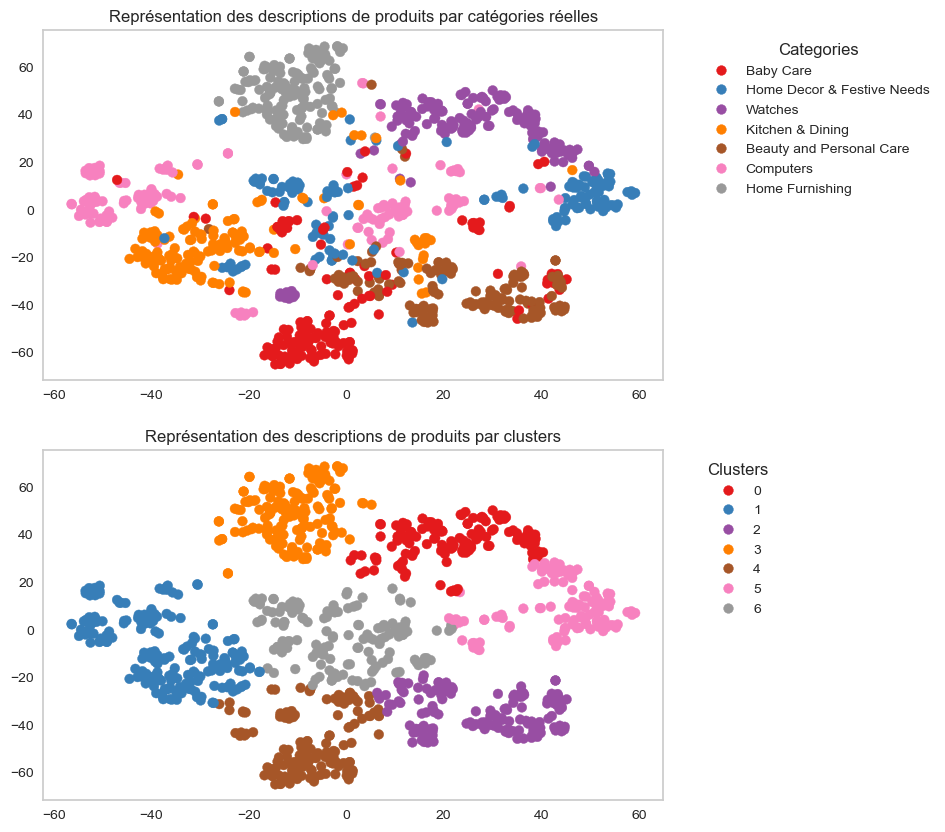

ARI_TSNE :  0.4842


In [255]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

**4.2.3 USE**

In [256]:
# On charge le modèle :

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [257]:
batch_size = 10
sentences = df_spacy_we['spacy_description_we'].to_list()

In [258]:
features_USE = feature_USE_fct(sentences, batch_size)

In [259]:
features_USE_PCA = pca.fit_transform(features_USE)

In [260]:
ARI, X_tsne, labels = ARI_tsne_20_fct(df_spacy_we, y, features_USE_PCA)

ARI_TSNE :  0.6738 time :  16.0


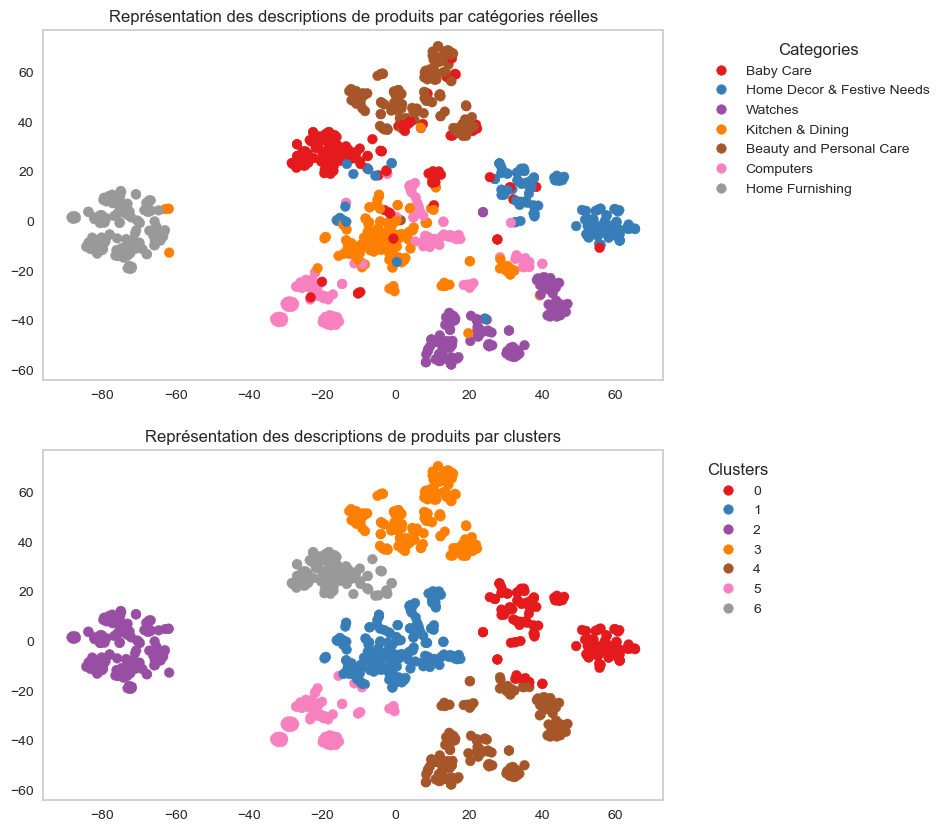

ARI_TSNE :  0.6738


In [261]:
TSNE_visu_fct(X_tsne, y, labels, ARI)

Le travail nécessiterait d'être encore approfondi mais il semble raisonnable de considérer qu'il est possible de réaliser une classification des produits à partir de leur description textuelle.
Nous avons vu qu'avec le preprocessing appliqué grâce au package spaCy, les approches de vectorisation TF-IDF et USE, après avoir réduit la dimension des features, nous donnent résultats intéressant avec un ARI de 0.64 pour l'un et 0.67 pour l'autre.
Par ailleurs les différentes visualisations nous montrent une bonne séparation des produits en fonction de leur catégorie, en particulier pour la catégorie "Home Furnishing", "Beauty and Personnal Care", "Home decor and festive needs" et également "Watches".